## 1) 데이터 로드

In [325]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib notebook
from matplotlib import font_manager, rc
import scipy.cluster.hierarchy as spc
font_name = font_manager.FontProperties(fname="/usr/share/fonts/nanum/nanumGothic.ttf").get_name()
plt.rc('font', family=font_name)
plt.rc('style')
import warnings
warnings.filterwarnings(action='ignore') 
pd.options.display.float_format = '{:.2f}'.format
pd.options.display.max_colwidth=3000
from sklearn.cluster import KMeans

In [ ]:
pd.read_csv()

In [ ]:
pd.read_excel()

In [3]:
data = pd.ExcelFile('KOLON_BENIT_ALARM_HISTORY_20190715.xls')

In [ ]:
df_list = []
for sheet_name in data.sheet_names:
    df = pd.read_excel('KOLON_BENIT_ALARM_HISTORY_20190715.xls', sheet_name=sheet_name)
    df_list.append(df)

In [4]:
data_alarm = [pd.read_excel('KOLON_BENIT_ALARM_HISTORY_20190715.xls', sheet_name=sheet_name) for sheet_name in data.sheet_names]

In [ ]:
data_alarm_result_cp = data_alarm_result.copy()

In [ ]:
type(data_alarm)

In [ ]:
type([data_alarm[0],data_alarm[1]])

In [ ]:
type(data_alarm[0])

In [5]:
data_alarm_result = pd.concat(data_alarm,axis=0)

In [ ]:
del data_alarm ,df_list

In [ ]:
type(data_alarm_result)

In [ ]:
data_alarm_result.shape

In [ ]:
data_alarm_result.head(3)

In [ ]:
data_alarm_result.columns

In [ ]:
data_alarm_result.info()

In [ ]:
data_alarm_result['시스템명'].head()

In [ ]:
data_alarm_result.시스템명.head()

In [ ]:
test = data_alarm_result.iloc[:,3:8]

In [ ]:
type(data_alarm_result['시스템명'])

In [6]:
data_alarm_result.drop(columns=['담당자','처리 이력','확인 시간', '유지보수 상태','처리 현황'],axis=0,inplace=True)

In [ ]:
data_alarm_result.columns

In [7]:
data_alarm_result.columns =  ['degree', 'alarm_name','time','clear_time','last_time','group_path','system_name','hostname','ip','resource_name','full_path','condition']

In [ ]:
data_alarm_result.columns

In [ ]:
data_alarm_result.rename(columns={'degree' : 'test', 'time':'test2'}).head()

In [8]:
data_alarm_result['time'] = pd.to_datetime(data_alarm_result['time'],format='%Y-%m-%d %H:%M:%S')

In [9]:
data_alarm_result['clear_time'] = pd.to_datetime(data_alarm_result['clear_time'],format='%Y-%m-%d %H:%M:%S')

In [ ]:
data_alarm_result.info()

In [10]:
data_alarm_result['last_time'] = (data_alarm_result['clear_time'] - data_alarm_result['time']).dt.seconds

In [ ]:
data_alarm_result.head(10)

In [11]:
data_alarm_result['time_month'] = data_alarm_result['time'].dt.month

In [12]:
data_alarm_result['time_day'] = data_alarm_result['time'].dt.day
data_alarm_result['time_hour'] = data_alarm_result['time'].dt.hour
data_alarm_result['time_weekday'] = data_alarm_result['time'].dt.weekday

In [13]:
data_alarm_result['time_date'] = data_alarm_result['time'].dt.strftime('%Y-%m-%d')
data_alarm_result['time_date_hour'] = data_alarm_result['time'].dt.strftime('%Y-%m-%d %H')

In [14]:
data_alarm_result['group_path'].str.split('>',expand=True)

,0,1,2,3,4
0,시스템그룹,공통,None,None,None
1,시스템그룹,제조,None,None,None
2,시스템그룹,패션,None,None,None
3,인프라그룹,네트워크,데이터센터,None,None
4,인프라그룹,네트워크,데이터센터,None,None
5,시스템그룹,제조,None,None,None
6,인프라그룹,네트워크,해외 법인,인더제조 남경,None
7,인프라그룹,네트워크,데이터센터,None,None
8,인프라그룹,네트워크,데이터센터,None,None
9,인프라그룹,네트워크,해외 법인,인더제조 남경,None


In [ ]:
data_alarm_result.shape

In [15]:
data_alarm_result = pd.concat([data_alarm_result,data_alarm_result['group_path'].str.split('>',expand=True)],axis=1)

In [16]:
data_alarm_result.rename(columns={0:'group1',1:'group2',2:'group3',3:'group4',4:'group5'},inplace=True)

In [ ]:
data_alarm_result

In [17]:
ipaddr = data_alarm_result['ip'].str.split('.', expand=True)

In [18]:
ipaddr[3] = "0"

In [ ]:
ipaddr.head()

In [19]:
data_alarm_result['C_class']= ipaddr[0] + '.' + ipaddr[1] + '.' + ipaddr[2] + '.' + ipaddr[3]

In [20]:
ipaddr[2] = "0"

In [21]:
data_alarm_result['B_class']= ipaddr[0] + '.' + ipaddr[1] + '.' + ipaddr[2] + '.' + ipaddr[3]

In [ ]:
data_alarm_result.head()

In [ ]:
data_alarm_result[(data_alarm_result['degree'] == "경고")&(data_alarm_result['alarm_name'].str.contains('Memory'))]

In [ ]:
data_alarm_result[(data_alarm_result['degree'] == "경고")&(data_alarm_result['alarm_name'].isin(['파워 상태','Memory 사용률']))]

In [32]:
data_alarm_result = data_alarm_result[data_alarm_result['degree'] != "해제"]

In [ ]:
alarm_count = data_alarm_result.groupby(['degree'])['alarm_name'].count().reset_index()

In [ ]:
alarm_count['per'] = ((alarm_count['alarm_name']/alarm_count['alarm_name'].sum(axis=0)) * 100).round(1)

In [ ]:
alarm_count

In [ ]:
alarm_count_month = data_alarm_result.groupby(['degree','time_month'])['alarm_name'].count().reset_index()

In [ ]:
alarm_count_month.head()

In [ ]:
alarm_count_month = alarm_count_month.pivot_table(values='alarm_name',index='degree',columns='time_month').reset_index()

In [ ]:
alarm_count_month

In [ ]:
alarm_count_month = alarm_count_month.set_index('degree')

In [ ]:
for col in alarm_count_month.columns:
    alarm_count_month[str(col)+'_per'] = ((alarm_count_month[col]/alarm_count_month.sum(axis=1))*100).round(1)

In [ ]:
alarm_count_month

In [ ]:
alarm_count_month.sum(axis=1)

In [ ]:
alarm_count_month

In [ ]:
test = alarm_count_month.values/np.array([[12545],[20387],[8885]])

In [ ]:
test

In [ ]:
alarm_count_month.describe()

In [ ]:
alarm_day = data_alarm_result.groupby(['degree','time_date'])['alarm_name'].count().reset_index()

In [ ]:
pd.to_datetime(alarm_day['time_date'],format='%Y-%m-%d').dt.strftime('%y%m%d').head()

In [ ]:
alarm_day = alarm_day.pivot_table(values='alarm_name',index='degree',columns='time_date',fill_value=0).reset_index().set_index('degree').T

In [ ]:
alarm_day['total'] = alarm_day.sum(axis=1)

In [ ]:
alarm_day.T.to_excel('test.xlsx',encoding='UTF-8')

In [ ]:
display(alarm_day.T)

In [ ]:
def make_alarm_df(col):
    alarm_df = data_alarm_result.groupby(['degree',col])['alarm_name'].count().reset_index()
    alarm_df = alarm_df.pivot_table(values='alarm_name',index='degree',columns=col,fill_value=0).reset_index().set_index('degree').T
    alarm_df['total'] = alarm_df.sum(axis=1)
    display(alarm_df.T)

In [ ]:
make_alarm_df('time_weekday')

In [ ]:
make_alarm_df('time_day')

In [ ]:
make_alarm_df('time_hour')

In [ ]:
data_alarm_result.columns

In [ ]:
group_alarm = data_alarm_result.groupby(['group1','group2'])['alarm_name'].count().reset_index()

In [ ]:
group_alarm['per'] = ((group_alarm.alarm_name/data_alarm_result.shape[0])*100).round(2)

In [ ]:
group_alarm.sort_values('per',ascending=False)

In [ ]:
group_alarm[group_alarm['group1'] == '기타서버그룹'].sort_values('per',ascending=False)

In [ ]:
group_alarm.sort_values('per',ascending=False)['group1'].unique()

In [ ]:
data_alarm_result

In [ ]:
def make_group2_alarm(group):
    df_list = []
    df_alarm = data_alarm_result[data_alarm_result['group1'] == group]
    for group2 in df_alarm['group2'].unique():
        df_alarm_sub = df_alarm[df_alarm['group2'] == group2]
        df = df_alarm_sub.groupby(['group2','alarm_name','degree'])['time'].count().reset_index()
        df = df.pivot_table(values='time',index=['group2','alarm_name'],columns='degree',fill_value=0).reset_index()
        df['sum'] = df.sum(axis=1)
        df['per'] = ((df['sum']/data_alarm_result.shape[0])*100).round(1)
        df = df.sort_values('sum',ascending=False).head(5)
        df_list.append(df)
    
    index = sorted({i:df_group['sum'].sum() for i,df_group in enumerate(df_list)}.items(), key=lambda x: x[1], reverse=True)
    df_list = [ df_list[i[0]] for i in index]
    df_result = pd.concat(df_list,axis=0).fillna(0)[['group2','alarm_name','주의','경고','심각','sum','per']]
    df_result['주의'] = df_result['주의'].astype('int')
    df_result['경고'] = df_result['경고'].astype('int')
    df_result['심각'] = df_result['심각'].astype('int')
    return df_result

In [ ]:
make_group2_alarm('인프라그룹')

In [ ]:
type_alarm = data_alarm_result.groupby(['alarm_name'])['time'].count().reset_index().sort_values('time',ascending=False)

In [ ]:
type_alarm['per'] = ((type_alarm['time']/data_alarm_result.shape[0])*100).round(1)

In [ ]:
type_alarm.head()

In [ ]:
degree_alarm = data_alarm_result.groupby(['alarm_name','degree'])['time'].count().reset_index().sort_values('time',ascending=False)

In [ ]:
degree_alarm['per'] = ((degree_alarm['time']/data_alarm_result.shape[0])*100).round(1)

In [ ]:
for degree in ['주의','경고','심각']:
   display(degree_alarm[degree_alarm['degree']==degree].head())

In [ ]:
total_host_alarm = data_alarm_result.groupby(['system_name'])['time'].count().reset_index().sort_values('time',ascending=False)

In [ ]:
nodes = total_host_alarm['system_name'].head(10).values

In [ ]:
def make_host_alarm(nodes):
    df_list = []
    df_alarm = data_alarm_result
    for node in nodes:
        df_alarm_sub = df_alarm[df_alarm['system_name'] == node]
        df = df_alarm_sub.groupby(['system_name','alarm_name','degree'])['time'].count().reset_index()
        df = df.pivot_table(values='time',index=['system_name','alarm_name'],columns='degree',fill_value=0).reset_index()
        df['sum'] = df.sum(axis=1)
        df['per'] = ((df['sum']/data_alarm_result.shape[0])*100).round(1)
        df = df.sort_values('sum',ascending=False).head(5)
        df_list.append(df)
    
    index = sorted({i:df_group['sum'].sum() for i,df_group in enumerate(df_list)}.items(), key=lambda x: x[1], reverse=True)
    df_list = [ df_list[i[0]] for i in index]
    df_result = pd.concat(df_list,axis=0).fillna(0)[['system_name','alarm_name','주의','경고','심각','sum','per']]
    df_result['주의'] = df_result['주의'].astype('int')
    df_result['경고'] = df_result['경고'].astype('int')
    df_result['심각'] = df_result['심각'].astype('int')
    return df_result

In [ ]:
make_host_alarm(nodes).head()

In [ ]:
def make_host_degree_alarm(degree):
    df_list = []
    df_alarm = data_alarm_result[data_alarm_result['degree'] == degree]
    nodes = df_alarm.groupby(['system_name'])['time'].count().reset_index().sort_values('time',ascending=False)['system_name'].head(10).values
    for node in nodes:
        df_alarm_sub = df_alarm[df_alarm['system_name'] == node]
        df = df_alarm_sub.groupby(['system_name','alarm_name'])['time'].count().reset_index()
        df['sum'] = df.sum(axis=1)
        df['per'] = ((df['sum']/data_alarm_result.shape[0])*100).round(1)
        df = df.sort_values('sum',ascending=False).head(5)
        df_list.append(df)
    
    index = sorted({i:df_group['sum'].sum() for i,df_group in enumerate(df_list)}.items(), key=lambda x: x[1], reverse=True)
    df_list = [ df_list[i[0]] for i in index]
    df_result = pd.concat(df_list,axis=0).fillna(0)[['system_name','alarm_name','sum','per']]
    return df_result

In [ ]:
make_host_degree_alarm('심각').head()

In [52]:
date_alarm = data_alarm_result[(data_alarm_result['time'] >= '2019-06-09')&(data_alarm_result['time'] <= '2019-07-05')]

In [53]:
date_alarm_total = date_alarm.groupby(['time_date','alarm_name'])['time'].count().reset_index().pivot_table(values='time',index='alarm_name',columns='time_date',fill_value=0).reset_index()

In [54]:
date_alarm_total

time_date,alarm_name,2019-06-09,2019-06-10,2019-06-11,2019-06-12,2019-06-13,2019-06-14,2019-06-15,2019-06-16,2019-06-17,...,2019-06-25,2019-06-26,2019-06-27,2019-06-28,2019-06-29,2019-06-30,2019-07-01,2019-07-02,2019-07-03,2019-07-04
0,1분 이상 블록된 세션 발생,0,4,1,1,2,4,0,2,8,...,2,0,1,0,0,0,4,0,1,0
1,ABAPDump,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,AP 다운,0,0,0,4,0,6,0,0,0,...,0,0,1,0,0,0,0,0,6,1
3,Active 세션수,1,12,7,5,7,6,1,3,5,...,12,1,5,3,4,1,5,2,2,4
4,Alert(CRITICAL) 에러 발생,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,CPU 사용률,5,22,21,7,27,12,9,8,10,...,21,26,25,12,5,7,16,12,8,6
6,CRC 오류,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,114,286,253,227
7,DB연결상태확인,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
8,Data 파일 사용률 과다,0,592,406,28,28,29,30,33,7,...,7,5,12,12,12,8,9,9,5,0
9,Disk I/O 처리율,794,909,927,874,1053,1041,1048,930,1072,...,893,954,1043,1079,965,912,1134,1142,868,768


In [42]:
date_alarm_total['sum'] = date_alarm_total.sum(axis=1)
date_alarm_total['per'] = ((date_alarm_total['sum']/data_alarm_result.shape[0])*100).round(1)

In [43]:
date_alarm_total.sort_values('sum',ascending=False).head(10)

time_date,alarm_name,2019-06-09,2019-06-10,2019-06-11,2019-06-12,2019-06-13,2019-06-14,2019-06-15,2019-06-16,2019-06-17,...,2019-06-27,2019-06-28,2019-06-29,2019-06-30,2019-07-01,2019-07-02,2019-07-03,2019-07-04,sum,per
45,응답시간 감시,0,0,768,2262,2555,2213,2313,2269,2275,...,2666,2274,2383,2247,1662,51,87,44,47618,30.8
9,Disk I/O 처리율,794,909,927,874,1053,1041,1048,930,1072,...,1043,1079,965,912,1134,1142,868,768,25874,16.7
55,포트 다운,406,1630,1095,1066,446,467,220,164,341,...,293,445,372,214,186,0,2,0,9650,6.2
33,데드락 발생,0,245,406,381,422,365,323,327,384,...,379,340,301,329,389,348,422,393,9178,5.9
17,Memory 사용률,169,191,124,146,236,312,138,233,192,...,65,48,44,50,78,52,103,136,3650,2.4
13,ICMP 응답시간,7,138,129,207,139,171,35,7,205,...,393,215,45,25,88,2,1,4,3132,2.0
29,WAS 평균응답시간,0,0,504,712,376,0,0,0,0,...,0,0,0,0,0,0,0,0,1592,1.0
36,블록된 세션,0,34,48,38,64,64,46,53,60,...,56,44,50,40,58,52,71,66,1302,0.8
8,Data 파일 사용률 과다,0,592,406,28,28,29,30,33,7,...,12,12,12,8,9,9,5,0,1281,0.8
53,트래픽 Tx 사용률,71,40,25,34,44,52,20,17,12,...,102,18,61,15,33,26,0,8,1001,0.6


In [58]:
response_time = date_alarm[date_alarm['alarm_name'] == "응답시간 감시"]

In [73]:
threshold_df = response_time.condition.str.split(' ',expand=True)

In [88]:
threshold_df[2] = threshold_df[2].str.extract('(\d+(?:\.\d+)?)').astype(float)

In [89]:
threshold_df[5] = threshold_df[5].str.extract('(\d+(?:\.\d+)?)').astype(float)

In [108]:
threshold_df = threshold_df.rename(columns={2:'cur',5:'threshold'})[['cur','threshold']]

In [90]:
threshold_df[6].unique()

array(['sec)]'], dtype=object)

In [92]:
threshold_df[2] = np.where( threshold_df[6].str.contains('ms'), threshold_df[2]/100, threshold_df[2])

In [116]:
response_time = pd.concat([response_time,threshold_df],axis=1)

In [117]:
response_time

,degree,alarm_name,time,clear_time,last_time,group_path,system_name,hostname,ip,resource_name,...,time_date_hour,group1,group2,group3,group4,group5,C_class,B_class,cur,threshold
14130,경고,응답시간 감시,2019-07-04 15:34:31,2019-07-04 15:35:24,53.0,기타서버그룹>WebService>SmartWork팀,포탈 스카이프_스카이프서비스_스카이프서비스,NaN,NaN,포탈 스카이프_스카이프서비스_스카이프서비스,...,2019-07-04 15,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,7.8,5.0
14200,경고,응답시간 감시,2019-07-04 15:15:38,2019-07-04 15:18:36,178.0,시스템그룹>IT관리>WebService,베니터스 로그인,NaN,NaN,베니터스 로그인,...,2019-07-04 15,시스템그룹,IT관리,WebService,None,None,NaN,NaN,5.3,5.0
14207,경고,응답시간 감시,2019-07-04 15:14:27,2019-07-04 15:17:01,154.0,기타서버그룹>WebService>SmartWork팀,SSO(통합인증시스템) Agent_패션CB_패션CB,NaN,NaN,SSO(통합인증시스템) Agent_패션CB_패션CB,...,2019-07-04 15,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,6.7,5.0
14316,경고,응답시간 감시,2019-07-04 14:42:51,2019-07-04 14:43:47,56.0,기타서버그룹>WebService>SmartWork팀,IKEN 포탈_메인_매경주가정보,NaN,NaN,IKEN 포탈_메인_매경주가정보,...,2019-07-04 14,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,5.5,5.0
14440,경고,응답시간 감시,2019-07-04 14:07:17,2019-07-04 14:09:52,155.0,기타서버그룹>WebService>SmartWork팀,웹하드_사용자_로그인,NaN,NaN,웹하드_사용자_로그인,...,2019-07-04 14,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,5.3,5.0
14824,경고,응답시간 감시,2019-07-04 12:08:53,2019-07-04 12:09:43,50.0,기타서버그룹>WebService>Smart Factory팀,FB4,NaN,NaN,FB4,...,2019-07-04 12,기타서버그룹,WebService,Smart Factory팀,None,None,NaN,NaN,9.7,5.0
15209,경고,응답시간 감시,2019-07-04 10:28:25,2019-07-04 10:29:20,55.0,기타서버그룹>WebService>SmartWork팀,IKEN 포탈_메인_매경주가정보,NaN,NaN,IKEN 포탈_메인_매경주가정보,...,2019-07-04 10,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,5.5,5.0
15579,경고,응답시간 감시,2019-07-04 09:01:50,2019-07-04 09:02:43,53.0,기타서버그룹>WebService>SmartWork팀,웹사이트_코오롱인더스트리_사용자_메인,NaN,NaN,웹사이트_코오롱인더스트리_사용자_메인,...,2019-07-04 09,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,7.0,5.0
15580,경고,응답시간 감시,2019-07-04 09:01:50,2019-07-04 09:02:43,53.0,기타서버그룹>WebService>SmartWork팀,웹사이트_코오롱인더스트리_관리자_관리자_로그인 페이지,NaN,NaN,웹사이트_코오롱인더스트리_관리자_관리자_로그인 페이지,...,2019-07-04 09,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,9.2,5.0
15637,경고,응답시간 감시,2019-07-04 08:46:53,2019-07-04 08:47:43,50.0,기타서버그룹>WebService>SmartWork팀,웹사이트_코오롱생명과학_website_kolonls_website_kolonls,NaN,NaN,웹사이트_코오롱생명과학_website_kolonls_website_kolonls,...,2019-07-04 08,기타서버그룹,WebService,SmartWork팀,None,None,NaN,NaN,9.7,5.0


In [219]:
def make_hist(x,y):
    count,bins=np.histogram(response_time[x],bins=y)
    bins = [x.round(2) for x in bins]
    bins = ['{} ~ {}'.format(bins[i],bins[i+1]) for i in range(0,len(bins)-1)]
    hist_df = pd.DataFrame(data={'bins':bins,'count':count})
    hist_df['per'] = ((hist_df['count']/hist_df['count'].sum(axis=0))*100).round(2)
    return hist_df

In [220]:
def make_hist_detail(x,start,end,per):
    count,bins= np.histogram(response_time[x],range=[start,end],bins=len(np.arange(start,end,per)))
    bins = [x.round(2) for x in bins]
    bins = ['{} ~ {}'.format(bins[i],bins[i+1]) for i in range(0,len(bins)-1)]
    hist_df = pd.DataFrame(data={'bins':bins,'count':count})
    hist_df['per'] = ((hist_df['count']/hist_df['count'].sum(axis=0))*100).round(2)
    return hist_df

In [230]:
df1 = make_hist_detail('last_time',start=0,end=response_time['last_time'].max(),per=120)

In [229]:
make_hist_detail('cur',start=0,end=response_time['cur'].max(),per=3)

flights.pivot('month', 'bins', 'count')

,bins,count,per
0,0.0 ~ 2.92,44161,92.74
1,2.92 ~ 5.83,2793,5.87
2,5.83 ~ 8.75,484,1.02
3,8.75 ~ 11.66,124,0.26
4,11.66 ~ 14.58,12,0.03
5,14.58 ~ 17.49,7,0.01
6,17.49 ~ 20.4,6,0.01
7,20.4 ~ 23.32,3,0.01
8,23.32 ~ 26.24,1,0.00
9,26.24 ~ 29.15,0,0.00


In [386]:
cluster_df =data_alarm_result.groupby(['hostname'])['time'].count().reindex().reset_index()
cluster_df = cluster_df.rename(columns={'time': 'count'})
cluster_df.sort_values('count',ascending=False)
cluster_df.describe()

,count
count,1620.00
mean,65.75
std,317.63
min,1.00
25%,2.00
50%,6.00
75%,35.00
max,8060.00


In [387]:
cluster_df = cluster_df[cluster_df['count'] > 100]

In [388]:
node_names = cluster_df.sort_values('count',ascending=False).hostname.values

In [389]:
c_nodes = data_alarm_result[data_alarm_result['hostname'].isin(node_names)==True]

In [460]:
data_df_date = c_nodes.groupby(['time_date','hostname'])['degree'].count().reindex().reset_index()

In [461]:
data_df_date = data_df_date.pivot_table(values='degree',columns='hostname',index=data_df_date['time_date'],aggfunc='first',fill_value=0)

In [324]:
data_df_date

hostname,2015KESMIS,2015bntjennifer,2015groupdb01,AY_ECO_5F_SW#2,Benit_DongBu(02644450-1014),DES,FIRMAP01,FIRMAP02,FNC_V-PLEX_L3.KOLON,FnC_GD_COMMON_02017771_2766,...,ohd,picarseat,pimshub02,rtims,sharedb,skcpcodb01,spmail2015,tmsdb,unitax,zenius
time_date,,,,,,,,,,,,,,,,,,,,,
2019-05-24,0,0,0,11,8,0,0,0,2,8,...,0,0,0,0,0,0,0,0,0,0
2019-05-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2019-05-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2019-05-27,0,0,0,11,6,0,0,0,17,10,...,0,0,0,0,0,0,0,0,0,0
2019-05-28,0,0,0,18,16,0,0,0,24,12,...,0,0,0,0,0,0,0,0,0,0
2019-05-29,8,0,0,11,8,0,1,0,0,10,...,1,7,30,87,11,1,0,1,1,0
2019-05-30,13,3,1,9,8,0,6,0,0,12,...,2,2,21,98,16,3,6,3,3,10
2019-05-31,2,3,2,8,10,1,12,0,0,12,...,3,1,2,116,10,21,5,2,2,10
2019-06-01,35,2,2,1,2,3,3,0,0,0,...,3,4,44,114,12,36,2,4,2,12


In [392]:
corrmat = data_df_date.corr()

In [393]:
clusters = []
for node in corrmat.columns:
    clusters.append(corrmat[corrmat[node] >= 0.90].index)

In [394]:
clusters_new = []
for cluster in clusters:
    if len(cluster) > 1:
        clusters_new.append(list(cluster))

In [395]:
len(clusters_new)

92

In [396]:
clusters_new = list(set([tuple(set(node)) for node in clusters_new]))

In [397]:
len(clusters_new)

72

In [398]:
dictt = {}
for i in range(0,len(clusters_new)):
    dictt.update({'cluster{}'.format(i) : list(clusters_new[i])})

In [399]:
data_df_date = data_df_date.reset_index()

In [400]:
def chart_cluster(clusters_new,df):
    i = 0
    for cluster in clusters_new:
        print('>>>>>>>>>cluster{}'.format(i))
        test_data = pd.melt(data_df_date, id_vars=['time_date'],value_vars=cluster)
        fig = plt.figure(figsize=(15, 7))
        ax = sns.pointplot(x="time_date", y="value",hue=test_data.hostname, data=test_data)
        plt.xticks(rotation='vertical')
        plt.show()
        plt.clf()
        c_nodes = df[df['hostname'].isin(cluster)]
        c_nodes = c_nodes.groupby(['time_date','alarm_name','hostname'])['time'].count().reindex().reset_index().sort_values('time_date', ascending=True)
        c_nodes = c_nodes.groupby(['alarm_name','hostname'])['time'].sum().reindex().reset_index().sort_values('time', ascending=False)
        c_nodes = c_nodes[c_nodes.time > 30]
        display_side_by_side(c_nodes)
        i += 1

In [401]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

>>>>>>>>>cluster0


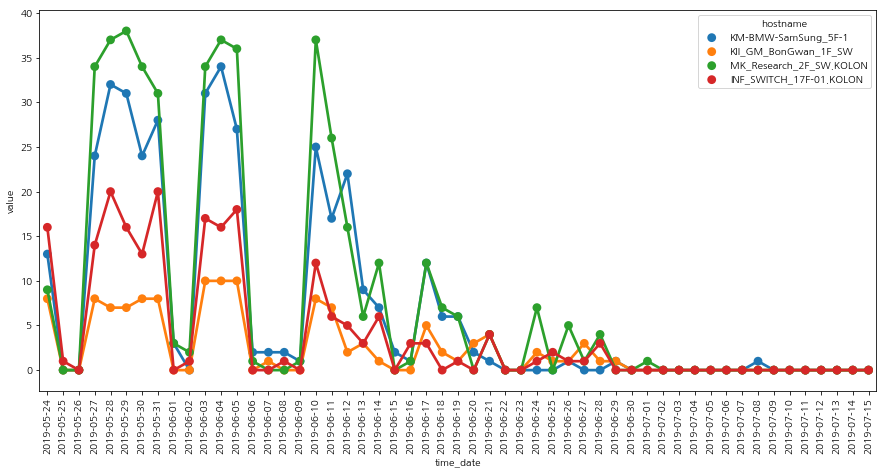

,alarm_name,hostname,time
8,포트 다운,MK_Research_2F_SW.KOLON,439
7,포트 다운,KM-BMW-SamSung_5F-1,366
5,포트 다운,INF_SWITCH_17F-01.KOLON,200
6,포트 다운,KII_GM_BonGwan_1F_SW,121


>>>>>>>>>cluster1


<Figure size 432x288 with 0 Axes>

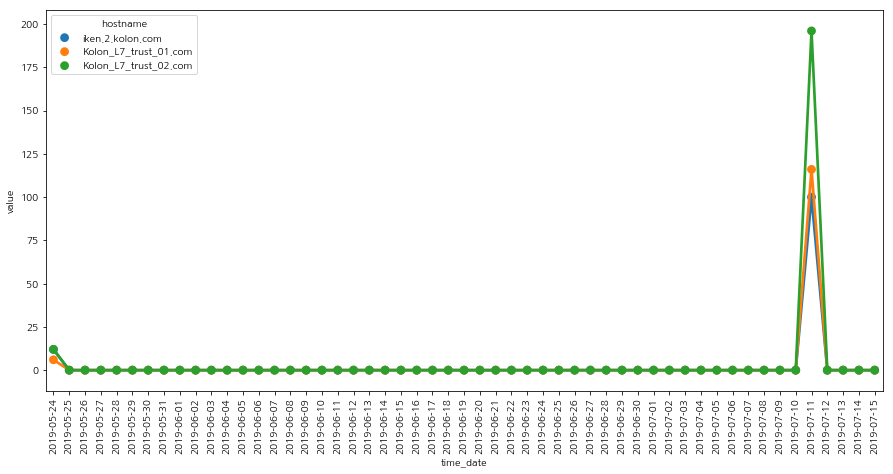

,alarm_name,hostname,time
1,L4_Real_SVR,Kolon_L7_trust_02.com,148


>>>>>>>>>cluster2


<Figure size 432x288 with 0 Axes>

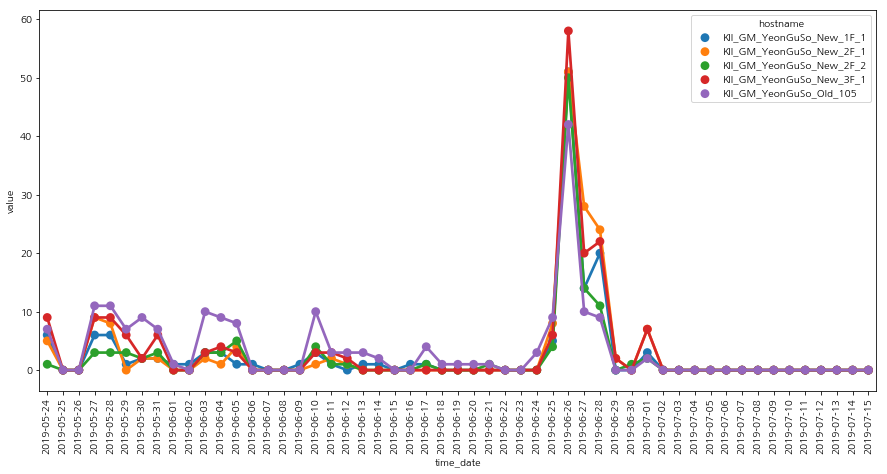

,alarm_name,hostname,time
14,포트 다운,KII_GM_YeonGuSo_Old_105,180
13,포트 다운,KII_GM_YeonGuSo_New_3F_1,170
11,포트 다운,KII_GM_YeonGuSo_New_2F_1,153
10,포트 다운,KII_GM_YeonGuSo_New_1F_1,131
12,포트 다운,KII_GM_YeonGuSo_New_2F_2,112


>>>>>>>>>cluster3


<Figure size 432x288 with 0 Axes>

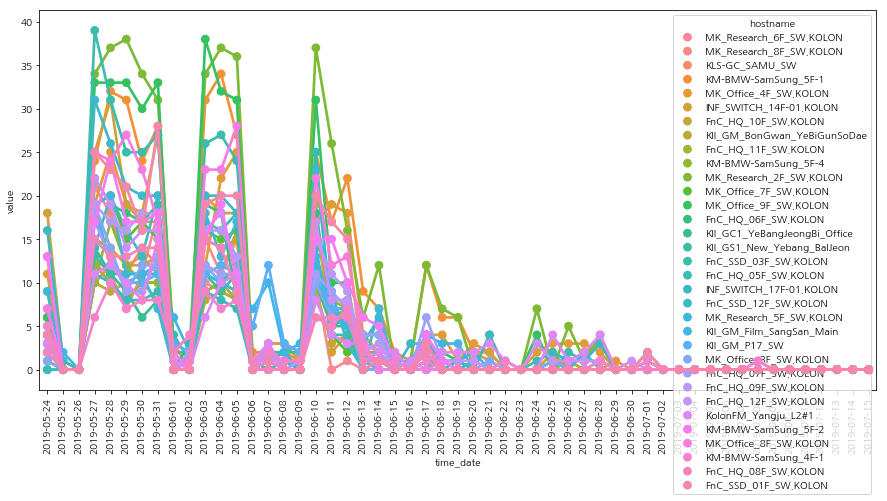

,alarm_name,hostname,time
60,포트 다운,MK_Research_2F_SW.KOLON,439
51,포트 다운,KM-BMW-SamSung_5F-1,366
59,포트 다운,MK_Office_9F_SW.KOLON,325
40,포트 다운,FnC_SSD_03F_SW.KOLON,273
56,포트 다운,MK_Office_4F_SW.KOLON,260
58,포트 다운,MK_Office_8F_SW.KOLON,244
42,포트 다운,INF_SWITCH_14F-01.KOLON,235
39,포트 다운,FnC_SSD_01F_SW.KOLON,232
41,포트 다운,FnC_SSD_12F_SW.KOLON,226
52,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster4


<Figure size 432x288 with 0 Axes>

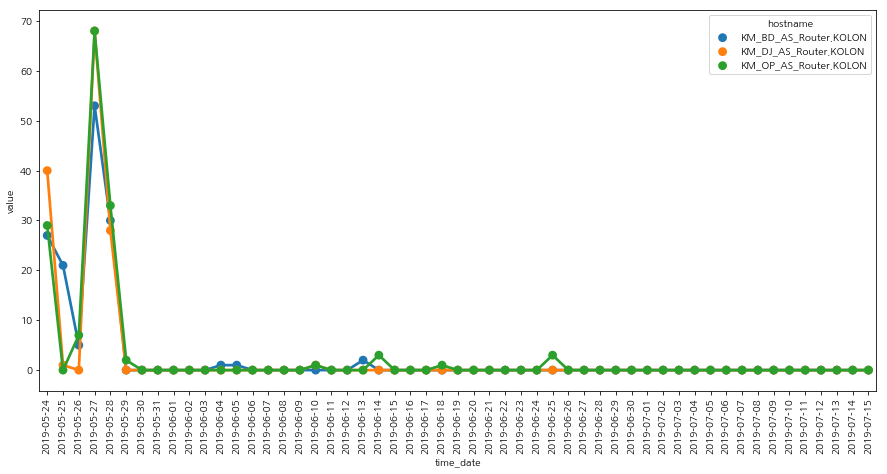

,alarm_name,hostname,time
5,트래픽 Rx 사용률,KM_DJ_AS_Router.KOLON,110
4,트래픽 Rx 사용률,KM_BD_AS_Router.KOLON,102


>>>>>>>>>cluster5


<Figure size 432x288 with 0 Axes>

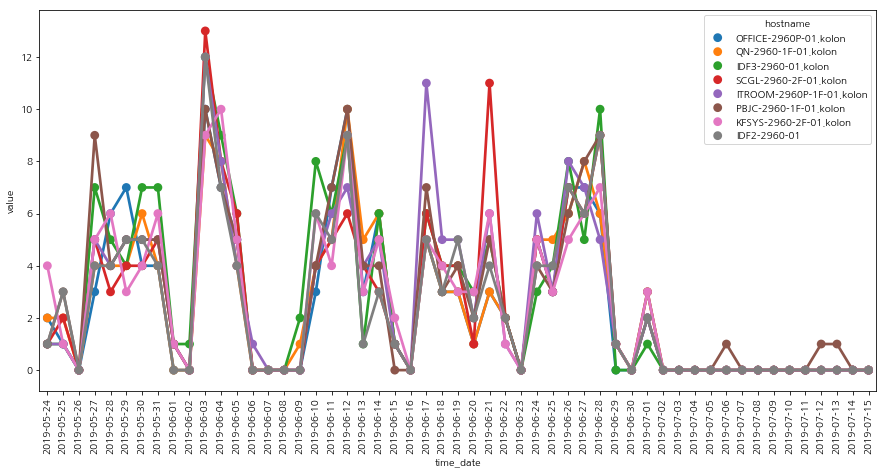

,alarm_name,hostname,time
1,ICMP 응답시간,IDF3-2960-01.kolon,128
3,ICMP 응답시간,KFSYS-2960-2F-01.kolon,124
5,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
2,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122
0,ICMP 응답시간,IDF2-2960-01,120
4,ICMP 응답시간,OFFICE-2960P-01.kolon,119
6,ICMP 응답시간,QN-2960-1F-01.kolon,119
7,ICMP 응답시간,SCGL-2960-2F-01.kolon,118


>>>>>>>>>cluster6


<Figure size 432x288 with 0 Axes>

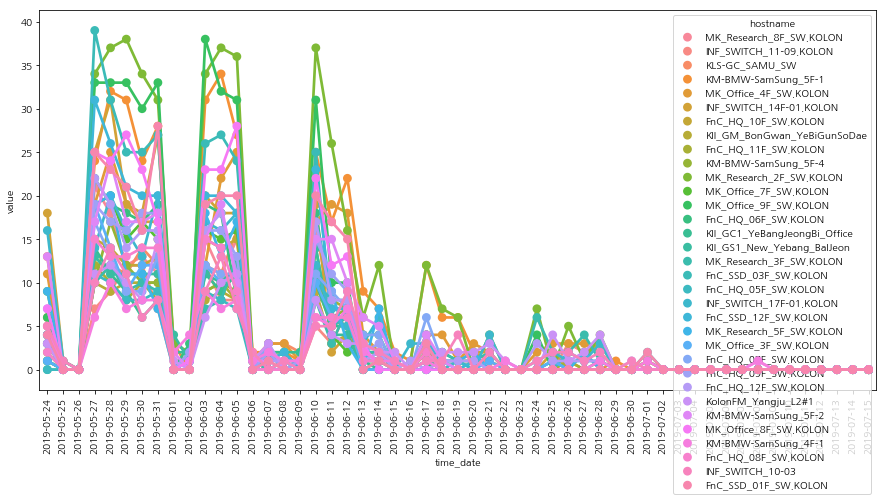

,alarm_name,hostname,time
65,포트 다운,MK_Research_2F_SW.KOLON,439
56,포트 다운,KM-BMW-SamSung_5F-1,366
64,포트 다운,MK_Office_9F_SW.KOLON,325
45,포트 다운,FnC_SSD_03F_SW.KOLON,273
61,포트 다운,MK_Office_4F_SW.KOLON,260
63,포트 다운,MK_Office_8F_SW.KOLON,244
49,포트 다운,INF_SWITCH_14F-01.KOLON,235
44,포트 다운,FnC_SSD_01F_SW.KOLON,232
46,포트 다운,FnC_SSD_12F_SW.KOLON,226
57,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster7


<Figure size 432x288 with 0 Axes>

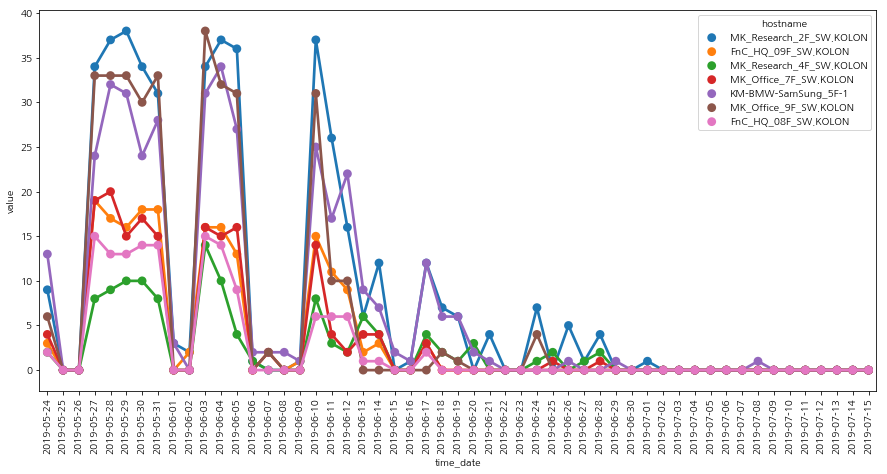

,alarm_name,hostname,time
12,포트 다운,MK_Research_2F_SW.KOLON,439
9,포트 다운,KM-BMW-SamSung_5F-1,366
11,포트 다운,MK_Office_9F_SW.KOLON,325
8,포트 다운,FnC_HQ_09F_SW.KOLON,182
10,포트 다운,MK_Office_7F_SW.KOLON,168
7,포트 다운,FnC_HQ_08F_SW.KOLON,129
13,포트 다운,MK_Research_4F_SW.KOLON,112


>>>>>>>>>cluster8


<Figure size 432x288 with 0 Axes>

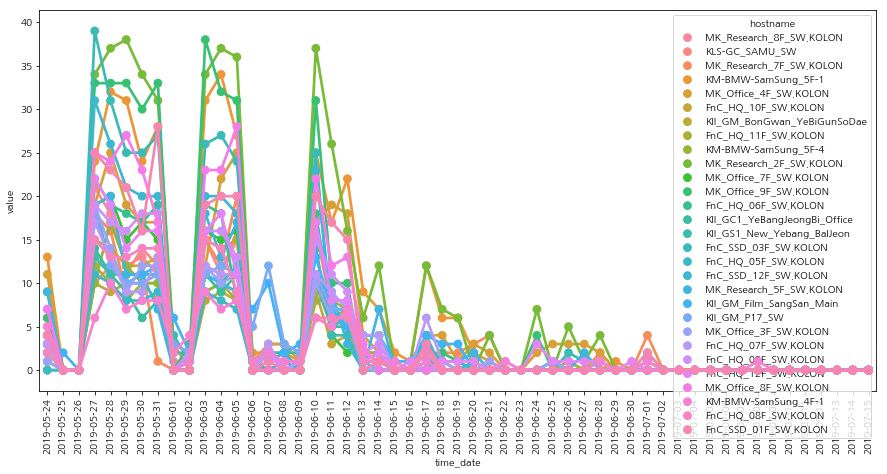

,alarm_name,hostname,time
51,포트 다운,MK_Research_2F_SW.KOLON,439
44,포트 다운,KM-BMW-SamSung_5F-1,366
50,포트 다운,MK_Office_9F_SW.KOLON,325
35,포트 다운,FnC_SSD_03F_SW.KOLON,273
47,포트 다운,MK_Office_4F_SW.KOLON,260
49,포트 다운,MK_Office_8F_SW.KOLON,244
34,포트 다운,FnC_SSD_01F_SW.KOLON,232
36,포트 다운,FnC_SSD_12F_SW.KOLON,226
33,포트 다운,FnC_HQ_12F_SW.KOLON,189
30,포트 다운,FnC_HQ_09F_SW.KOLON,182


>>>>>>>>>cluster9


<Figure size 432x288 with 0 Axes>

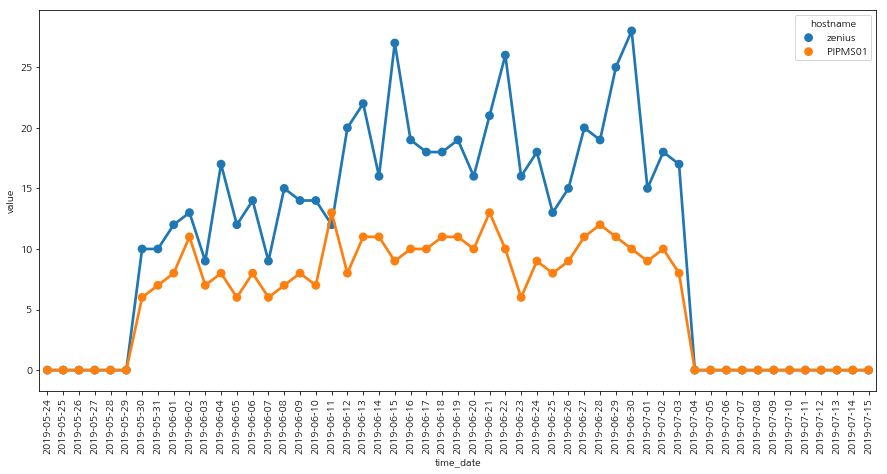

,alarm_name,hostname,time
1,Disk I/O 처리율,zenius,587
0,Disk I/O 처리율,PIPMS01,317


>>>>>>>>>cluster10


<Figure size 432x288 with 0 Axes>

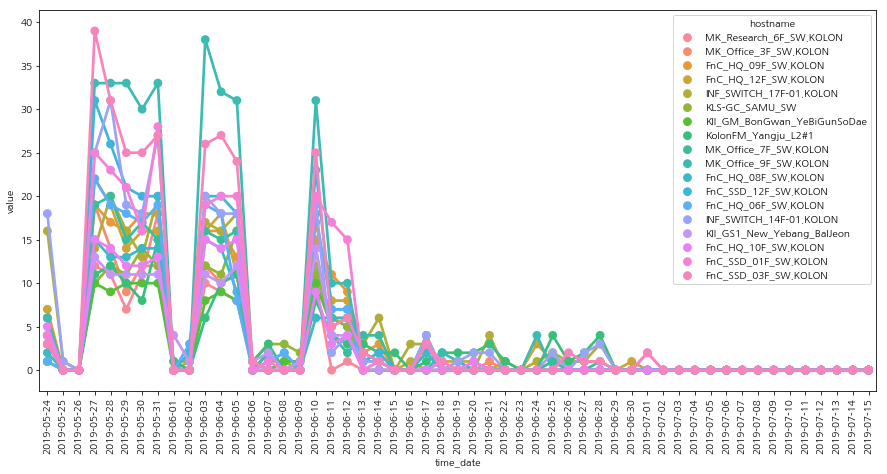

,alarm_name,hostname,time
35,포트 다운,MK_Office_9F_SW.KOLON,325
25,포트 다운,FnC_SSD_03F_SW.KOLON,273
27,포트 다운,INF_SWITCH_14F-01.KOLON,235
24,포트 다운,FnC_SSD_01F_SW.KOLON,232
26,포트 다운,FnC_SSD_12F_SW.KOLON,226
28,포트 다운,INF_SWITCH_17F-01.KOLON,200
23,포트 다운,FnC_HQ_12F_SW.KOLON,189
21,포트 다운,FnC_HQ_09F_SW.KOLON,182
19,포트 다운,FnC_HQ_06F_SW.KOLON,177
34,포트 다운,MK_Office_7F_SW.KOLON,168


>>>>>>>>>cluster11


<Figure size 432x288 with 0 Axes>

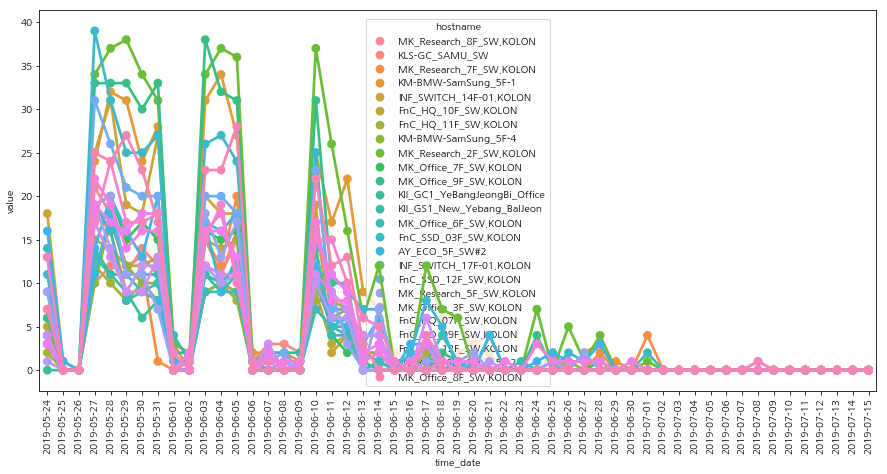

,alarm_name,hostname,time
48,포트 다운,MK_Research_2F_SW.KOLON,439
40,포트 다운,KM-BMW-SamSung_5F-1,366
47,포트 다운,MK_Office_9F_SW.KOLON,325
33,포트 다운,FnC_SSD_03F_SW.KOLON,273
46,포트 다운,MK_Office_8F_SW.KOLON,244
35,포트 다운,INF_SWITCH_14F-01.KOLON,235
34,포트 다운,FnC_SSD_12F_SW.KOLON,226
41,포트 다운,KM-BMW-SamSung_5F-2,211
36,포트 다운,INF_SWITCH_17F-01.KOLON,200
32,포트 다운,FnC_HQ_12F_SW.KOLON,189


>>>>>>>>>cluster12


<Figure size 432x288 with 0 Axes>

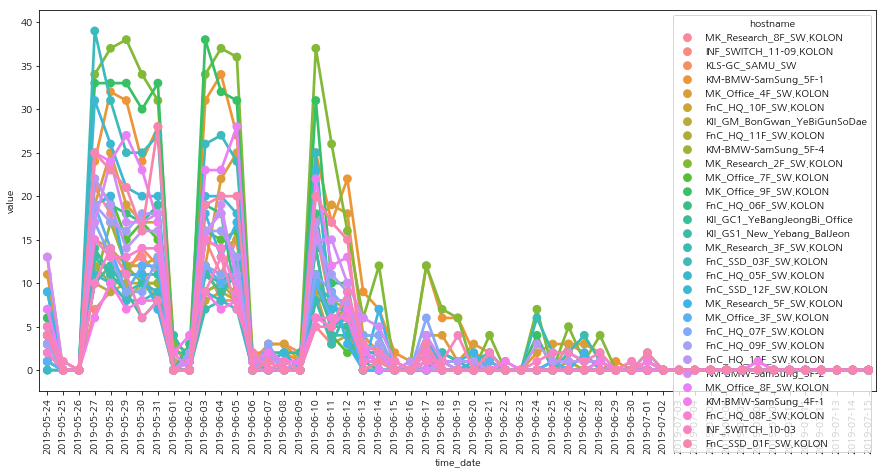

,alarm_name,hostname,time
58,포트 다운,MK_Research_2F_SW.KOLON,439
50,포트 다운,KM-BMW-SamSung_5F-1,366
57,포트 다운,MK_Office_9F_SW.KOLON,325
41,포트 다운,FnC_SSD_03F_SW.KOLON,273
54,포트 다운,MK_Office_4F_SW.KOLON,260
56,포트 다운,MK_Office_8F_SW.KOLON,244
40,포트 다운,FnC_SSD_01F_SW.KOLON,232
42,포트 다운,FnC_SSD_12F_SW.KOLON,226
51,포트 다운,KM-BMW-SamSung_5F-2,211
39,포트 다운,FnC_HQ_12F_SW.KOLON,189


>>>>>>>>>cluster13


<Figure size 432x288 with 0 Axes>

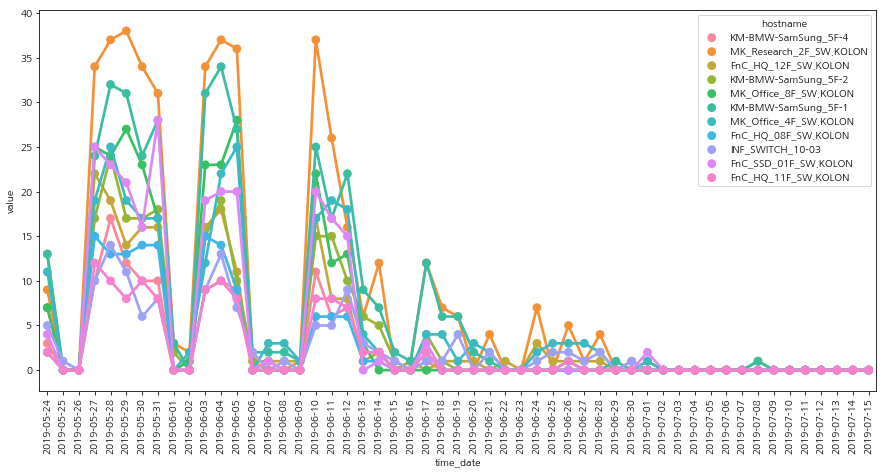

,alarm_name,hostname,time
21,포트 다운,MK_Research_2F_SW.KOLON,439
16,포트 다운,KM-BMW-SamSung_5F-1,366
19,포트 다운,MK_Office_4F_SW.KOLON,260
20,포트 다운,MK_Office_8F_SW.KOLON,244
14,포트 다운,FnC_SSD_01F_SW.KOLON,232
17,포트 다운,KM-BMW-SamSung_5F-2,211
13,포트 다운,FnC_HQ_12F_SW.KOLON,189
11,포트 다운,FnC_HQ_08F_SW.KOLON,129
15,포트 다운,INF_SWITCH_10-03,127
18,포트 다운,KM-BMW-SamSung_5F-4,119


>>>>>>>>>cluster14


<Figure size 432x288 with 0 Axes>

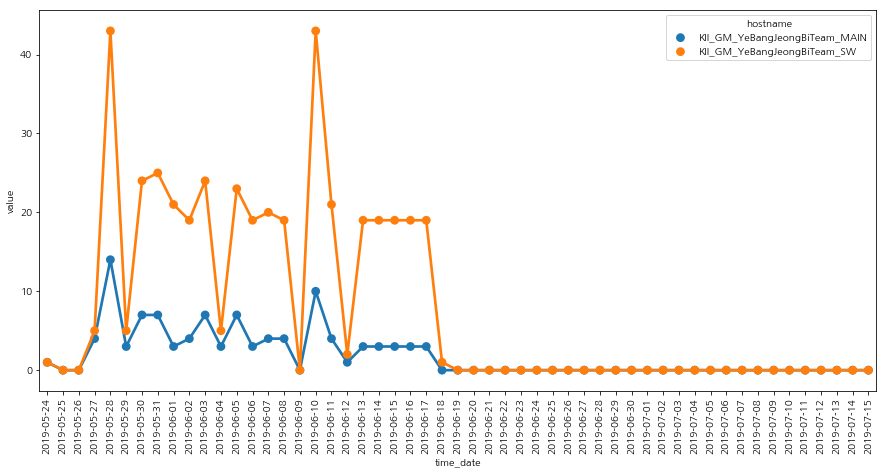

,alarm_name,hostname,time
1,포트 다운,KII_GM_YeBangJeongBiTeam_SW,415
0,포트 다운,KII_GM_YeBangJeongBiTeam_MAIN,101


>>>>>>>>>cluster15


<Figure size 432x288 with 0 Axes>

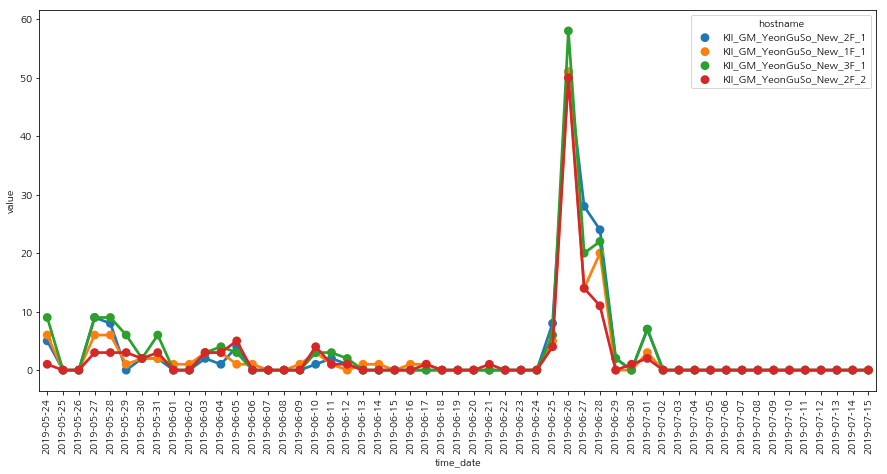

,alarm_name,hostname,time
11,포트 다운,KII_GM_YeonGuSo_New_3F_1,170
9,포트 다운,KII_GM_YeonGuSo_New_2F_1,153
8,포트 다운,KII_GM_YeonGuSo_New_1F_1,131
10,포트 다운,KII_GM_YeonGuSo_New_2F_2,112


>>>>>>>>>cluster16


<Figure size 432x288 with 0 Axes>

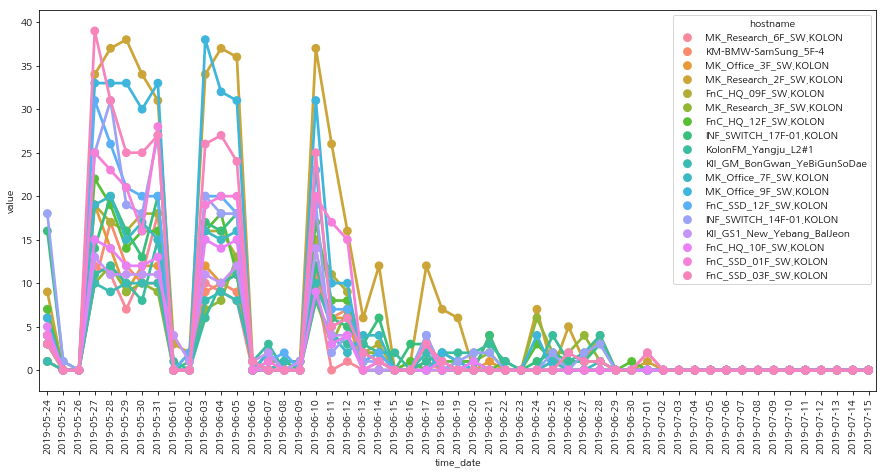

,alarm_name,hostname,time
32,포트 다운,MK_Research_2F_SW.KOLON,439
31,포트 다운,MK_Office_9F_SW.KOLON,325
21,포트 다운,FnC_SSD_03F_SW.KOLON,273
23,포트 다운,INF_SWITCH_14F-01.KOLON,235
20,포트 다운,FnC_SSD_01F_SW.KOLON,232
22,포트 다운,FnC_SSD_12F_SW.KOLON,226
24,포트 다운,INF_SWITCH_17F-01.KOLON,200
19,포트 다운,FnC_HQ_12F_SW.KOLON,189
17,포트 다운,FnC_HQ_09F_SW.KOLON,182
30,포트 다운,MK_Office_7F_SW.KOLON,168


>>>>>>>>>cluster17


<Figure size 432x288 with 0 Axes>

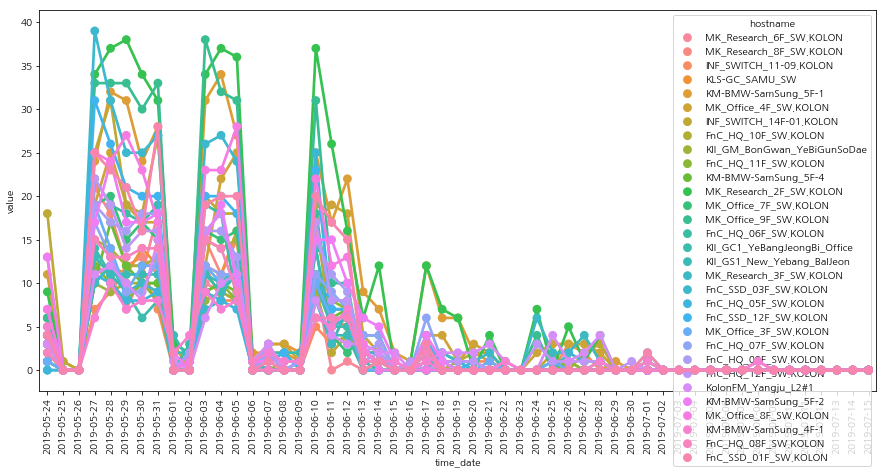

,alarm_name,hostname,time
59,포트 다운,MK_Research_2F_SW.KOLON,439
50,포트 다운,KM-BMW-SamSung_5F-1,366
58,포트 다운,MK_Office_9F_SW.KOLON,325
41,포트 다운,FnC_SSD_03F_SW.KOLON,273
55,포트 다운,MK_Office_4F_SW.KOLON,260
57,포트 다운,MK_Office_8F_SW.KOLON,244
44,포트 다운,INF_SWITCH_14F-01.KOLON,235
40,포트 다운,FnC_SSD_01F_SW.KOLON,232
42,포트 다운,FnC_SSD_12F_SW.KOLON,226
51,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster18


<Figure size 432x288 with 0 Axes>

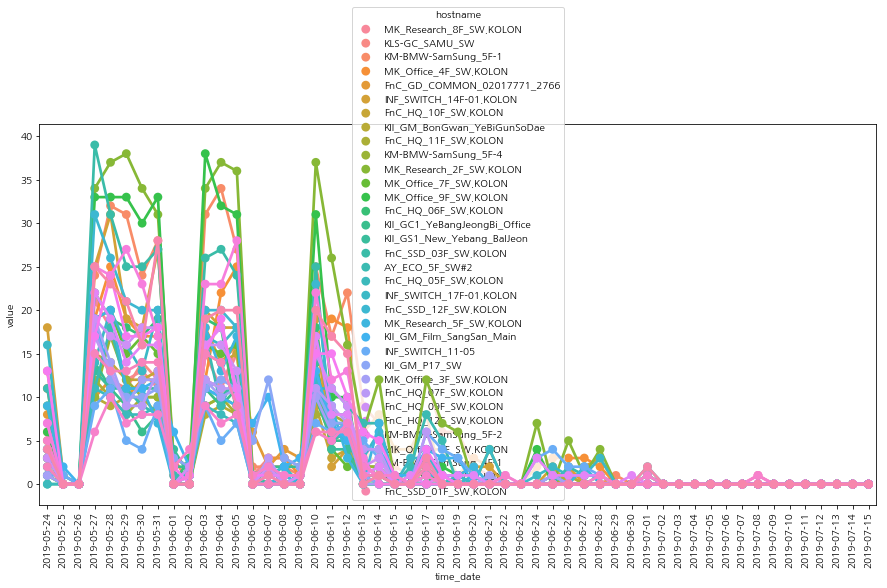

,alarm_name,hostname,time
67,포트 다운,MK_Research_2F_SW.KOLON,439
59,포트 다운,KM-BMW-SamSung_5F-1,366
66,포트 다운,MK_Office_9F_SW.KOLON,325
47,포트 다운,FnC_SSD_03F_SW.KOLON,273
63,포트 다운,MK_Office_4F_SW.KOLON,260
65,포트 다운,MK_Office_8F_SW.KOLON,244
50,포트 다운,INF_SWITCH_14F-01.KOLON,235
46,포트 다운,FnC_SSD_01F_SW.KOLON,232
48,포트 다운,FnC_SSD_12F_SW.KOLON,226
60,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster19


<Figure size 432x288 with 0 Axes>

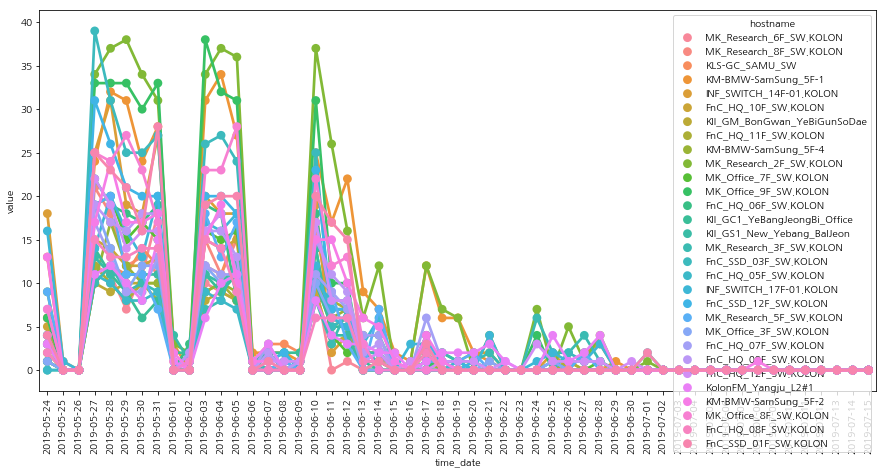

,alarm_name,hostname,time
54,포트 다운,MK_Research_2F_SW.KOLON,439
46,포트 다운,KM-BMW-SamSung_5F-1,366
53,포트 다운,MK_Office_9F_SW.KOLON,325
38,포트 다운,FnC_SSD_03F_SW.KOLON,273
52,포트 다운,MK_Office_8F_SW.KOLON,244
40,포트 다운,INF_SWITCH_14F-01.KOLON,235
37,포트 다운,FnC_SSD_01F_SW.KOLON,232
39,포트 다운,FnC_SSD_12F_SW.KOLON,226
47,포트 다운,KM-BMW-SamSung_5F-2,211
41,포트 다운,INF_SWITCH_17F-01.KOLON,200


>>>>>>>>>cluster20


<Figure size 432x288 with 0 Axes>

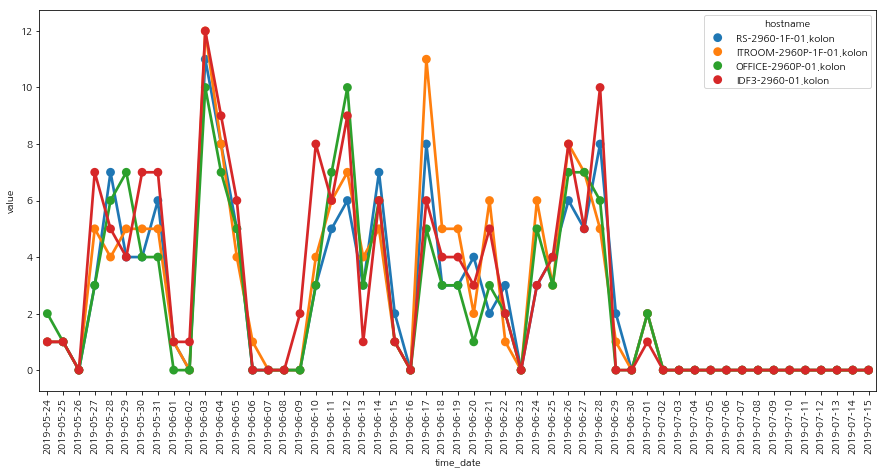

,alarm_name,hostname,time
0,ICMP 응답시간,IDF3-2960-01.kolon,128
1,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122
3,ICMP 응답시간,RS-2960-1F-01.kolon,120
2,ICMP 응답시간,OFFICE-2960P-01.kolon,119


>>>>>>>>>cluster21


<Figure size 432x288 with 0 Axes>

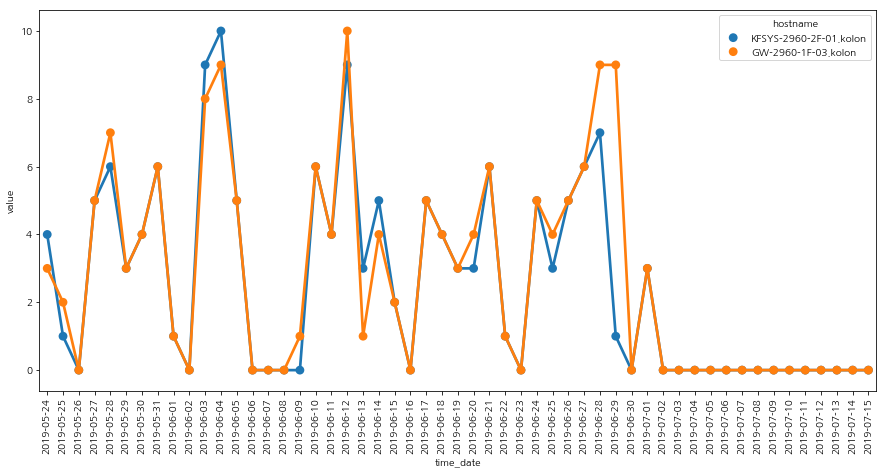

,alarm_name,hostname,time
0,ICMP 응답시간,GW-2960-1F-03.kolon,124
1,ICMP 응답시간,KFSYS-2960-2F-01.kolon,124


>>>>>>>>>cluster22


<Figure size 432x288 with 0 Axes>

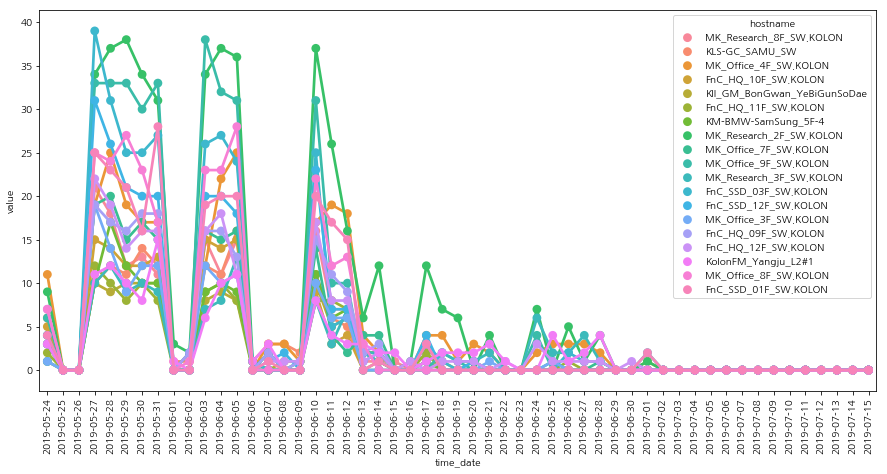

,alarm_name,hostname,time
33,포트 다운,MK_Research_2F_SW.KOLON,439
32,포트 다운,MK_Office_9F_SW.KOLON,325
22,포트 다운,FnC_SSD_03F_SW.KOLON,273
29,포트 다운,MK_Office_4F_SW.KOLON,260
31,포트 다운,MK_Office_8F_SW.KOLON,244
21,포트 다운,FnC_SSD_01F_SW.KOLON,232
23,포트 다운,FnC_SSD_12F_SW.KOLON,226
20,포트 다운,FnC_HQ_12F_SW.KOLON,189
17,포트 다운,FnC_HQ_09F_SW.KOLON,182
30,포트 다운,MK_Office_7F_SW.KOLON,168


>>>>>>>>>cluster23


<Figure size 432x288 with 0 Axes>

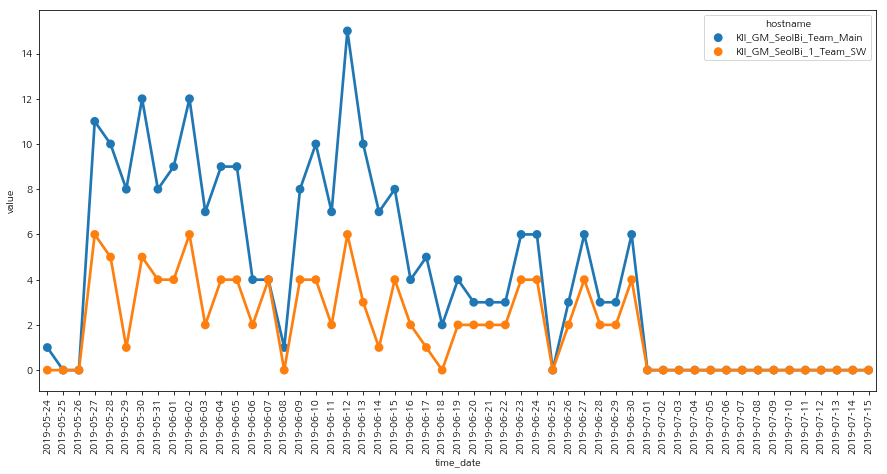

,alarm_name,hostname,time
1,포트 다운,KII_GM_SeolBi_Team_Main,227
0,포트 다운,KII_GM_SeolBi_1_Team_SW,104


>>>>>>>>>cluster24


<Figure size 432x288 with 0 Axes>

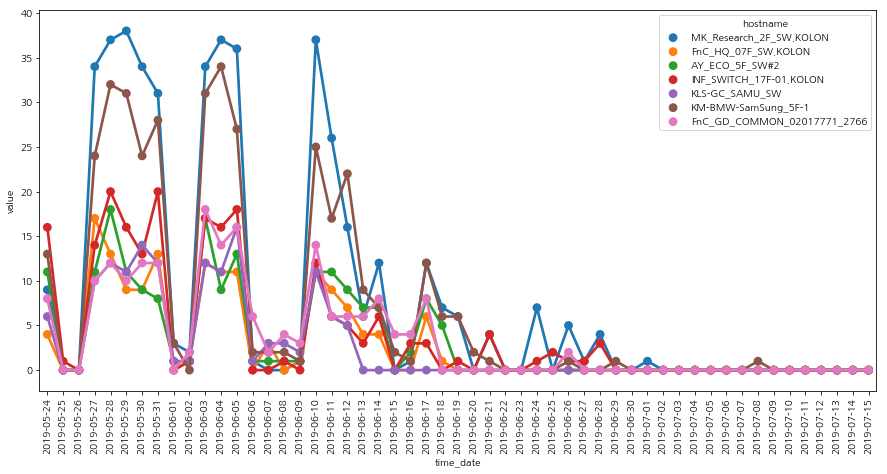

,alarm_name,hostname,time
16,포트 다운,MK_Research_2F_SW.KOLON,439
15,포트 다운,KM-BMW-SamSung_5F-1,366
13,포트 다운,INF_SWITCH_17F-01.KOLON,200
11,포트 다운,FnC_GD_COMMON_02017771_2766,185
10,포트 다운,AY_ECO_5F_SW#2,167
12,포트 다운,FnC_HQ_07F_SW.KOLON,144
14,포트 다운,KLS-GC_SAMU_SW,131


>>>>>>>>>cluster25


<Figure size 432x288 with 0 Axes>

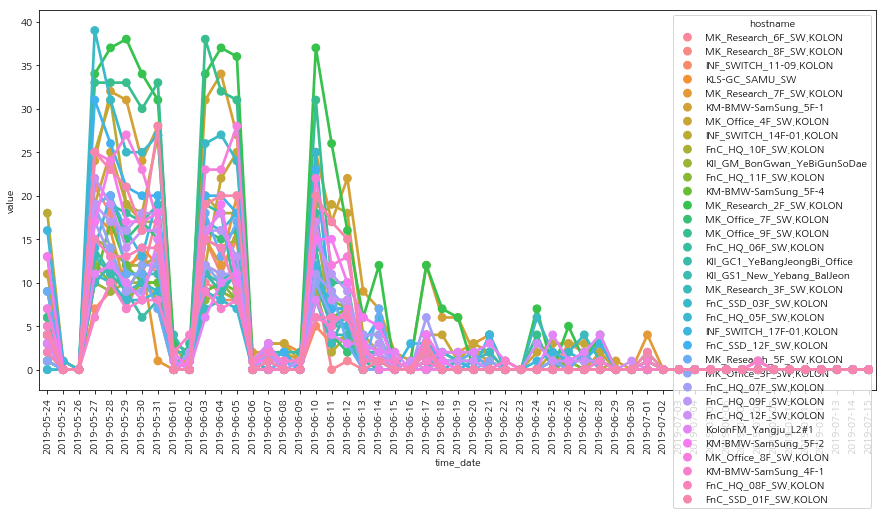

,alarm_name,hostname,time
64,포트 다운,MK_Research_2F_SW.KOLON,439
55,포트 다운,KM-BMW-SamSung_5F-1,366
63,포트 다운,MK_Office_9F_SW.KOLON,325
45,포트 다운,FnC_SSD_03F_SW.KOLON,273
60,포트 다운,MK_Office_4F_SW.KOLON,260
62,포트 다운,MK_Office_8F_SW.KOLON,244
48,포트 다운,INF_SWITCH_14F-01.KOLON,235
44,포트 다운,FnC_SSD_01F_SW.KOLON,232
46,포트 다운,FnC_SSD_12F_SW.KOLON,226
56,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster26


<Figure size 432x288 with 0 Axes>

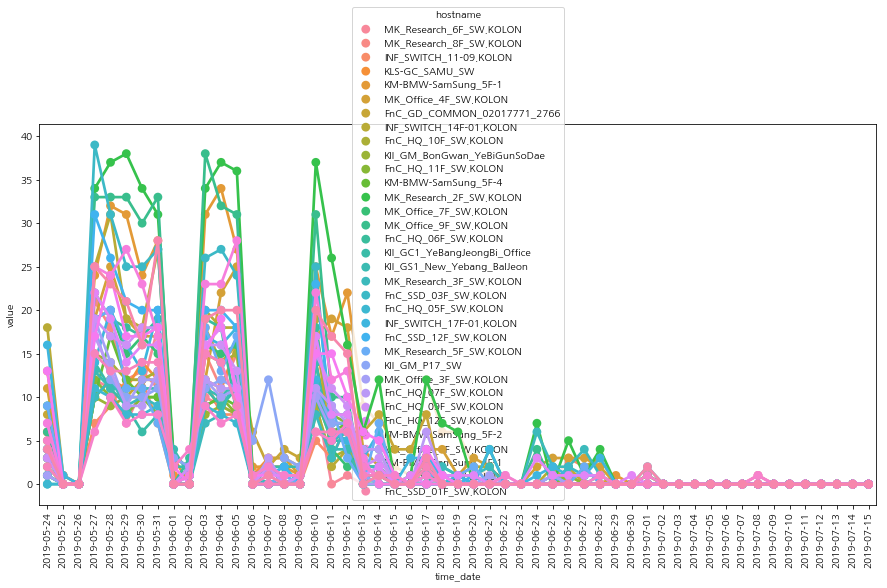

,alarm_name,hostname,time
65,포트 다운,MK_Research_2F_SW.KOLON,439
57,포트 다운,KM-BMW-SamSung_5F-1,366
64,포트 다운,MK_Office_9F_SW.KOLON,325
46,포트 다운,FnC_SSD_03F_SW.KOLON,273
61,포트 다운,MK_Office_4F_SW.KOLON,260
63,포트 다운,MK_Office_8F_SW.KOLON,244
49,포트 다운,INF_SWITCH_14F-01.KOLON,235
45,포트 다운,FnC_SSD_01F_SW.KOLON,232
47,포트 다운,FnC_SSD_12F_SW.KOLON,226
58,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster27


<Figure size 432x288 with 0 Axes>

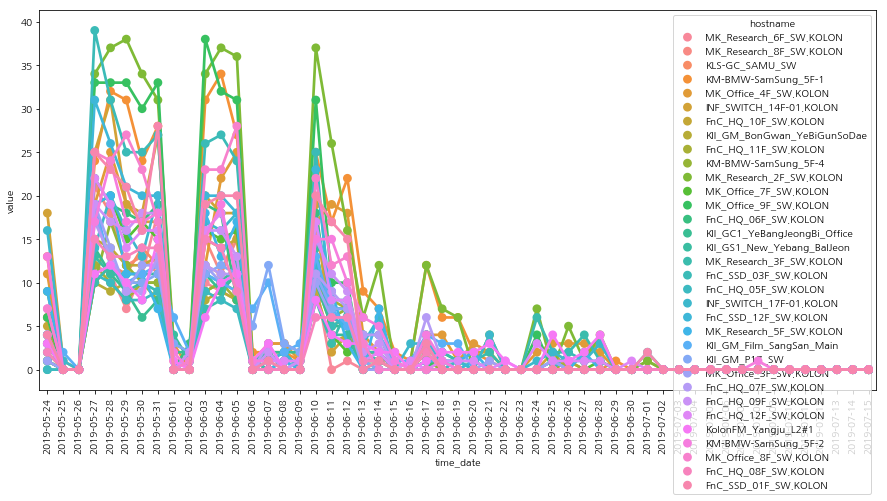

,alarm_name,hostname,time
59,포트 다운,MK_Research_2F_SW.KOLON,439
50,포트 다운,KM-BMW-SamSung_5F-1,366
58,포트 다운,MK_Office_9F_SW.KOLON,325
40,포트 다운,FnC_SSD_03F_SW.KOLON,273
55,포트 다운,MK_Office_4F_SW.KOLON,260
57,포트 다운,MK_Office_8F_SW.KOLON,244
42,포트 다운,INF_SWITCH_14F-01.KOLON,235
39,포트 다운,FnC_SSD_01F_SW.KOLON,232
41,포트 다운,FnC_SSD_12F_SW.KOLON,226
51,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster28


<Figure size 432x288 with 0 Axes>

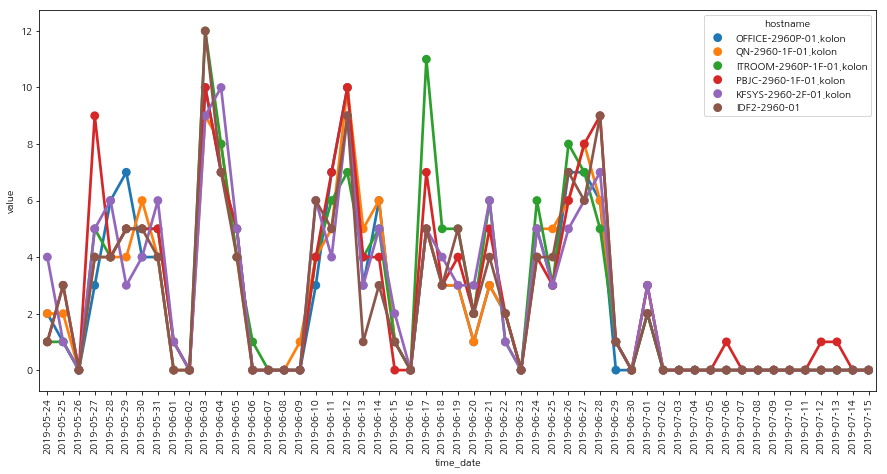

,alarm_name,hostname,time
2,ICMP 응답시간,KFSYS-2960-2F-01.kolon,124
4,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
1,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122
0,ICMP 응답시간,IDF2-2960-01,120
3,ICMP 응답시간,OFFICE-2960P-01.kolon,119
5,ICMP 응답시간,QN-2960-1F-01.kolon,119


>>>>>>>>>cluster29


<Figure size 432x288 with 0 Axes>

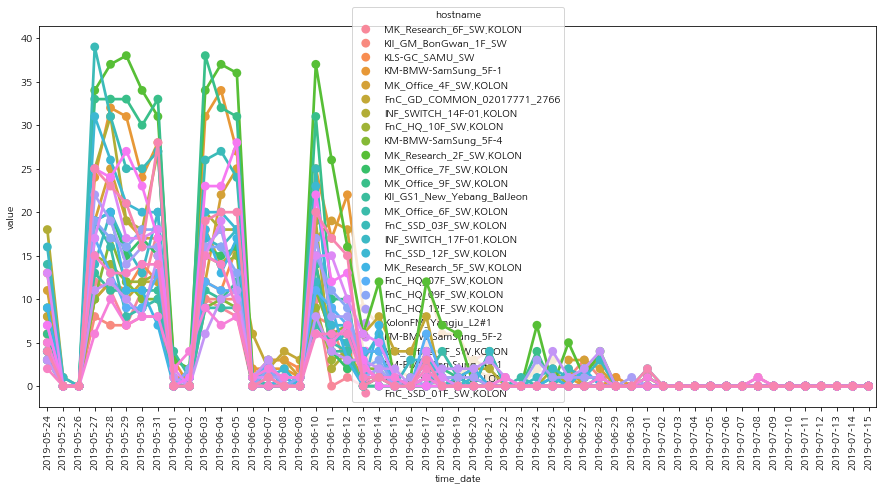

,alarm_name,hostname,time
52,포트 다운,MK_Research_2F_SW.KOLON,439
43,포트 다운,KM-BMW-SamSung_5F-1,366
51,포트 다운,MK_Office_9F_SW.KOLON,325
35,포트 다운,FnC_SSD_03F_SW.KOLON,273
47,포트 다운,MK_Office_4F_SW.KOLON,260
50,포트 다운,MK_Office_8F_SW.KOLON,244
37,포트 다운,INF_SWITCH_14F-01.KOLON,235
34,포트 다운,FnC_SSD_01F_SW.KOLON,232
36,포트 다운,FnC_SSD_12F_SW.KOLON,226
44,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster30


<Figure size 432x288 with 0 Axes>

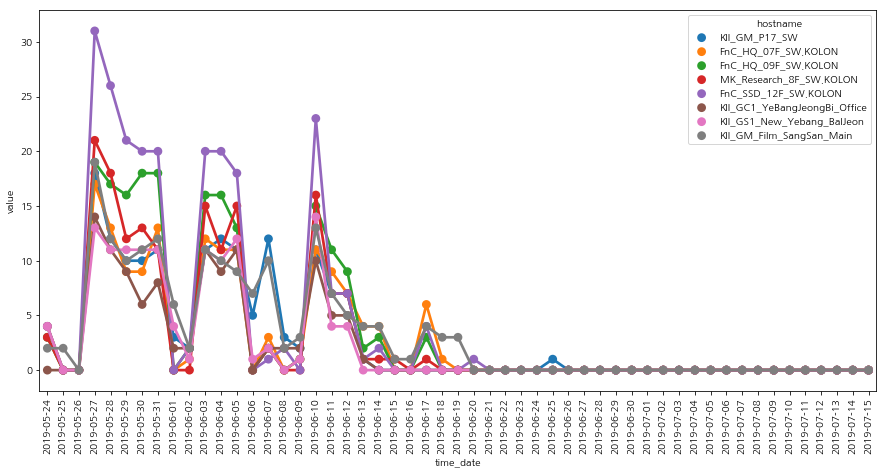

,alarm_name,hostname,time
8,포트 다운,FnC_SSD_12F_SW.KOLON,226
7,포트 다운,FnC_HQ_09F_SW.KOLON,182
10,포트 다운,KII_GM_Film_SangSan_Main,170
11,포트 다운,KII_GM_P17_SW,153
13,포트 다운,MK_Research_8F_SW.KOLON,151
6,포트 다운,FnC_HQ_07F_SW.KOLON,144
12,포트 다운,KII_GS1_New_Yebang_BalJeon,124
9,포트 다운,KII_GC1_YeBangJeongBi_Office,110


>>>>>>>>>cluster31


<Figure size 432x288 with 0 Axes>

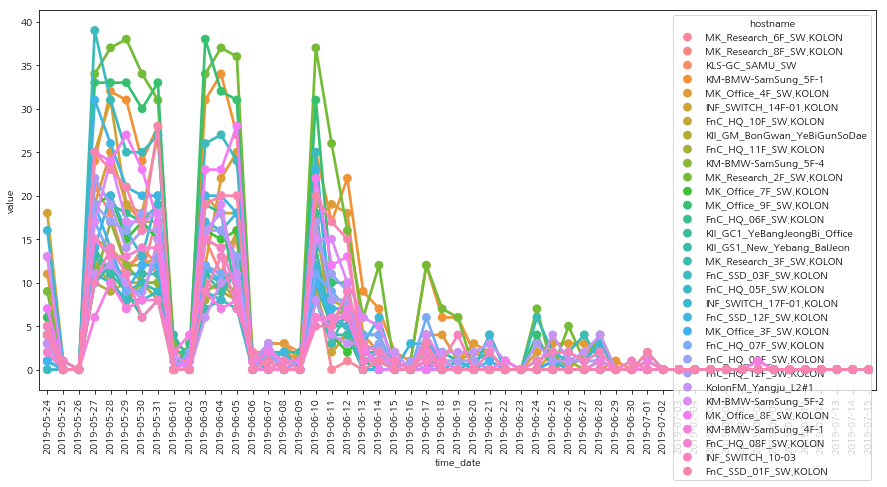

,alarm_name,hostname,time
60,포트 다운,MK_Research_2F_SW.KOLON,439
51,포트 다운,KM-BMW-SamSung_5F-1,366
59,포트 다운,MK_Office_9F_SW.KOLON,325
41,포트 다운,FnC_SSD_03F_SW.KOLON,273
56,포트 다운,MK_Office_4F_SW.KOLON,260
58,포트 다운,MK_Office_8F_SW.KOLON,244
44,포트 다운,INF_SWITCH_14F-01.KOLON,235
40,포트 다운,FnC_SSD_01F_SW.KOLON,232
42,포트 다운,FnC_SSD_12F_SW.KOLON,226
52,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster32


<Figure size 432x288 with 0 Axes>

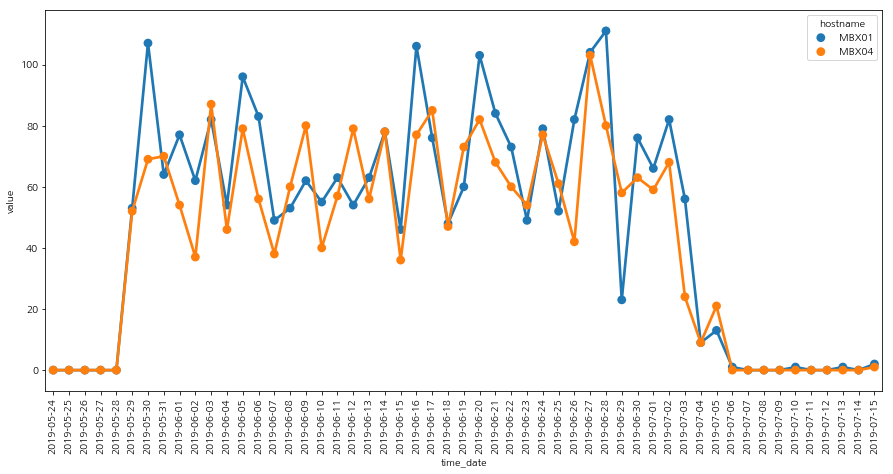

,alarm_name,hostname,time
1,Disk I/O 처리율,MBX01,2504
2,Disk I/O 처리율,MBX04,2198


>>>>>>>>>cluster33


<Figure size 432x288 with 0 Axes>

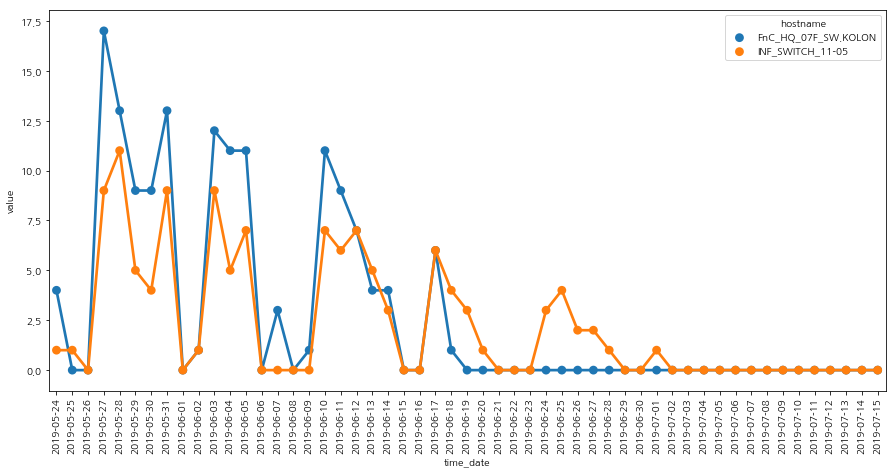

,alarm_name,hostname,time
4,포트 다운,FnC_HQ_07F_SW.KOLON,144
5,포트 다운,INF_SWITCH_11-05,109


>>>>>>>>>cluster34


<Figure size 432x288 with 0 Axes>

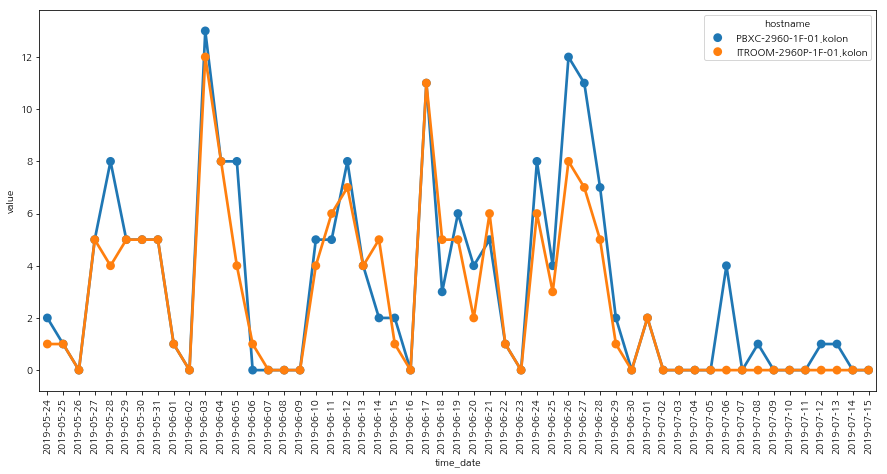

,alarm_name,hostname,time
1,ICMP 응답시간,PBXC-2960-1F-01.kolon,129
0,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122


>>>>>>>>>cluster35


<Figure size 432x288 with 0 Axes>

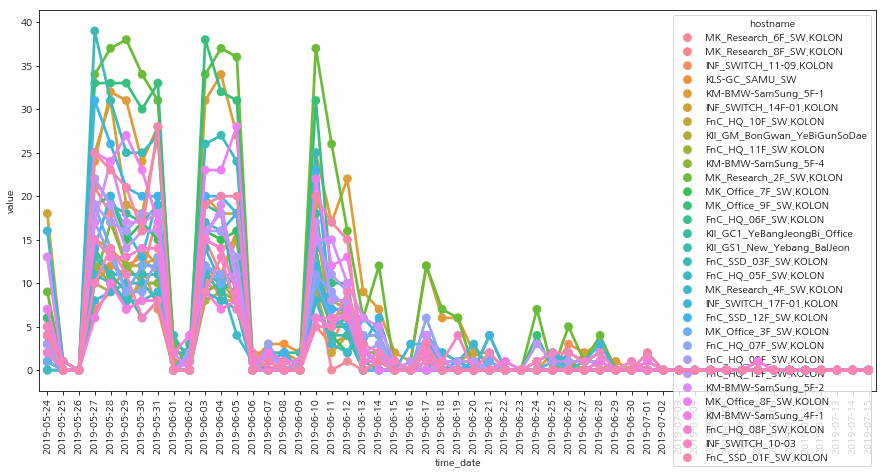

,alarm_name,hostname,time
62,포트 다운,MK_Research_2F_SW.KOLON,439
55,포트 다운,KM-BMW-SamSung_5F-1,366
61,포트 다운,MK_Office_9F_SW.KOLON,325
44,포트 다운,FnC_SSD_03F_SW.KOLON,273
60,포트 다운,MK_Office_8F_SW.KOLON,244
48,포트 다운,INF_SWITCH_14F-01.KOLON,235
43,포트 다운,FnC_SSD_01F_SW.KOLON,232
45,포트 다운,FnC_SSD_12F_SW.KOLON,226
56,포트 다운,KM-BMW-SamSung_5F-2,211
49,포트 다운,INF_SWITCH_17F-01.KOLON,200


>>>>>>>>>cluster36


<Figure size 432x288 with 0 Axes>

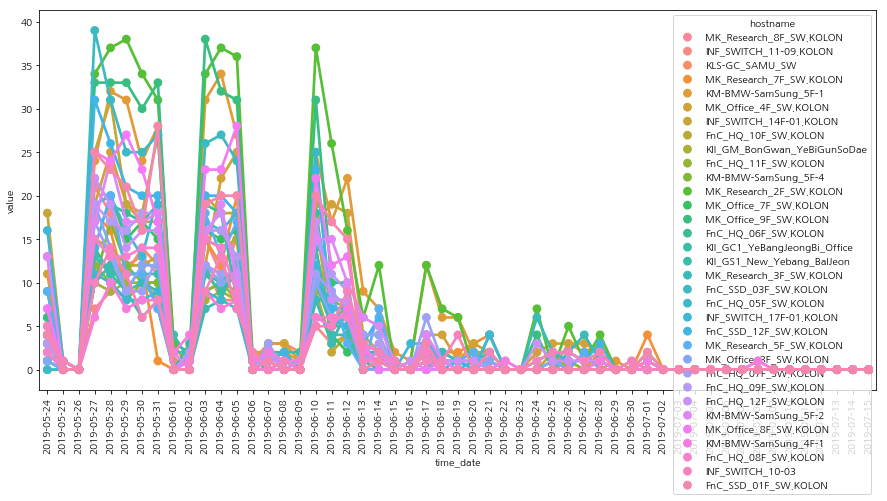

,alarm_name,hostname,time
65,포트 다운,MK_Research_2F_SW.KOLON,439
57,포트 다운,KM-BMW-SamSung_5F-1,366
64,포트 다운,MK_Office_9F_SW.KOLON,325
46,포트 다운,FnC_SSD_03F_SW.KOLON,273
61,포트 다운,MK_Office_4F_SW.KOLON,260
63,포트 다운,MK_Office_8F_SW.KOLON,244
50,포트 다운,INF_SWITCH_14F-01.KOLON,235
45,포트 다운,FnC_SSD_01F_SW.KOLON,232
47,포트 다운,FnC_SSD_12F_SW.KOLON,226
58,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster37


<Figure size 432x288 with 0 Axes>

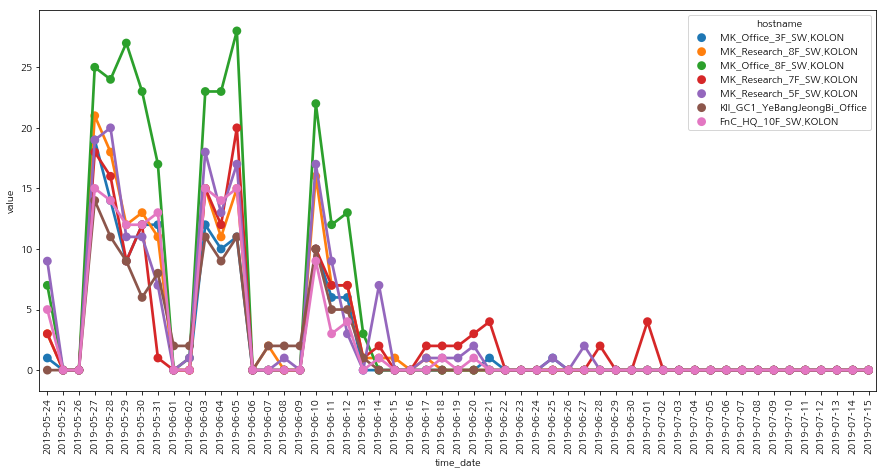

,alarm_name,hostname,time
9,포트 다운,MK_Office_8F_SW.KOLON,244
10,포트 다운,MK_Research_5F_SW.KOLON,168
12,포트 다운,MK_Research_8F_SW.KOLON,151
11,포트 다운,MK_Research_7F_SW.KOLON,148
6,포트 다운,FnC_HQ_10F_SW.KOLON,132
8,포트 다운,MK_Office_3F_SW.KOLON,120
7,포트 다운,KII_GC1_YeBangJeongBi_Office,110


>>>>>>>>>cluster38


<Figure size 432x288 with 0 Axes>

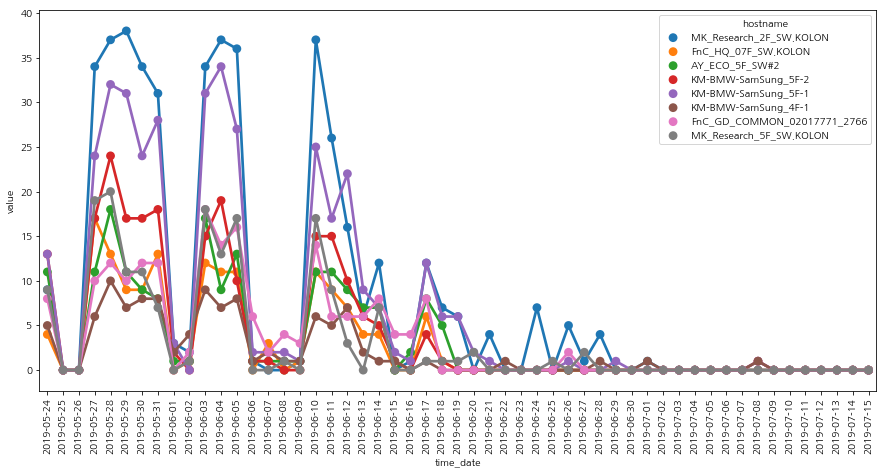

,alarm_name,hostname,time
15,포트 다운,MK_Research_2F_SW.KOLON,439
13,포트 다운,KM-BMW-SamSung_5F-1,366
14,포트 다운,KM-BMW-SamSung_5F-2,211
10,포트 다운,FnC_GD_COMMON_02017771_2766,185
16,포트 다운,MK_Research_5F_SW.KOLON,168
9,포트 다운,AY_ECO_5F_SW#2,167
11,포트 다운,FnC_HQ_07F_SW.KOLON,144
12,포트 다운,KM-BMW-SamSung_4F-1,105


>>>>>>>>>cluster39


<Figure size 432x288 with 0 Axes>

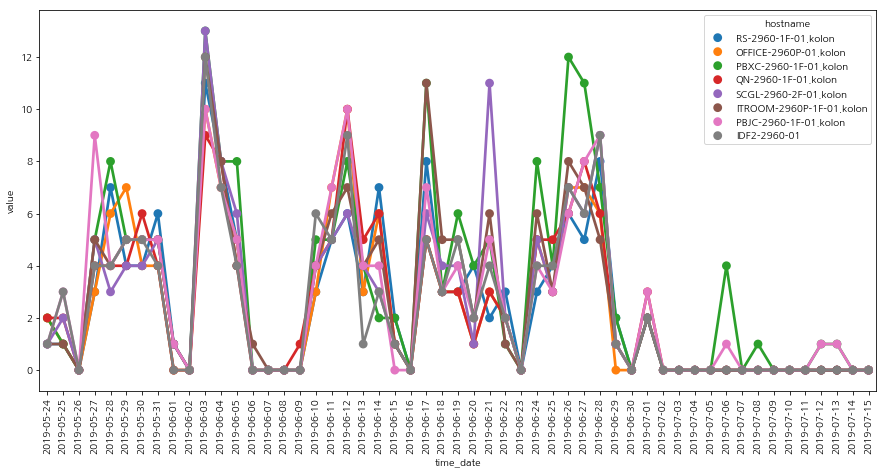

,alarm_name,hostname,time
4,ICMP 응답시간,PBXC-2960-1F-01.kolon,129
3,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
1,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122
0,ICMP 응답시간,IDF2-2960-01,120
6,ICMP 응답시간,RS-2960-1F-01.kolon,120
2,ICMP 응답시간,OFFICE-2960P-01.kolon,119
5,ICMP 응답시간,QN-2960-1F-01.kolon,119
7,ICMP 응답시간,SCGL-2960-2F-01.kolon,118


>>>>>>>>>cluster40


<Figure size 432x288 with 0 Axes>

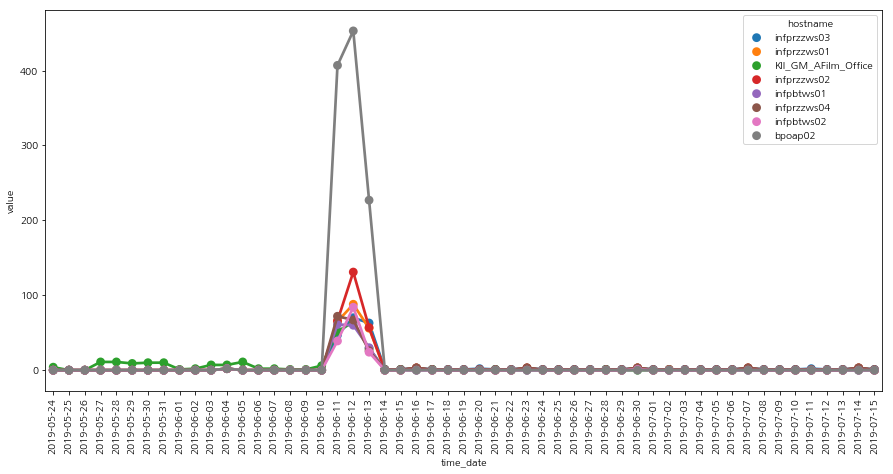

,alarm_name,hostname,time
19,WAS 평균응답시간,bpoap02,603
10,SQL 평균수행시간,bpoap02,474
23,WAS 평균응답시간,infprzzws02,254
29,포트 다운,KII_GM_AFilm_Office,245
22,WAS 평균응답시간,infprzzws01,209
24,WAS 평균응답시간,infprzzws03,178
25,WAS 평균응답시간,infprzzws04,163


>>>>>>>>>cluster41


<Figure size 432x288 with 0 Axes>

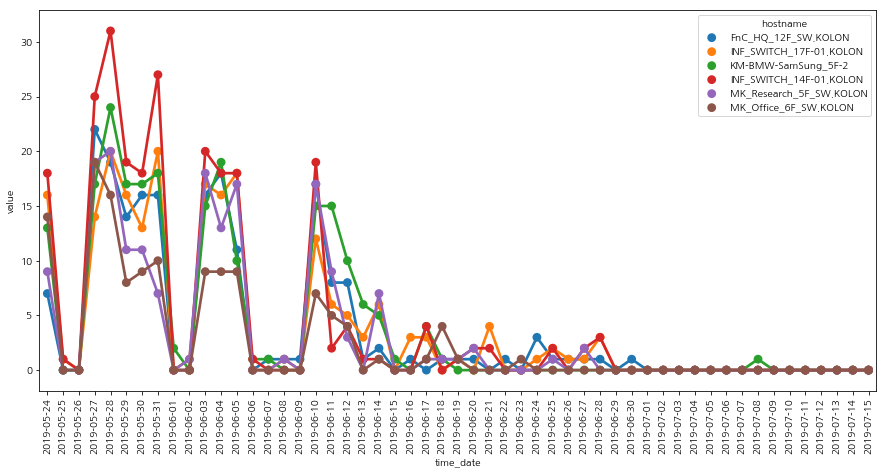

,alarm_name,hostname,time
9,포트 다운,INF_SWITCH_14F-01.KOLON,235
11,포트 다운,KM-BMW-SamSung_5F-2,211
10,포트 다운,INF_SWITCH_17F-01.KOLON,200
8,포트 다운,FnC_HQ_12F_SW.KOLON,189
13,포트 다운,MK_Research_5F_SW.KOLON,168
12,포트 다운,MK_Office_6F_SW.KOLON,123


>>>>>>>>>cluster42


<Figure size 432x288 with 0 Axes>

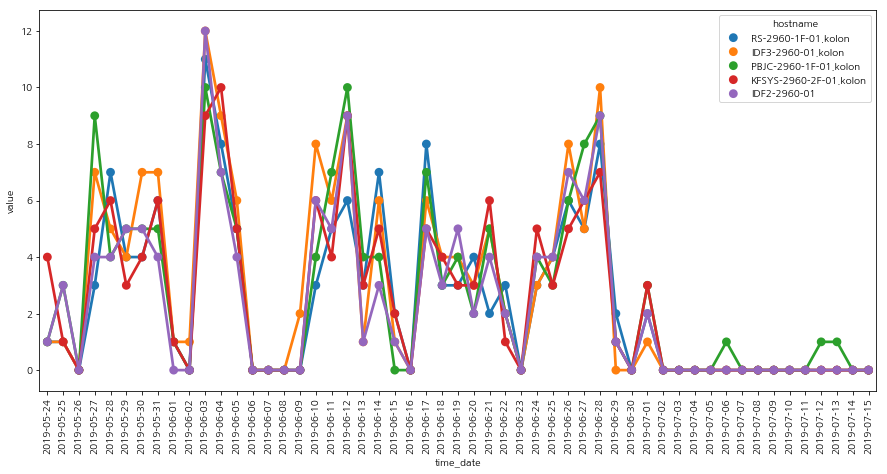

,alarm_name,hostname,time
1,ICMP 응답시간,IDF3-2960-01.kolon,128
2,ICMP 응답시간,KFSYS-2960-2F-01.kolon,124
3,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
0,ICMP 응답시간,IDF2-2960-01,120
4,ICMP 응답시간,RS-2960-1F-01.kolon,120


>>>>>>>>>cluster43


<Figure size 432x288 with 0 Axes>

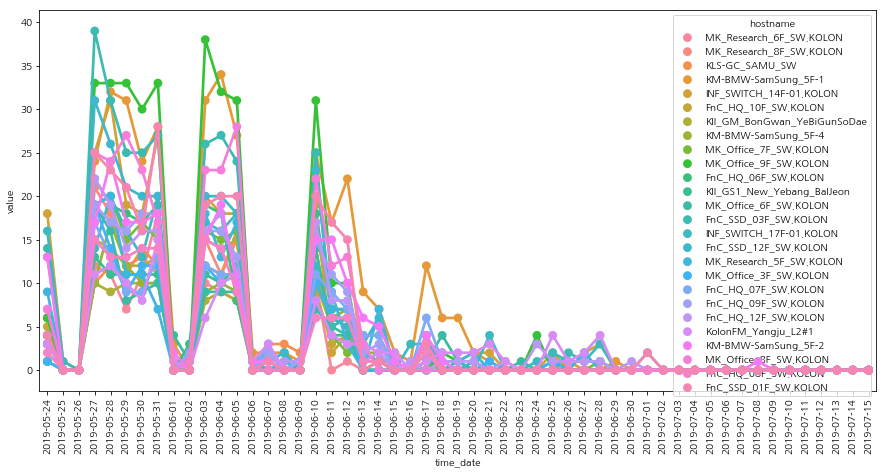

,alarm_name,hostname,time
40,포트 다운,KM-BMW-SamSung_5F-1,366
48,포트 다운,MK_Office_9F_SW.KOLON,325
33,포트 다운,FnC_SSD_03F_SW.KOLON,273
47,포트 다운,MK_Office_8F_SW.KOLON,244
35,포트 다운,INF_SWITCH_14F-01.KOLON,235
32,포트 다운,FnC_SSD_01F_SW.KOLON,232
34,포트 다운,FnC_SSD_12F_SW.KOLON,226
41,포트 다운,KM-BMW-SamSung_5F-2,211
36,포트 다운,INF_SWITCH_17F-01.KOLON,200
31,포트 다운,FnC_HQ_12F_SW.KOLON,189


>>>>>>>>>cluster44


<Figure size 432x288 with 0 Axes>

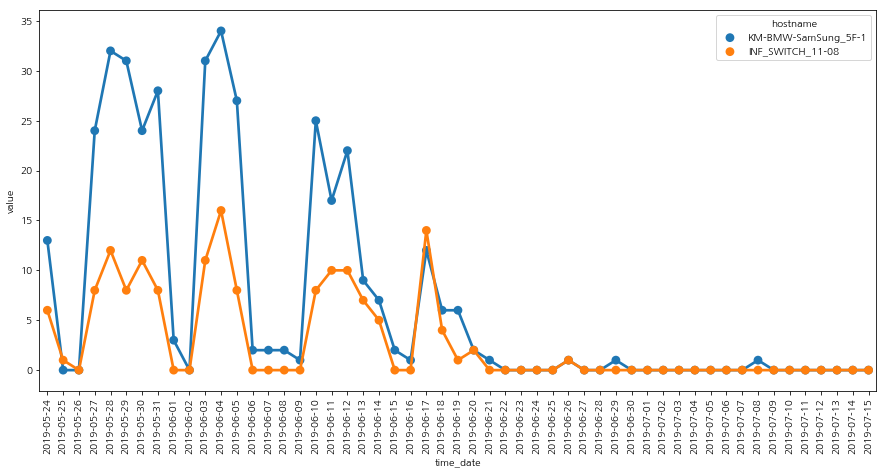

,alarm_name,hostname,time
6,포트 다운,KM-BMW-SamSung_5F-1,366
5,포트 다운,INF_SWITCH_11-08,143


>>>>>>>>>cluster45


<Figure size 432x288 with 0 Axes>

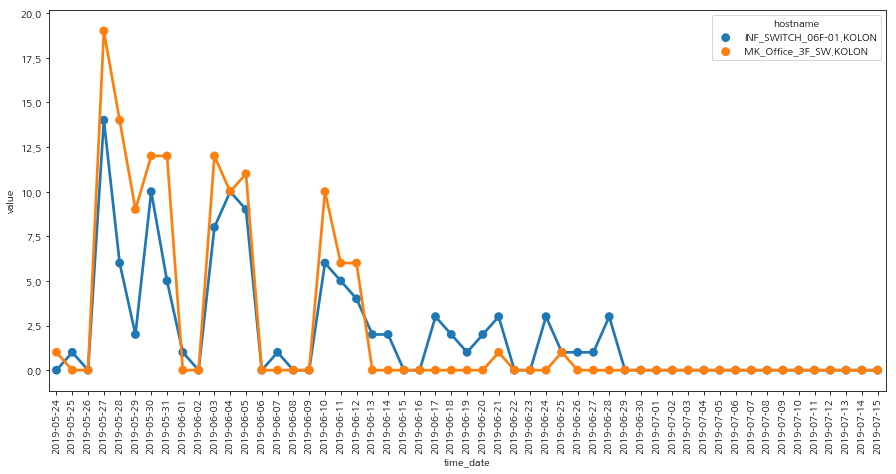

,alarm_name,hostname,time
6,포트 다운,MK_Office_3F_SW.KOLON,120


>>>>>>>>>cluster46


<Figure size 432x288 with 0 Axes>

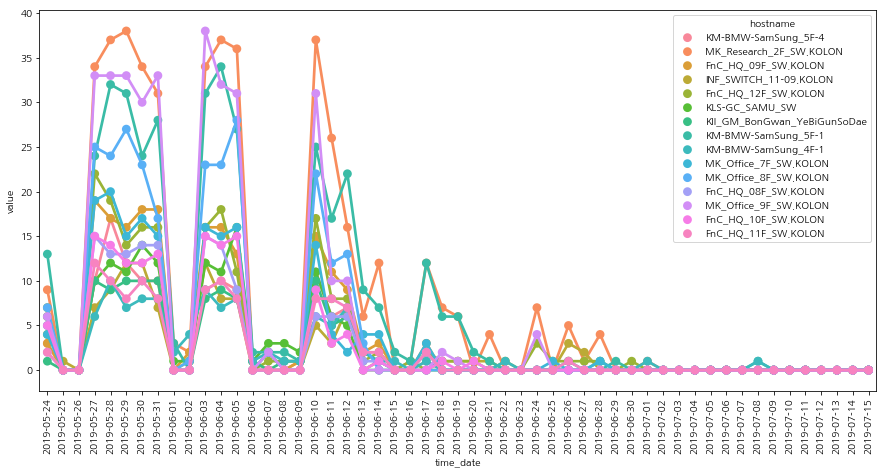

,alarm_name,hostname,time
31,포트 다운,MK_Research_2F_SW.KOLON,439
26,포트 다운,KM-BMW-SamSung_5F-1,366
30,포트 다운,MK_Office_9F_SW.KOLON,325
29,포트 다운,MK_Office_8F_SW.KOLON,244
21,포트 다운,FnC_HQ_12F_SW.KOLON,189
18,포트 다운,FnC_HQ_09F_SW.KOLON,182
28,포트 다운,MK_Office_7F_SW.KOLON,168
19,포트 다운,FnC_HQ_10F_SW.KOLON,132
24,포트 다운,KLS-GC_SAMU_SW,131
17,포트 다운,FnC_HQ_08F_SW.KOLON,129


>>>>>>>>>cluster47


<Figure size 432x288 with 0 Axes>

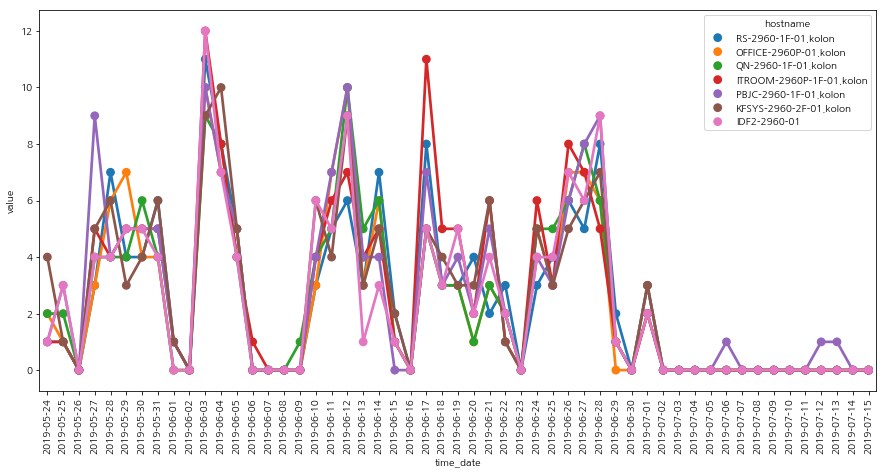

,alarm_name,hostname,time
2,ICMP 응답시간,KFSYS-2960-2F-01.kolon,124
4,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
1,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122
0,ICMP 응답시간,IDF2-2960-01,120
6,ICMP 응답시간,RS-2960-1F-01.kolon,120
3,ICMP 응답시간,OFFICE-2960P-01.kolon,119
5,ICMP 응답시간,QN-2960-1F-01.kolon,119


>>>>>>>>>cluster48


<Figure size 432x288 with 0 Axes>

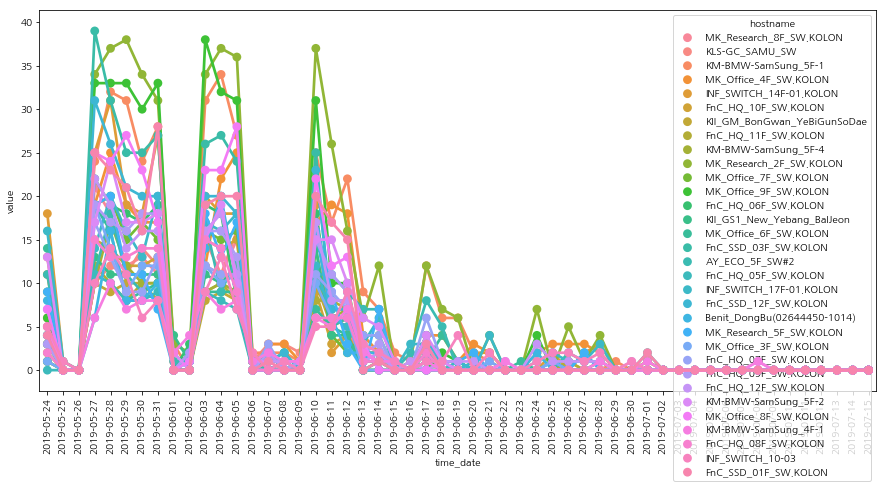

,alarm_name,hostname,time
65,포트 다운,MK_Research_2F_SW.KOLON,439
56,포트 다운,KM-BMW-SamSung_5F-1,366
64,포트 다운,MK_Office_9F_SW.KOLON,325
47,포트 다운,FnC_SSD_03F_SW.KOLON,273
60,포트 다운,MK_Office_4F_SW.KOLON,260
63,포트 다운,MK_Office_8F_SW.KOLON,244
50,포트 다운,INF_SWITCH_14F-01.KOLON,235
46,포트 다운,FnC_SSD_01F_SW.KOLON,232
48,포트 다운,FnC_SSD_12F_SW.KOLON,226
57,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster49


<Figure size 432x288 with 0 Axes>

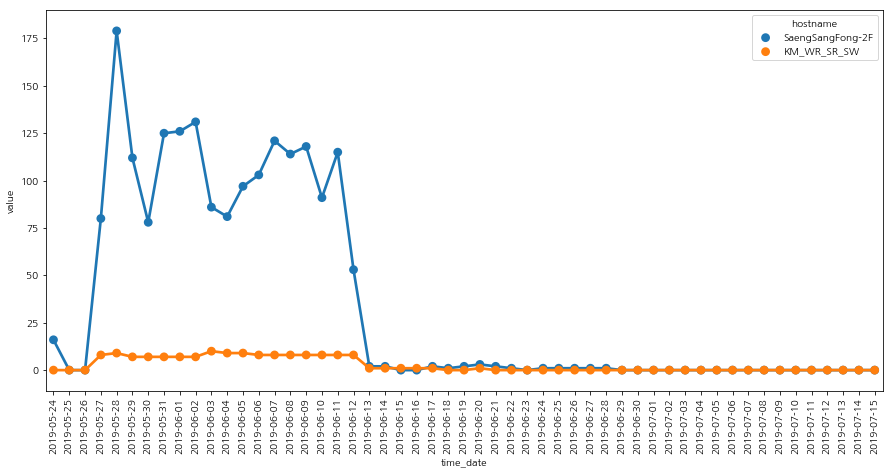

,alarm_name,hostname,time
3,포트 다운,SaengSangFong-2F,1843
2,포트 다운,KM_WR_SR_SW,141


>>>>>>>>>cluster50


<Figure size 432x288 with 0 Axes>

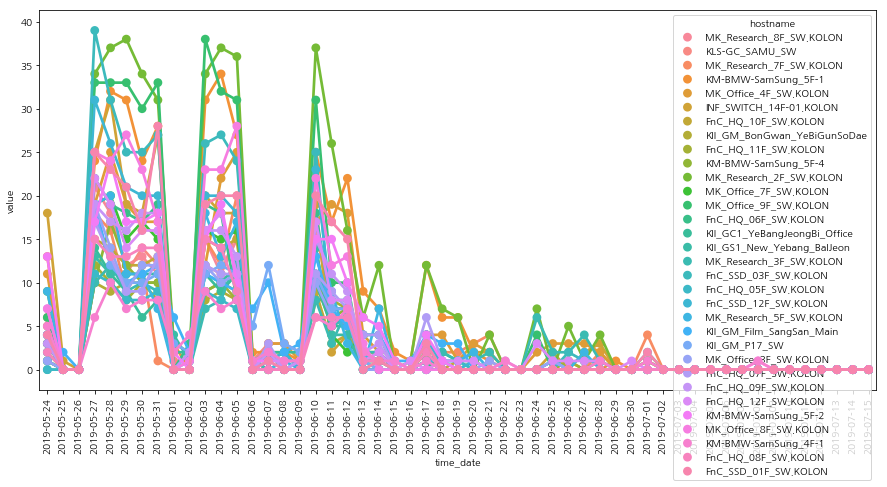

,alarm_name,hostname,time
57,포트 다운,MK_Research_2F_SW.KOLON,439
49,포트 다운,KM-BMW-SamSung_5F-1,366
56,포트 다운,MK_Office_9F_SW.KOLON,325
39,포트 다운,FnC_SSD_03F_SW.KOLON,273
53,포트 다운,MK_Office_4F_SW.KOLON,260
55,포트 다운,MK_Office_8F_SW.KOLON,244
41,포트 다운,INF_SWITCH_14F-01.KOLON,235
38,포트 다운,FnC_SSD_01F_SW.KOLON,232
40,포트 다운,FnC_SSD_12F_SW.KOLON,226
50,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster51


<Figure size 432x288 with 0 Axes>

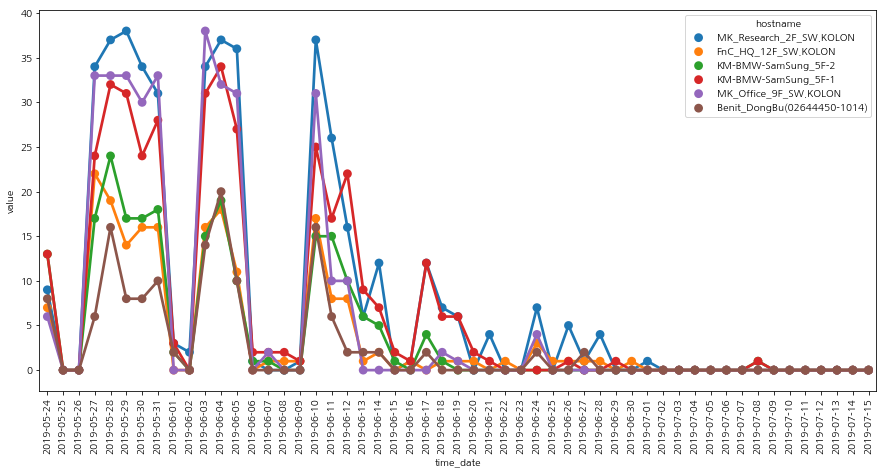

,alarm_name,hostname,time
12,포트 다운,MK_Research_2F_SW.KOLON,439
9,포트 다운,KM-BMW-SamSung_5F-1,366
11,포트 다운,MK_Office_9F_SW.KOLON,325
10,포트 다운,KM-BMW-SamSung_5F-2,211
8,포트 다운,FnC_HQ_12F_SW.KOLON,189
7,포트 다운,Benit_DongBu(02644450-1014),132


>>>>>>>>>cluster52


<Figure size 432x288 with 0 Axes>

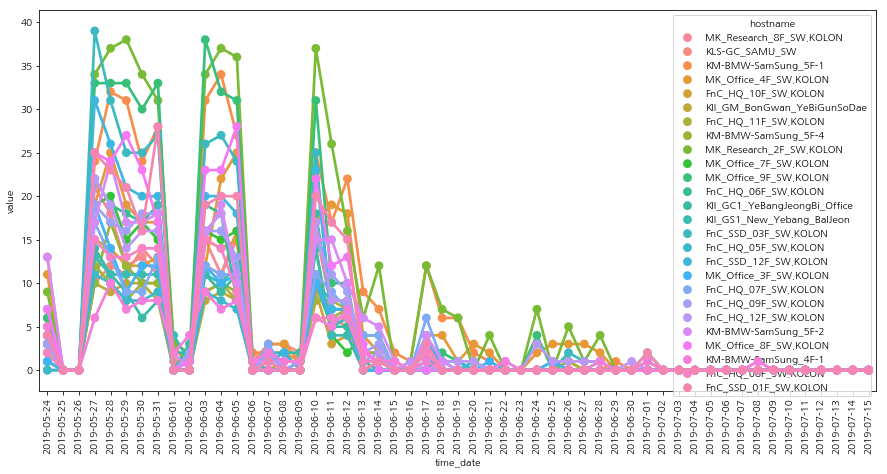

,alarm_name,hostname,time
48,포트 다운,MK_Research_2F_SW.KOLON,439
40,포트 다운,KM-BMW-SamSung_5F-1,366
47,포트 다운,MK_Office_9F_SW.KOLON,325
33,포트 다운,FnC_SSD_03F_SW.KOLON,273
44,포트 다운,MK_Office_4F_SW.KOLON,260
46,포트 다운,MK_Office_8F_SW.KOLON,244
32,포트 다운,FnC_SSD_01F_SW.KOLON,232
34,포트 다운,FnC_SSD_12F_SW.KOLON,226
41,포트 다운,KM-BMW-SamSung_5F-2,211
31,포트 다운,FnC_HQ_12F_SW.KOLON,189


>>>>>>>>>cluster53


<Figure size 432x288 with 0 Axes>

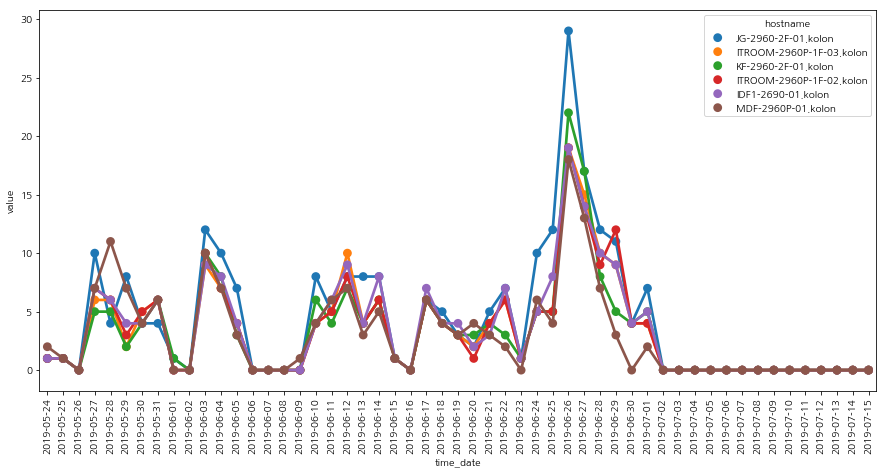

,alarm_name,hostname,time
3,ICMP 응답시간,JG-2960-2F-01.kolon,195
0,ICMP 응답시간,IDF1-2690-01.kolon,176
2,ICMP 응답시간,ITROOM-2960P-1F-03.kolon,166
1,ICMP 응답시간,ITROOM-2960P-1F-02.kolon,163
4,ICMP 응답시간,KF-2960-2F-01.kolon,161
5,ICMP 응답시간,MDF-2960P-01.kolon,149


>>>>>>>>>cluster54


<Figure size 432x288 with 0 Axes>

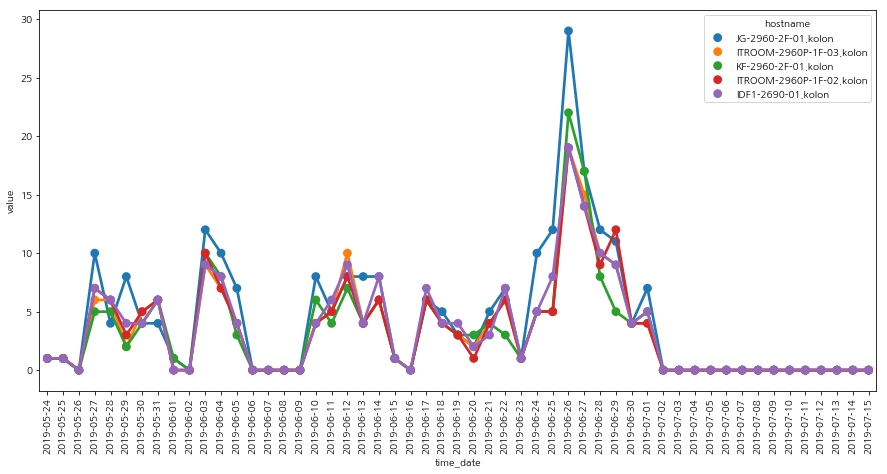

,alarm_name,hostname,time
3,ICMP 응답시간,JG-2960-2F-01.kolon,195
0,ICMP 응답시간,IDF1-2690-01.kolon,176
2,ICMP 응답시간,ITROOM-2960P-1F-03.kolon,166
1,ICMP 응답시간,ITROOM-2960P-1F-02.kolon,163
4,ICMP 응답시간,KF-2960-2F-01.kolon,161


>>>>>>>>>cluster55


<Figure size 432x288 with 0 Axes>

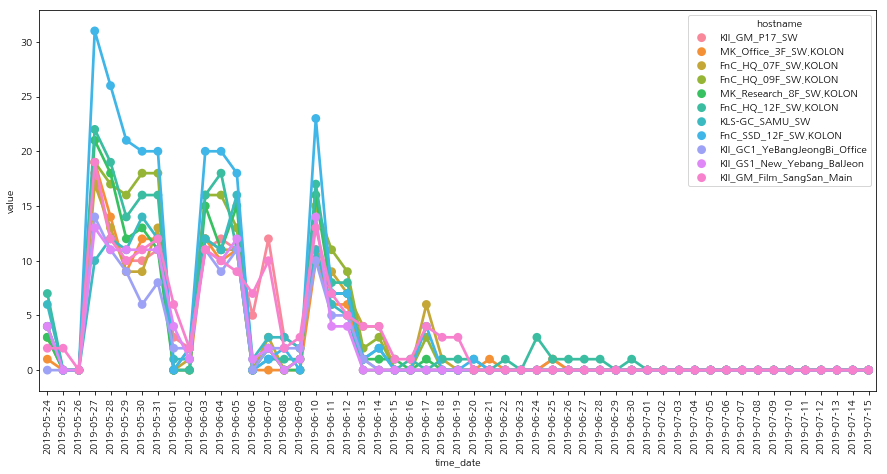

,alarm_name,hostname,time
13,포트 다운,FnC_SSD_12F_SW.KOLON,226
12,포트 다운,FnC_HQ_12F_SW.KOLON,189
11,포트 다운,FnC_HQ_09F_SW.KOLON,182
15,포트 다운,KII_GM_Film_SangSan_Main,170
16,포트 다운,KII_GM_P17_SW,153
20,포트 다운,MK_Research_8F_SW.KOLON,151
10,포트 다운,FnC_HQ_07F_SW.KOLON,144
18,포트 다운,KLS-GC_SAMU_SW,131
17,포트 다운,KII_GS1_New_Yebang_BalJeon,124
19,포트 다운,MK_Office_3F_SW.KOLON,120


>>>>>>>>>cluster56


<Figure size 432x288 with 0 Axes>

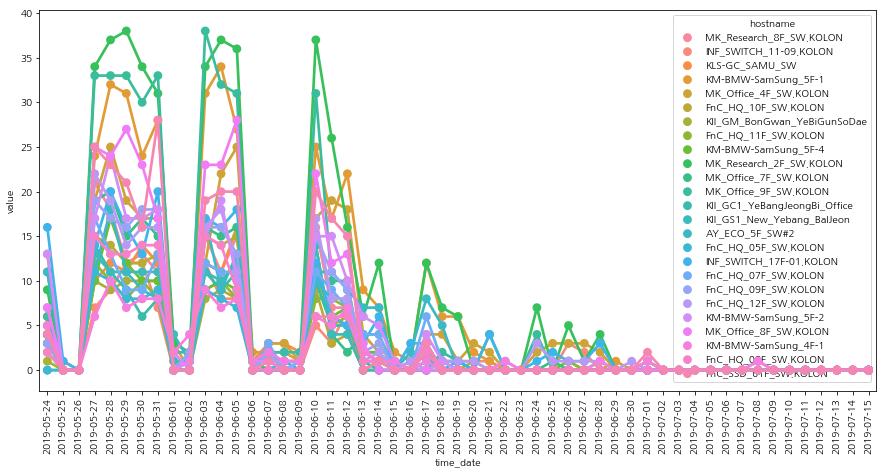

,alarm_name,hostname,time
51,포트 다운,MK_Research_2F_SW.KOLON,439
44,포트 다운,KM-BMW-SamSung_5F-1,366
50,포트 다운,MK_Office_9F_SW.KOLON,325
47,포트 다운,MK_Office_4F_SW.KOLON,260
49,포트 다운,MK_Office_8F_SW.KOLON,244
36,포트 다운,FnC_SSD_01F_SW.KOLON,232
45,포트 다운,KM-BMW-SamSung_5F-2,211
38,포트 다운,INF_SWITCH_17F-01.KOLON,200
35,포트 다운,FnC_HQ_12F_SW.KOLON,189
32,포트 다운,FnC_HQ_09F_SW.KOLON,182


>>>>>>>>>cluster57


<Figure size 432x288 with 0 Axes>

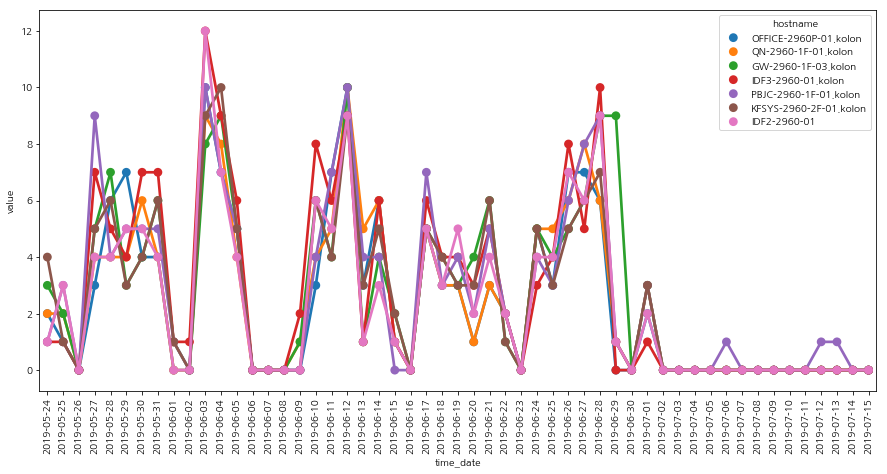

,alarm_name,hostname,time
2,ICMP 응답시간,IDF3-2960-01.kolon,128
0,ICMP 응답시간,GW-2960-1F-03.kolon,124
3,ICMP 응답시간,KFSYS-2960-2F-01.kolon,124
5,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
1,ICMP 응답시간,IDF2-2960-01,120
4,ICMP 응답시간,OFFICE-2960P-01.kolon,119
6,ICMP 응답시간,QN-2960-1F-01.kolon,119


>>>>>>>>>cluster58


<Figure size 432x288 with 0 Axes>

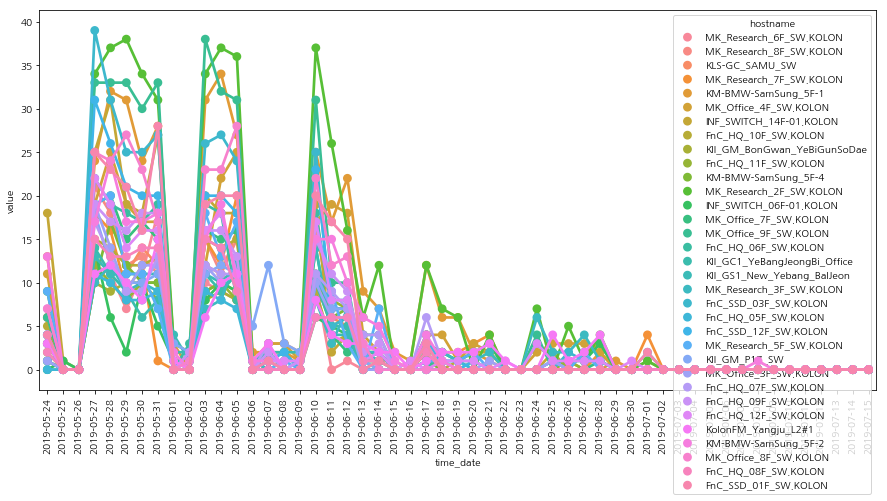

,alarm_name,hostname,time
60,포트 다운,MK_Research_2F_SW.KOLON,439
51,포트 다운,KM-BMW-SamSung_5F-1,366
59,포트 다운,MK_Office_9F_SW.KOLON,325
42,포트 다운,FnC_SSD_03F_SW.KOLON,273
56,포트 다운,MK_Office_4F_SW.KOLON,260
58,포트 다운,MK_Office_8F_SW.KOLON,244
45,포트 다운,INF_SWITCH_14F-01.KOLON,235
41,포트 다운,FnC_SSD_01F_SW.KOLON,232
43,포트 다운,FnC_SSD_12F_SW.KOLON,226
52,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster59


<Figure size 432x288 with 0 Axes>

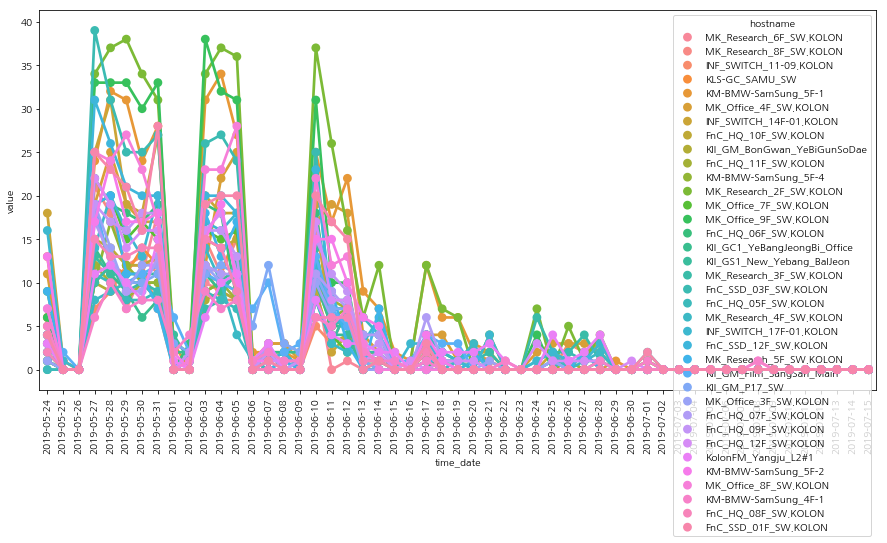

,alarm_name,hostname,time
67,포트 다운,MK_Research_2F_SW.KOLON,439
58,포트 다운,KM-BMW-SamSung_5F-1,366
66,포트 다운,MK_Office_9F_SW.KOLON,325
46,포트 다운,FnC_SSD_03F_SW.KOLON,273
63,포트 다운,MK_Office_4F_SW.KOLON,260
65,포트 다운,MK_Office_8F_SW.KOLON,244
49,포트 다운,INF_SWITCH_14F-01.KOLON,235
45,포트 다운,FnC_SSD_01F_SW.KOLON,232
47,포트 다운,FnC_SSD_12F_SW.KOLON,226
59,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster60


<Figure size 432x288 with 0 Axes>

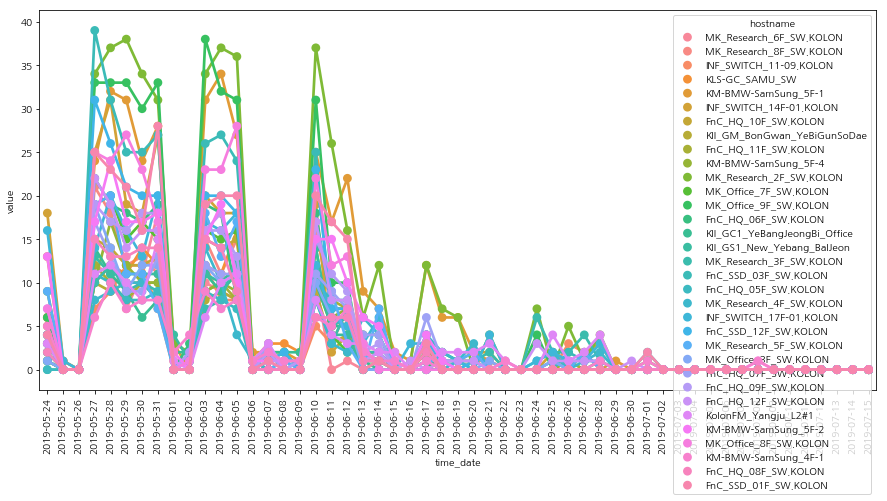

,alarm_name,hostname,time
62,포트 다운,MK_Research_2F_SW.KOLON,439
54,포트 다운,KM-BMW-SamSung_5F-1,366
61,포트 다운,MK_Office_9F_SW.KOLON,325
44,포트 다운,FnC_SSD_03F_SW.KOLON,273
60,포트 다운,MK_Office_8F_SW.KOLON,244
47,포트 다운,INF_SWITCH_14F-01.KOLON,235
43,포트 다운,FnC_SSD_01F_SW.KOLON,232
45,포트 다운,FnC_SSD_12F_SW.KOLON,226
55,포트 다운,KM-BMW-SamSung_5F-2,211
48,포트 다운,INF_SWITCH_17F-01.KOLON,200


>>>>>>>>>cluster61


<Figure size 432x288 with 0 Axes>

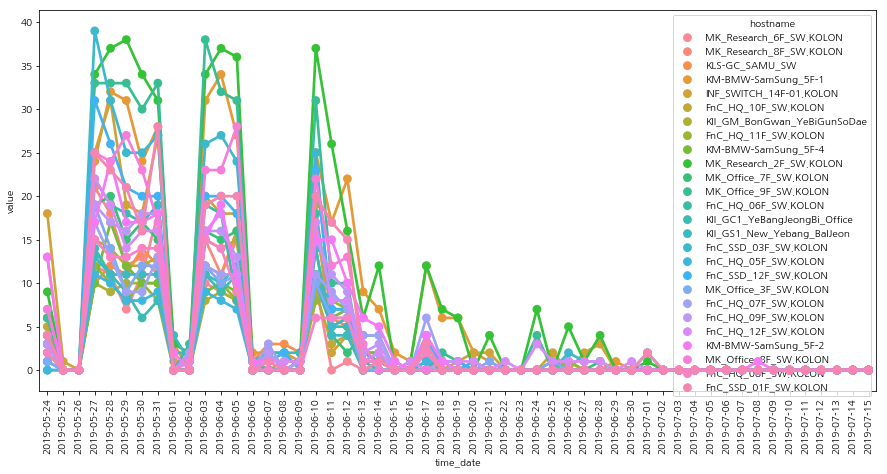

,alarm_name,hostname,time
48,포트 다운,MK_Research_2F_SW.KOLON,439
41,포트 다운,KM-BMW-SamSung_5F-1,366
47,포트 다운,MK_Office_9F_SW.KOLON,325
34,포트 다운,FnC_SSD_03F_SW.KOLON,273
46,포트 다운,MK_Office_8F_SW.KOLON,244
36,포트 다운,INF_SWITCH_14F-01.KOLON,235
33,포트 다운,FnC_SSD_01F_SW.KOLON,232
35,포트 다운,FnC_SSD_12F_SW.KOLON,226
42,포트 다운,KM-BMW-SamSung_5F-2,211
32,포트 다운,FnC_HQ_12F_SW.KOLON,189


>>>>>>>>>cluster62


<Figure size 432x288 with 0 Axes>

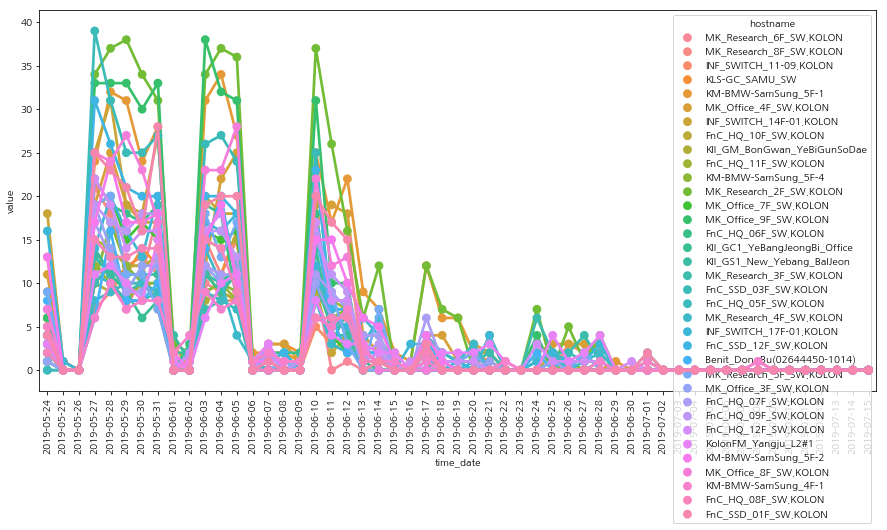

,alarm_name,hostname,time
67,포트 다운,MK_Research_2F_SW.KOLON,439
58,포트 다운,KM-BMW-SamSung_5F-1,366
66,포트 다운,MK_Office_9F_SW.KOLON,325
48,포트 다운,FnC_SSD_03F_SW.KOLON,273
63,포트 다운,MK_Office_4F_SW.KOLON,260
65,포트 다운,MK_Office_8F_SW.KOLON,244
51,포트 다운,INF_SWITCH_14F-01.KOLON,235
47,포트 다운,FnC_SSD_01F_SW.KOLON,232
49,포트 다운,FnC_SSD_12F_SW.KOLON,226
59,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster63


<Figure size 432x288 with 0 Axes>

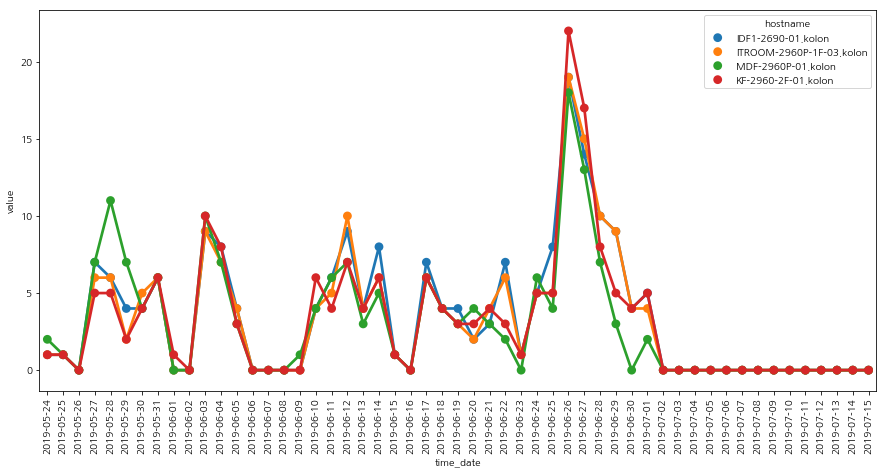

,alarm_name,hostname,time
0,ICMP 응답시간,IDF1-2690-01.kolon,176
1,ICMP 응답시간,ITROOM-2960P-1F-03.kolon,166
2,ICMP 응답시간,KF-2960-2F-01.kolon,161
3,ICMP 응답시간,MDF-2960P-01.kolon,149


>>>>>>>>>cluster64


<Figure size 432x288 with 0 Axes>

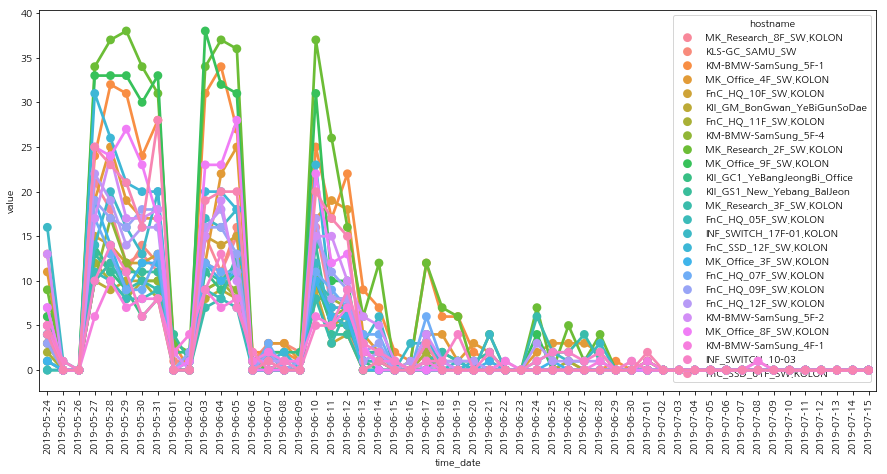

,alarm_name,hostname,time
47,포트 다운,MK_Research_2F_SW.KOLON,439
40,포트 다운,KM-BMW-SamSung_5F-1,366
46,포트 다운,MK_Office_9F_SW.KOLON,325
44,포트 다운,MK_Office_4F_SW.KOLON,260
45,포트 다운,MK_Office_8F_SW.KOLON,244
31,포트 다운,FnC_SSD_01F_SW.KOLON,232
32,포트 다운,FnC_SSD_12F_SW.KOLON,226
41,포트 다운,KM-BMW-SamSung_5F-2,211
34,포트 다운,INF_SWITCH_17F-01.KOLON,200
30,포트 다운,FnC_HQ_12F_SW.KOLON,189


>>>>>>>>>cluster65


<Figure size 432x288 with 0 Axes>

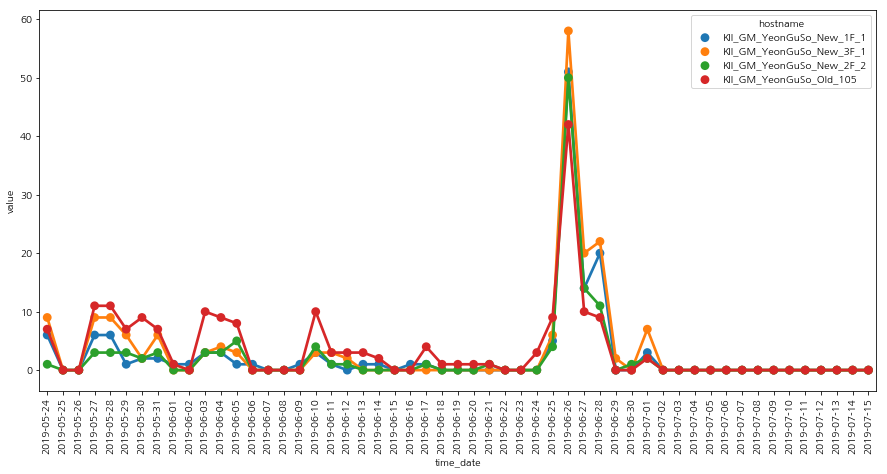

,alarm_name,hostname,time
11,포트 다운,KII_GM_YeonGuSo_Old_105,180
10,포트 다운,KII_GM_YeonGuSo_New_3F_1,170
8,포트 다운,KII_GM_YeonGuSo_New_1F_1,131
9,포트 다운,KII_GM_YeonGuSo_New_2F_2,112


>>>>>>>>>cluster66


<Figure size 432x288 with 0 Axes>

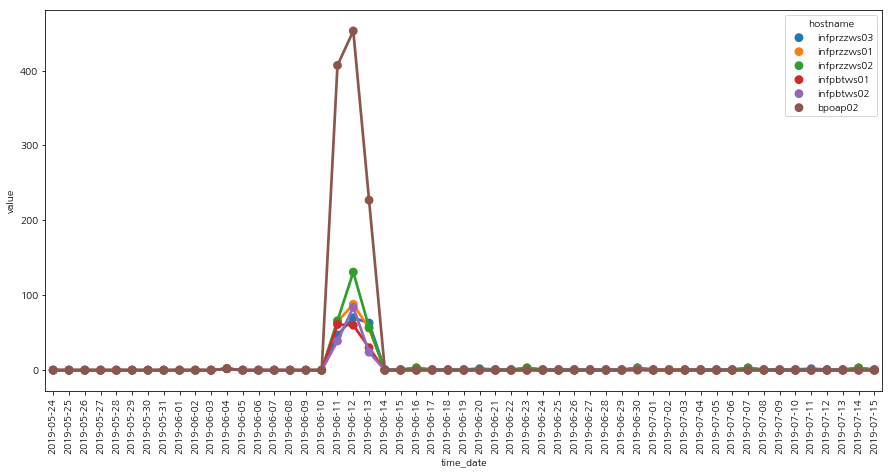

,alarm_name,hostname,time
17,WAS 평균응답시간,bpoap02,603
9,SQL 평균수행시간,bpoap02,474
21,WAS 평균응답시간,infprzzws02,254
20,WAS 평균응답시간,infprzzws01,209
22,WAS 평균응답시간,infprzzws03,178


>>>>>>>>>cluster67


<Figure size 432x288 with 0 Axes>

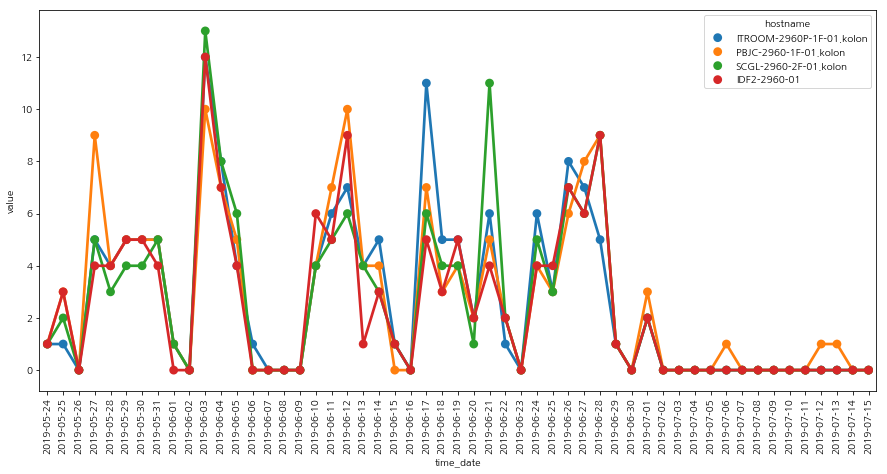

,alarm_name,hostname,time
2,ICMP 응답시간,PBJC-2960-1F-01.kolon,123
1,ICMP 응답시간,ITROOM-2960P-1F-01.kolon,122
0,ICMP 응답시간,IDF2-2960-01,120
3,ICMP 응답시간,SCGL-2960-2F-01.kolon,118


>>>>>>>>>cluster68


<Figure size 432x288 with 0 Axes>

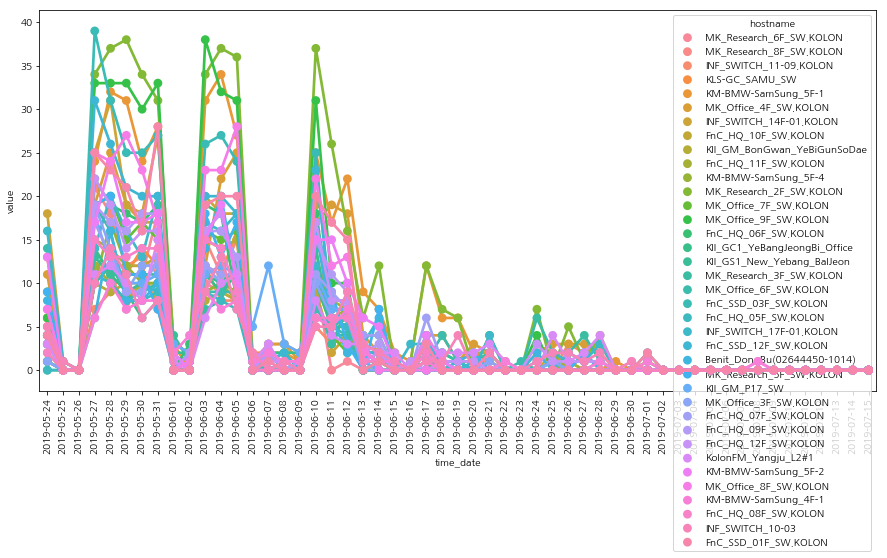

,alarm_name,hostname,time
72,포트 다운,MK_Research_2F_SW.KOLON,439
62,포트 다운,KM-BMW-SamSung_5F-1,366
71,포트 다운,MK_Office_9F_SW.KOLON,325
50,포트 다운,FnC_SSD_03F_SW.KOLON,273
67,포트 다운,MK_Office_4F_SW.KOLON,260
70,포트 다운,MK_Office_8F_SW.KOLON,244
54,포트 다운,INF_SWITCH_14F-01.KOLON,235
49,포트 다운,FnC_SSD_01F_SW.KOLON,232
51,포트 다운,FnC_SSD_12F_SW.KOLON,226
63,포트 다운,KM-BMW-SamSung_5F-2,211


>>>>>>>>>cluster69


<Figure size 432x288 with 0 Axes>

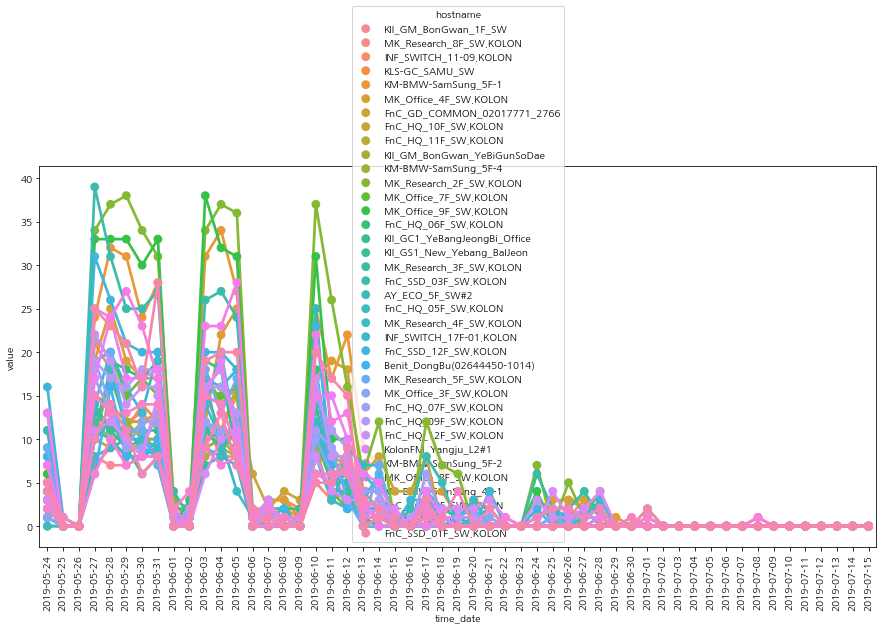

,alarm_name,hostname,time
73,포트 다운,MK_Research_2F_SW.KOLON,439
64,포트 다운,KM-BMW-SamSung_5F-1,366
72,포트 다운,MK_Office_9F_SW.KOLON,325
53,포트 다운,FnC_SSD_03F_SW.KOLON,273
69,포트 다운,MK_Office_4F_SW.KOLON,260
71,포트 다운,MK_Office_8F_SW.KOLON,244
52,포트 다운,FnC_SSD_01F_SW.KOLON,232
54,포트 다운,FnC_SSD_12F_SW.KOLON,226
65,포트 다운,KM-BMW-SamSung_5F-2,211
57,포트 다운,INF_SWITCH_17F-01.KOLON,200


>>>>>>>>>cluster70


<Figure size 432x288 with 0 Axes>

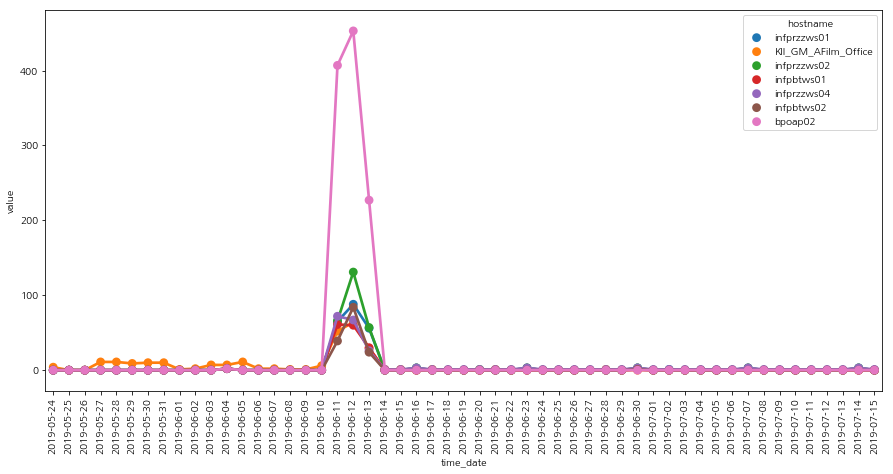

,alarm_name,hostname,time
17,WAS 평균응답시간,bpoap02,603
9,SQL 평균수행시간,bpoap02,474
21,WAS 평균응답시간,infprzzws02,254
25,포트 다운,KII_GM_AFilm_Office,245
20,WAS 평균응답시간,infprzzws01,209
22,WAS 평균응답시간,infprzzws04,163


>>>>>>>>>cluster71


<Figure size 432x288 with 0 Axes>

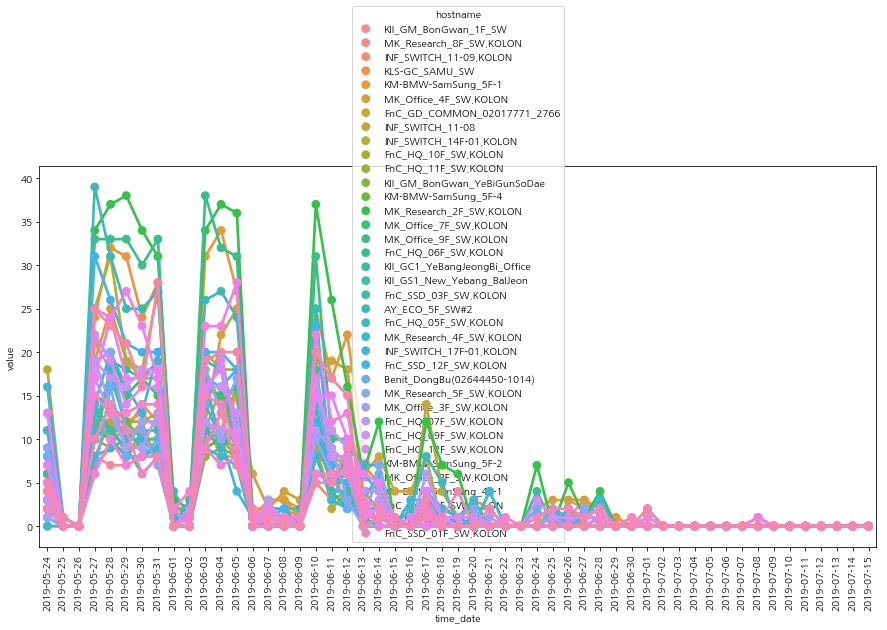

,alarm_name,hostname,time
79,포트 다운,MK_Research_2F_SW.KOLON,439
71,포트 다운,KM-BMW-SamSung_5F-1,366
78,포트 다운,MK_Office_9F_SW.KOLON,325
58,포트 다운,FnC_SSD_03F_SW.KOLON,273
75,포트 다운,MK_Office_4F_SW.KOLON,260
77,포트 다운,MK_Office_8F_SW.KOLON,244
63,포트 다운,INF_SWITCH_14F-01.KOLON,235
57,포트 다운,FnC_SSD_01F_SW.KOLON,232
59,포트 다운,FnC_SSD_12F_SW.KOLON,226
72,포트 다운,KM-BMW-SamSung_5F-2,211


<Figure size 432x288 with 0 Axes>

In [317]:
chart_cluster(clusters_new,data_alarm_result)

In [467]:
data_df_date

hostname,2015KESMIS,2015bntjennifer,2015groupdb01,AY_ECO_5F_SW#2,Benit_DongBu(02644450-1014),DES,FIRMAP01,FIRMAP02,FNC_V-PLEX_L3.KOLON,FnC_GD_COMMON_02017771_2766,...,ohd,picarseat,pimshub02,rtims,sharedb,skcpcodb01,spmail2015,tmsdb,unitax,zenius
time_date,,,,,,,,,,,,,,,,,,,,,
2019-05-24,0,0,0,11,8,0,0,0,2,8,...,0,0,0,0,0,0,0,0,0,0
2019-05-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2019-05-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2019-05-27,0,0,0,11,6,0,0,0,17,10,...,0,0,0,0,0,0,0,0,0,0
2019-05-28,0,0,0,18,16,0,0,0,24,12,...,0,0,0,0,0,0,0,0,0,0
2019-05-29,8,0,0,11,8,0,1,0,0,10,...,1,7,30,87,11,1,0,1,1,0
2019-05-30,13,3,1,9,8,0,6,0,0,12,...,2,2,21,98,16,3,6,3,3,10
2019-05-31,2,3,2,8,10,1,12,0,0,12,...,3,1,2,116,10,21,5,2,2,10
2019-06-01,35,2,2,1,2,3,3,0,0,0,...,3,4,44,114,12,36,2,4,2,12


Kmeans

In [464]:
from sklearn.preprocessing import MinMaxScaler
scalerX = MinMaxScaler()
data_scaled = scalerX.fit_transform(data_df_date.T)

In [465]:
data_scaled

array([[0.        , 0.        , 0.        , ..., 0.01136364, 0.05      ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.02272727, 0.01666667,
        0.01470588],
       ...,
       [0.        , 0.        , 0.        , ..., 0.02272727, 0.03333333,
        0.04411765],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

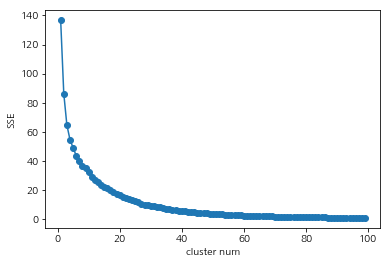

In [368]:
def elbow(x):
    sse = []
    for i in range(1,100):
        km = KMeans(n_clusters=i,init='k-means++', random_state=0)
        km.fit(x)
        sse.append(km.inertia_)
    plt.plot(range(1,100), sse, marker='o')
    plt.xlabel('cluster num')
    plt.ylabel('SSE')
    plt.show()

elbow(data_scaled)

In [468]:
km = KMeans(n_clusters=40,init='k-means++', random_state=0)

In [469]:
km.fit(data_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=40, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

In [490]:
data_scaled

array([[0.        , 0.        , 0.        , ..., 0.01136364, 0.05      ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.02272727, 0.01666667,
        0.01470588],
       ...,
       [0.        , 0.        , 0.        , ..., 0.02272727, 0.03333333,
        0.04411765],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [470]:
predict = km.predict(data_scaled)

In [472]:
new_df = data_df_date.T

In [473]:
new_df['cluster'] = predict

In [474]:
new_df['cluster'].unique()

array([14, 34, 36,  1, 39,  8, 28, 23, 26, 18, 17,  4,  6, 27, 22, 19,  9,
        5, 20, 11, 25, 30, 38,  0, 31, 10, 29, 15, 24,  7, 35, 32, 37, 12,
       16,  2,  3, 21, 33, 13])

In [476]:
clusters = [new_df[new_df['cluster'] == cluster_id].index for cluster_id in new_df['cluster'].unique()]

In [477]:
list(clusters[0])

['2015KESMIS',
 'INFPFADB01',
 'KII_GM_SeolBi_2_Team',
 'KII_GM_YeBangJeongBiTeam_SW',
 'KII_USKF&T_Dis_SW#1',
 'KPCMES',
 'SHAREPOINTDB',
 'csmdb',
 'infpzeniusdb01',
 'itmdwsvr02',
 'kolonsporex_seocho_singwan_SW',
 'lavieestbelle',
 'nbumaster',
 'sharedb',
 'zenius']

In [478]:
data_df_date = c_nodes.groupby(['time_date','hostname'])['degree'].count().reindex().reset_index()
data_df_date = data_df_date.pivot_table(values='degree',columns='hostname',index=data_df_date['time_date'],aggfunc='first',fill_value=0)
data_df_date = data_df_date.reset_index()

>>>>>>>>>cluster0


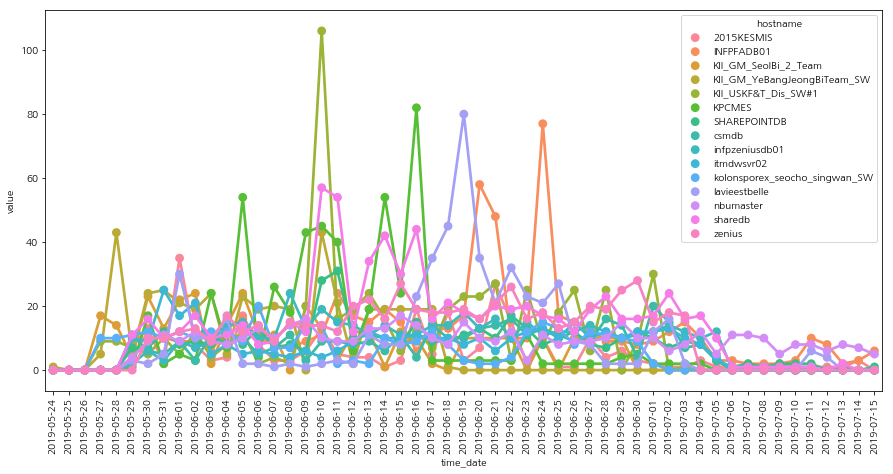

,alarm_name,hostname,time
15,Disk I/O 처리율,zenius,587
14,Disk I/O 처리율,sharedb,561
61,포트 다운,KII_USKF&T_Dis_SW#1,551
10,Disk I/O 처리율,infpzeniusdb01,457
30,Memory 사용률,KPCMES,455
32,Memory 사용률,lavieestbelle,449
60,포트 다운,KII_GM_YeBangJeongBiTeam_SW,415
34,Network Interface 사용률,nbumaster,409
11,Disk I/O 처리율,itmdwsvr02,378
9,Disk I/O 처리율,csmdb,355


>>>>>>>>>cluster1


<Figure size 432x288 with 0 Axes>

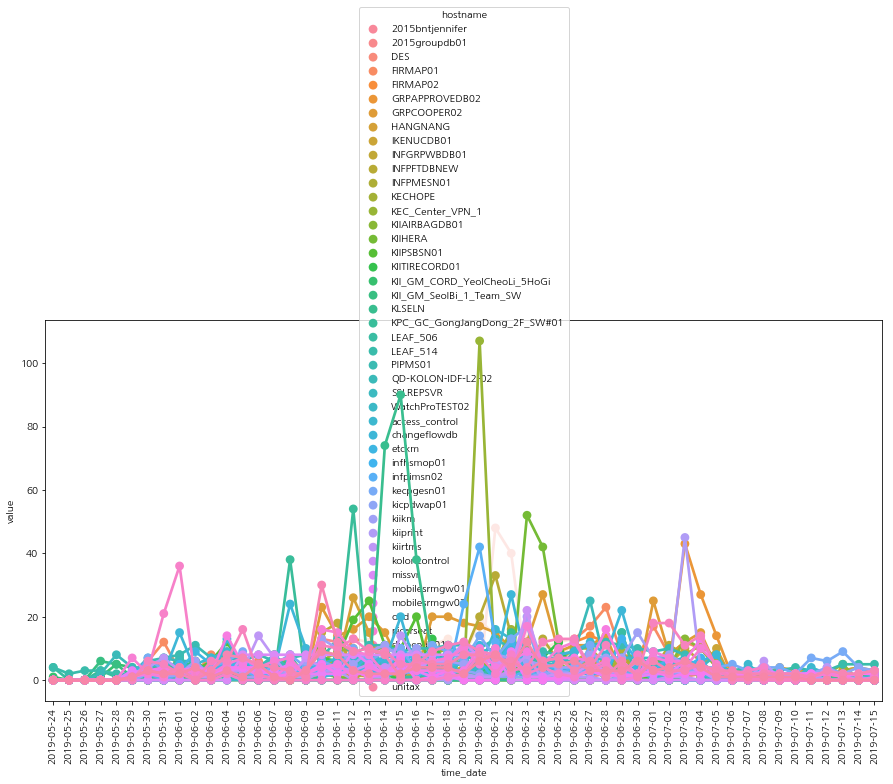

,alarm_name,hostname,time
33,Disk I/O 처리율,FIRMAP01,331
48,Disk I/O 처리율,PIPMS01,317
134,데드락 발생,GRPCOOPER02,298
66,Disk I/O 처리율,spmail2015,286
51,Disk I/O 처리율,changeflowdb,272
47,Disk I/O 처리율,KLSELN,254
115,Memory 사용률,kecpgesn01,215
49,Disk I/O 처리율,SSLREPSVR,200
63,Disk I/O 처리율,ohd,183
53,Disk I/O 처리율,infhsmop01,166


>>>>>>>>>cluster2


<Figure size 432x288 with 0 Axes>

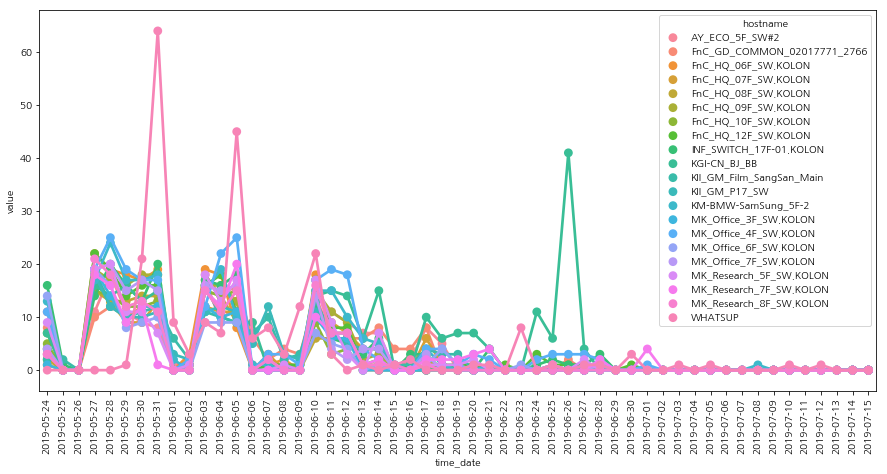

,alarm_name,hostname,time
47,포트 다운,MK_Office_4F_SW.KOLON,260
3,ICMP 응답시간,KGI-CN_BJ_BB,231
45,포트 다운,KM-BMW-SamSung_5F-2,211
6,Memory 사용률,WHATSUP,208
41,포트 다운,INF_SWITCH_17F-01.KOLON,200
40,포트 다운,FnC_HQ_12F_SW.KOLON,189
34,포트 다운,FnC_GD_COMMON_02017771_2766,185
38,포트 다운,FnC_HQ_09F_SW.KOLON,182
35,포트 다운,FnC_HQ_06F_SW.KOLON,177
43,포트 다운,KII_GM_Film_SangSan_Main,170


>>>>>>>>>cluster3


<Figure size 432x288 with 0 Axes>

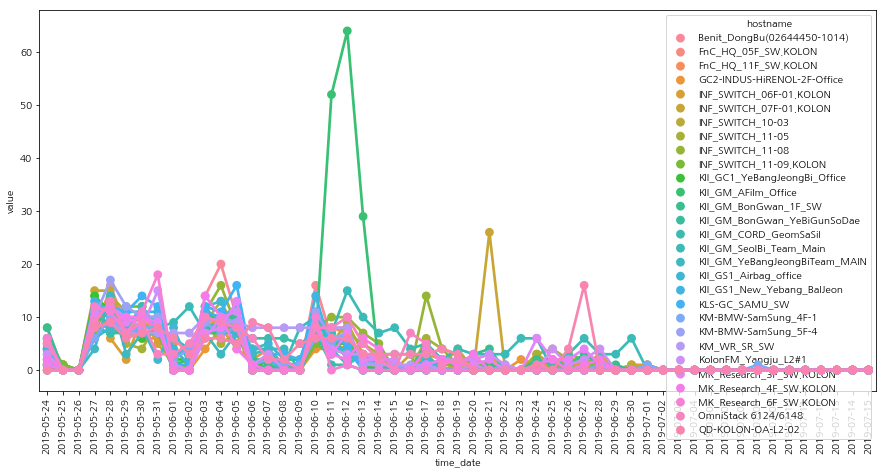

,alarm_name,hostname,time
50,포트 다운,KII_GM_AFilm_Office,245
54,포트 다운,KII_GM_SeolBi_Team_Main,227
47,포트 다운,INF_SWITCH_11-08,143
61,포트 다운,KM_WR_SR_SW,141
44,포트 다운,INF_SWITCH_07F-01.KOLON,139
66,포트 다운,OmniStack 6124/6148,136
62,포트 다운,KolonFM_Yangju_L2#1,135
39,포트 다운,Benit_DongBu(02644450-1014),132
58,포트 다운,KLS-GC_SAMU_SW,131
45,포트 다운,INF_SWITCH_10-03,127


>>>>>>>>>cluster4


<Figure size 432x288 with 0 Axes>

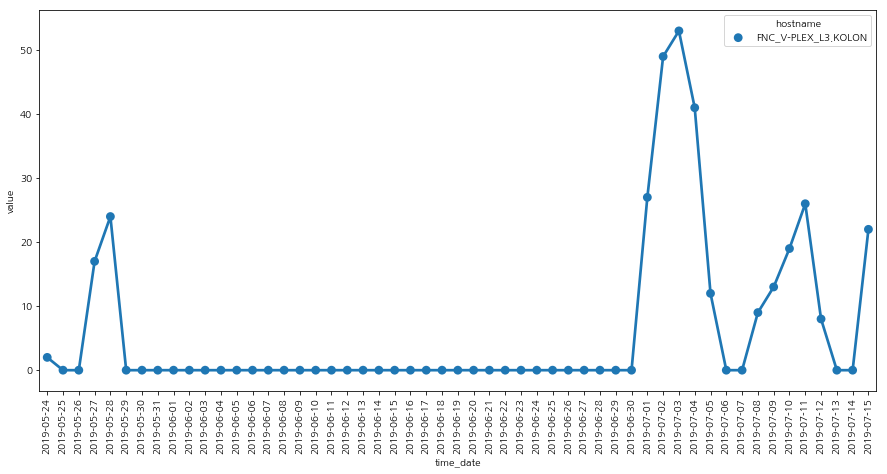

,alarm_name,hostname,time
0,CRC 오류,FNC_V-PLEX_L3.KOLON,281
5,포트 다운,FNC_V-PLEX_L3.KOLON,33


>>>>>>>>>cluster5


<Figure size 432x288 with 0 Axes>

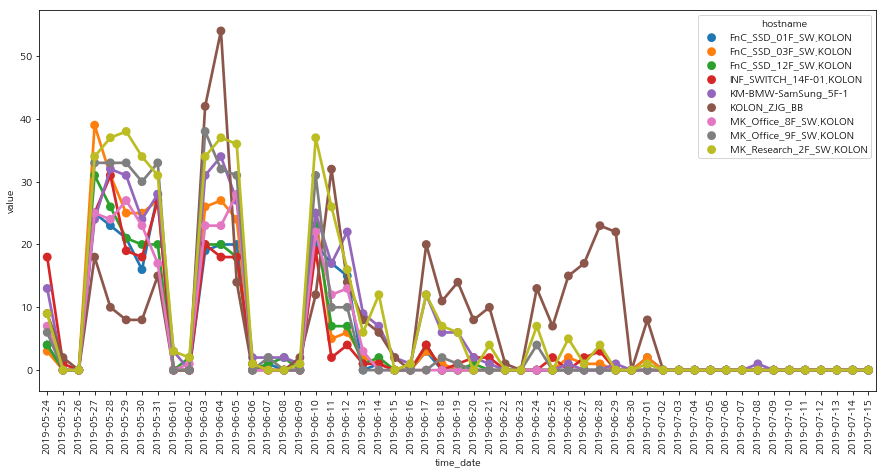

,alarm_name,hostname,time
23,포트 다운,MK_Research_2F_SW.KOLON,439
19,포트 다운,KM-BMW-SamSung_5F-1,366
22,포트 다운,MK_Office_9F_SW.KOLON,325
16,포트 다운,FnC_SSD_03F_SW.KOLON,273
0,ICMP 응답시간,KOLON_ZJG_BB,262
21,포트 다운,MK_Office_8F_SW.KOLON,244
18,포트 다운,INF_SWITCH_14F-01.KOLON,235
15,포트 다운,FnC_SSD_01F_SW.KOLON,232
17,포트 다운,FnC_SSD_12F_SW.KOLON,226
20,포트 다운,KOLON_ZJG_BB,110


>>>>>>>>>cluster6


<Figure size 432x288 with 0 Axes>

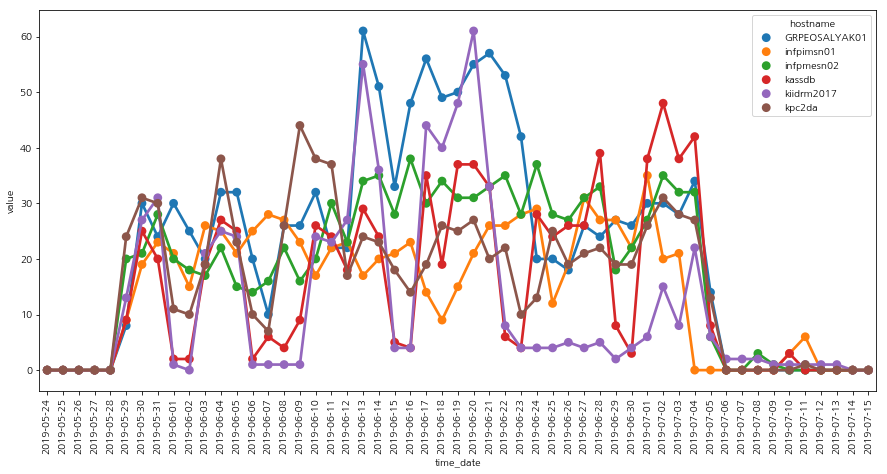

,alarm_name,hostname,time
6,Disk I/O 처리율,GRPEOSALYAK01,1203
8,Disk I/O 처리율,infpmesn02,908
11,Disk I/O 처리율,kpc2da,798
31,좀비 프로세스,infpimsn01,793
9,Disk I/O 처리율,kassdb,774
10,Disk I/O 처리율,kiidrm2017,586
17,Memory 사용률,kpc2da,45
16,Memory 사용률,infpmesn02,43
12,FileSystem 사용률,infpmesn02,38
20,블록된 세션,kiidrm2017,32


>>>>>>>>>cluster7


<Figure size 432x288 with 0 Axes>

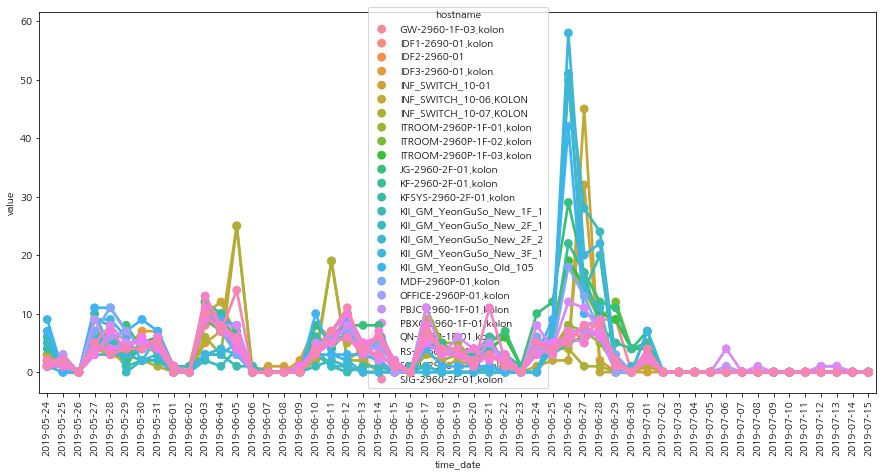

,alarm_name,hostname,time
7,ICMP 응답시간,JG-2960-2F-01.kolon,195
100,포트 다운,KII_GM_YeonGuSo_Old_105,180
1,ICMP 응답시간,IDF1-2690-01.kolon,176
99,포트 다운,KII_GM_YeonGuSo_New_3F_1,170
6,ICMP 응답시간,ITROOM-2960P-1F-03.kolon,166
5,ICMP 응답시간,ITROOM-2960P-1F-02.kolon,163
8,ICMP 응답시간,KF-2960-2F-01.kolon,161
97,포트 다운,KII_GM_YeonGuSo_New_2F_1,153
10,ICMP 응답시간,MDF-2960P-01.kolon,149
96,포트 다운,KII_GM_YeonGuSo_New_1F_1,131


>>>>>>>>>cluster8


<Figure size 432x288 with 0 Axes>

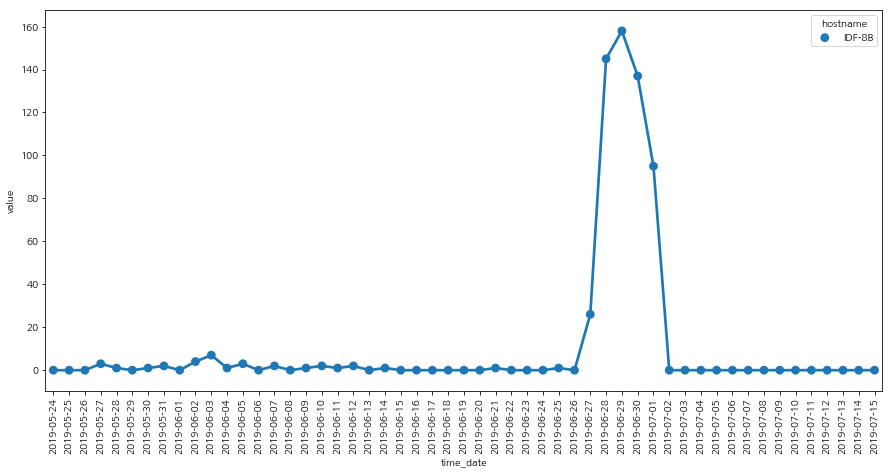

,alarm_name,hostname,time
1,포트 다운,IDF-8B,592


>>>>>>>>>cluster9


<Figure size 432x288 with 0 Axes>

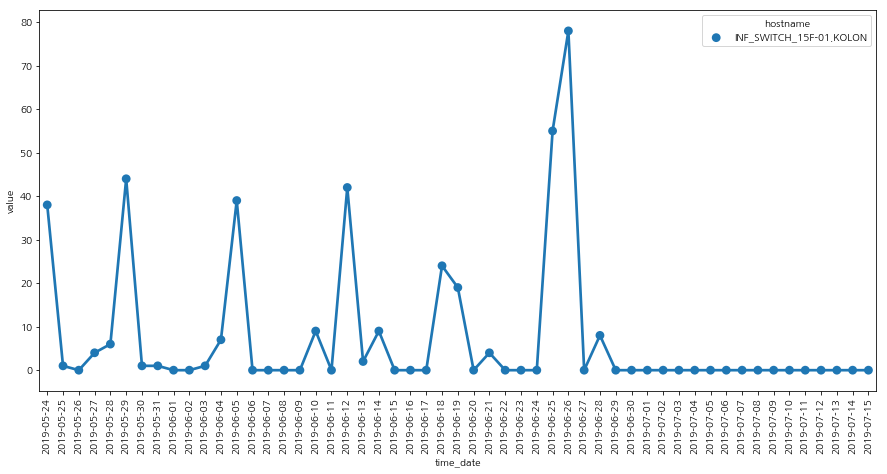

,alarm_name,hostname,time
1,트래픽 Rx 사용률,INF_SWITCH_15F-01.KOLON,198
2,트래픽 Tx 사용률,INF_SWITCH_15F-01.KOLON,176


>>>>>>>>>cluster10


<Figure size 432x288 with 0 Axes>

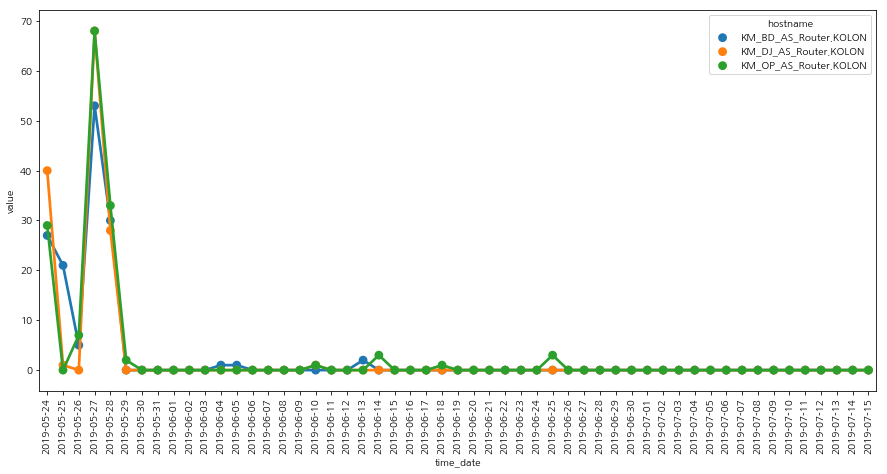

,alarm_name,hostname,time
5,트래픽 Rx 사용률,KM_DJ_AS_Router.KOLON,110
4,트래픽 Rx 사용률,KM_BD_AS_Router.KOLON,102
6,트래픽 Rx 사용률,KM_OP_AS_Router.KOLON,80
9,트래픽 Tx 사용률,KM_OP_AS_Router.KOLON,55
7,트래픽 Tx 사용률,KM_BD_AS_Router.KOLON,33


>>>>>>>>>cluster11


<Figure size 432x288 with 0 Axes>

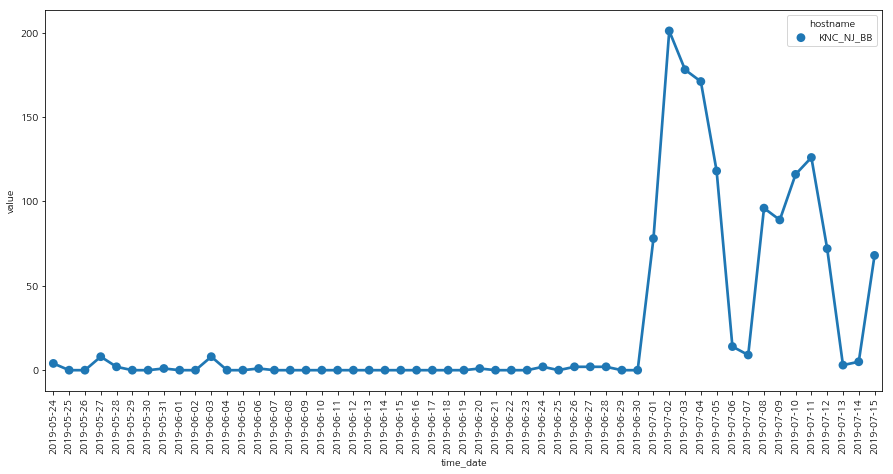

,alarm_name,hostname,time
0,CRC 오류,KNC_NJ_BB,1348


>>>>>>>>>cluster12


<Figure size 432x288 with 0 Axes>

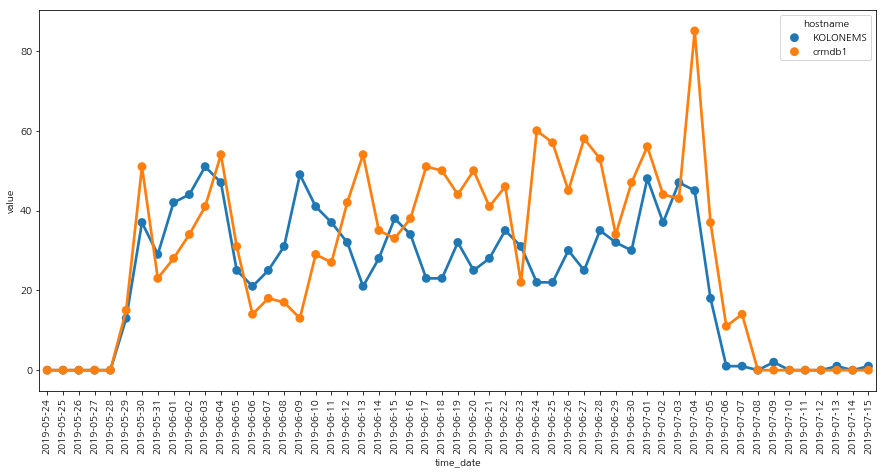

,alarm_name,hostname,time
3,Disk I/O 처리율,crmdb1,1425
2,Disk I/O 처리율,KOLONEMS,1204
7,Memory 사용률,crmdb1,59
5,Log 파일 사용률 과다,crmdb1,42
0,CPU 사용률,KOLONEMS,33


>>>>>>>>>cluster13


<Figure size 432x288 with 0 Axes>

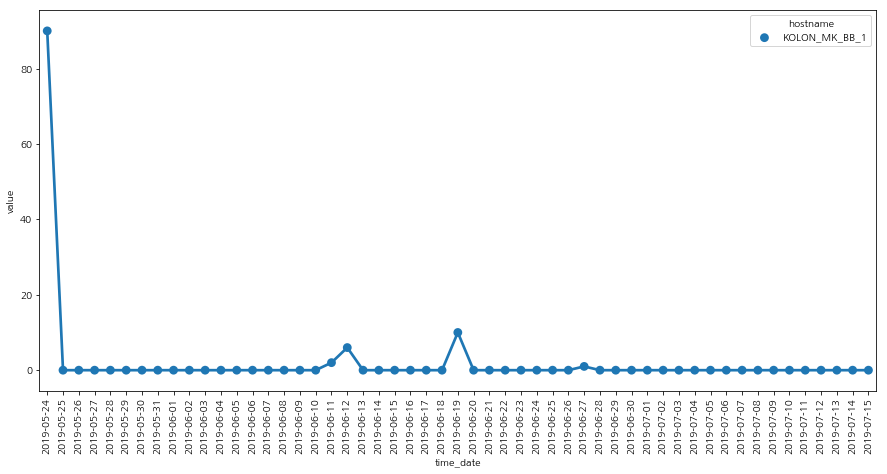

,alarm_name,hostname,time
1,온도 상태,KOLON_MK_BB_1,80


>>>>>>>>>cluster14


<Figure size 432x288 with 0 Axes>

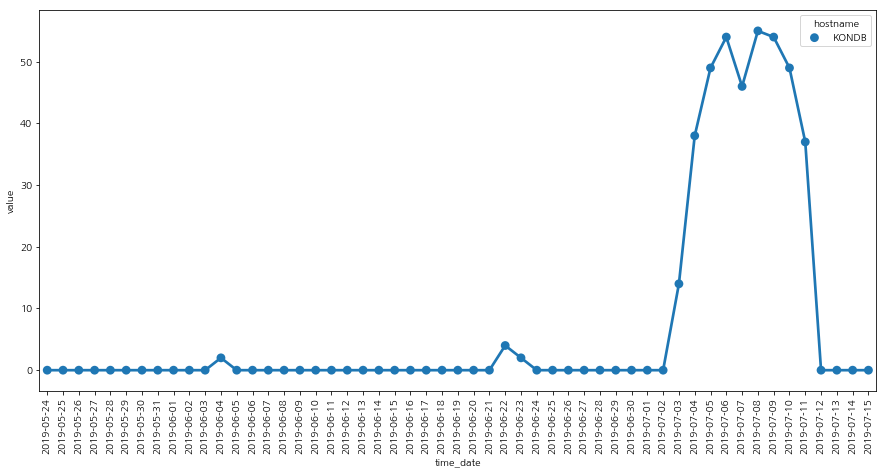

,alarm_name,hostname,time
1,Physical Fsync 지연,KONDB,303
3,비정상 연결 종료수 과다,KONDB,91


>>>>>>>>>cluster15


<Figure size 432x288 with 0 Axes>

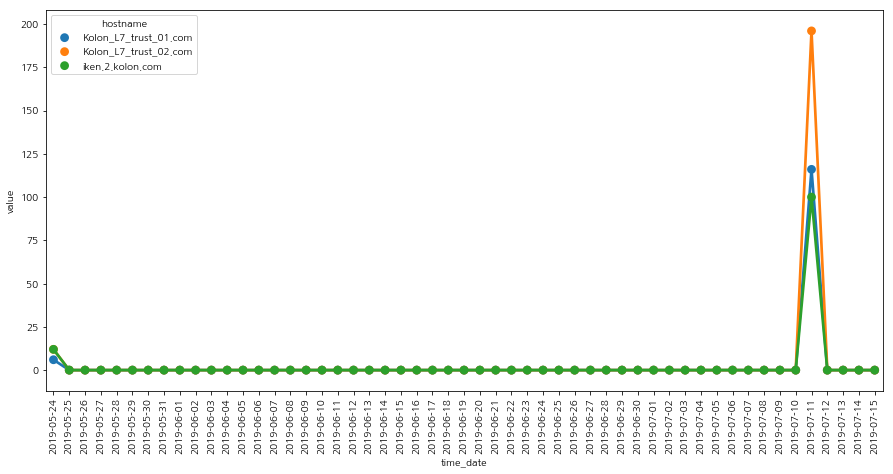

,alarm_name,hostname,time
1,L4_Real_SVR,Kolon_L7_trust_02.com,148
0,L4_Real_SVR,Kolon_L7_trust_01.com,97
2,L4_Real_SVR,iken.2.kolon.com,82
4,L4_Virtual_SVR,Kolon_L7_trust_02.com,48


>>>>>>>>>cluster16


<Figure size 432x288 with 0 Axes>

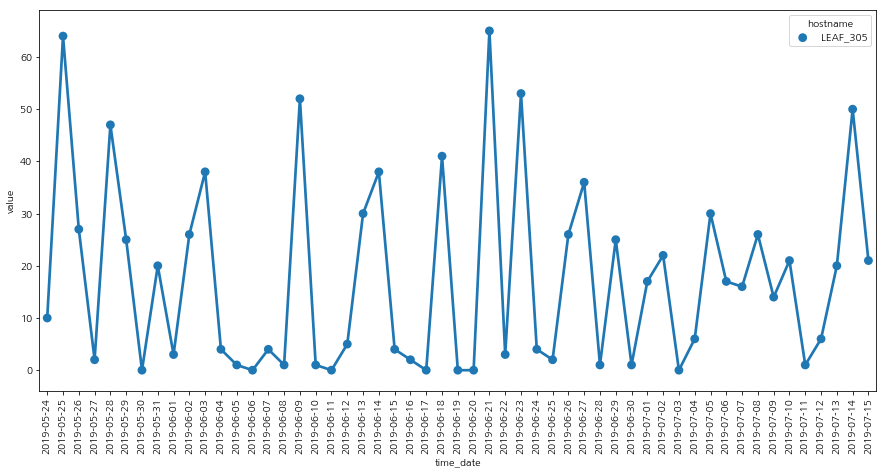

,alarm_name,hostname,time
0,트래픽 Tx 사용률,LEAF_305,924


>>>>>>>>>cluster17


<Figure size 432x288 with 0 Axes>

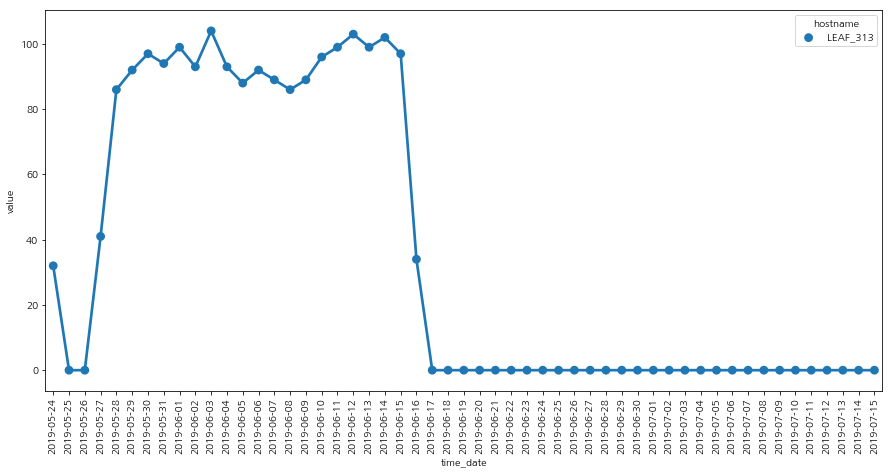

,alarm_name,hostname,time
1,포트 다운,LEAF_313,1901


>>>>>>>>>cluster18


<Figure size 432x288 with 0 Axes>

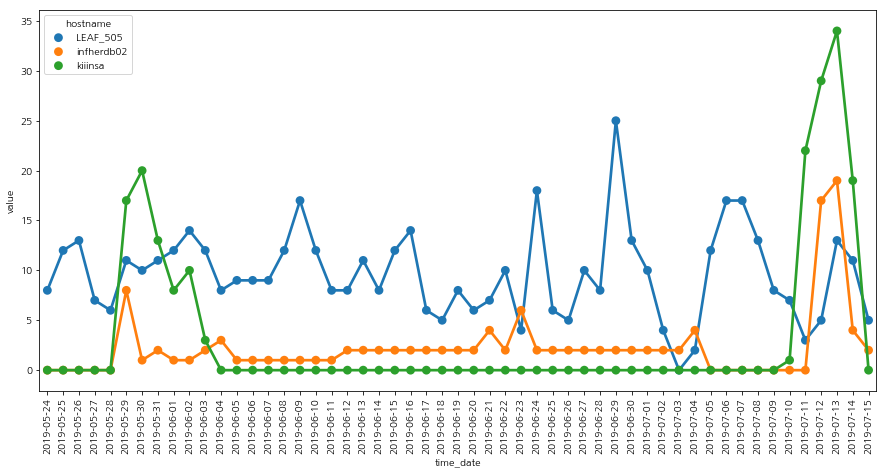

,alarm_name,hostname,time
10,트래픽 Tx 사용률,LEAF_505,502
3,FileSystem 사용률,kiiinsa,103
0,Disk I/O 처리율,infherdb02,74
4,Memory 사용률,kiiinsa,50
5,SavePoint 수행 이상,infherdb02,36


>>>>>>>>>cluster19


<Figure size 432x288 with 0 Axes>

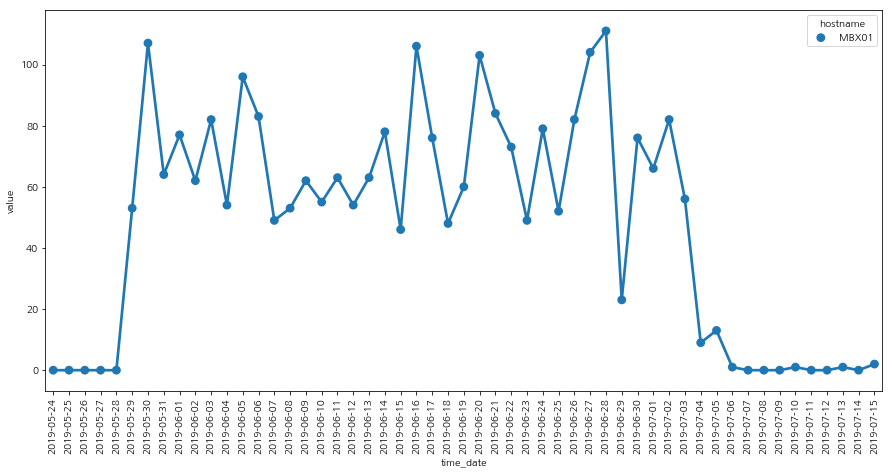

,alarm_name,hostname,time
1,Disk I/O 처리율,MBX01,2504
3,Memory 사용률,MBX01,49


>>>>>>>>>cluster20


<Figure size 432x288 with 0 Axes>

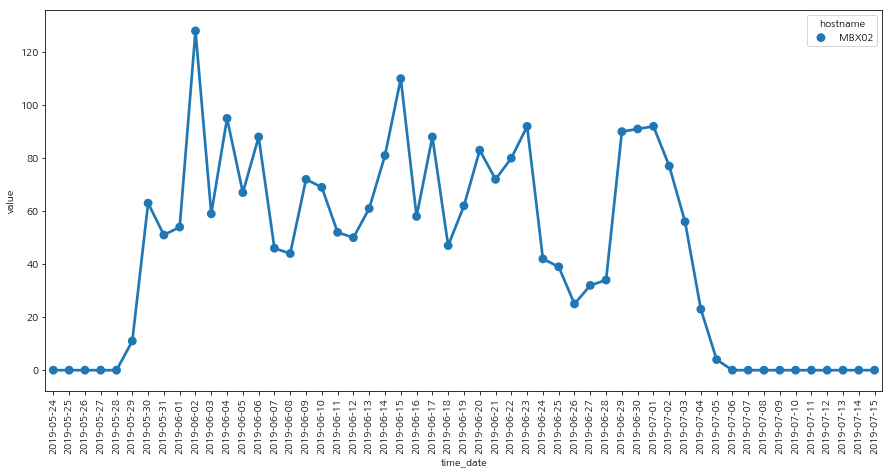

,alarm_name,hostname,time
1,Disk I/O 처리율,MBX02,2249
2,Memory 사용률,MBX02,136


>>>>>>>>>cluster21


<Figure size 432x288 with 0 Axes>

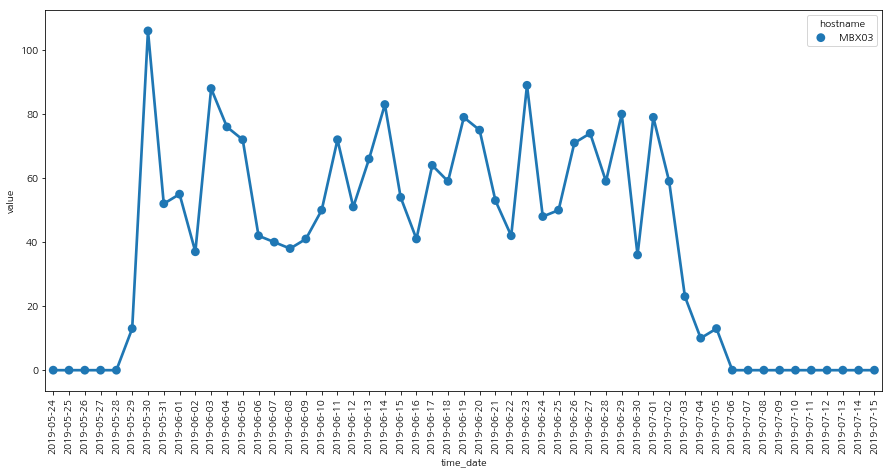

,alarm_name,hostname,time
0,Disk I/O 처리율,MBX03,2094
1,Memory 사용률,MBX03,42


>>>>>>>>>cluster22


<Figure size 432x288 with 0 Axes>

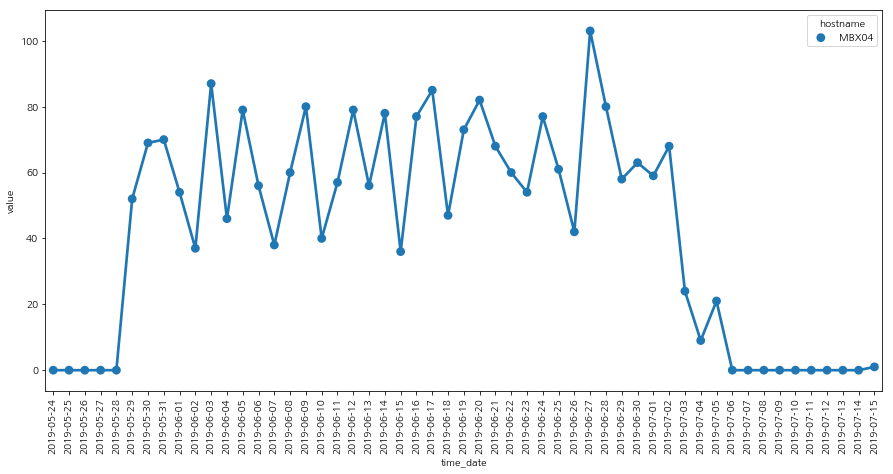

,alarm_name,hostname,time
0,Disk I/O 처리율,MBX04,2198
1,Memory 사용률,MBX04,85


>>>>>>>>>cluster23


<Figure size 432x288 with 0 Axes>

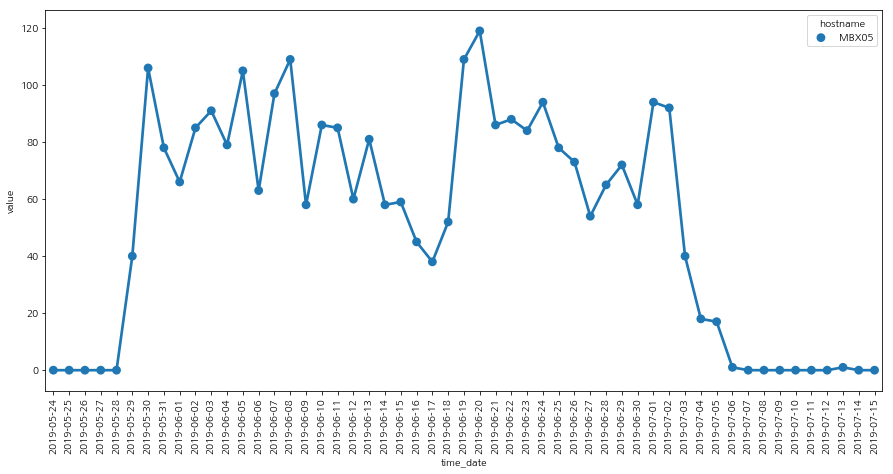

,alarm_name,hostname,time
1,Disk I/O 처리율,MBX05,2654
2,Memory 사용률,MBX05,123


>>>>>>>>>cluster24


<Figure size 432x288 with 0 Axes>

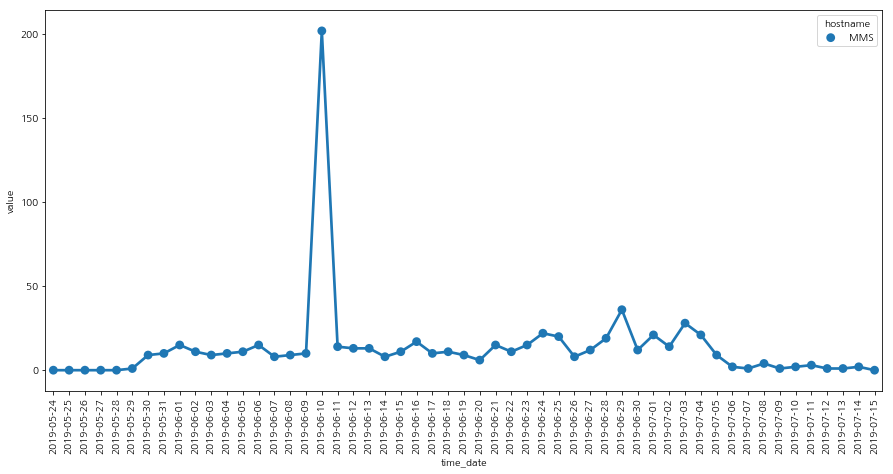

,alarm_name,hostname,time
1,Disk I/O 처리율,MMS,363
0,Data 파일 사용률 과다,MMS,181
4,Memory 사용률,MMS,150


>>>>>>>>>cluster25


<Figure size 432x288 with 0 Axes>

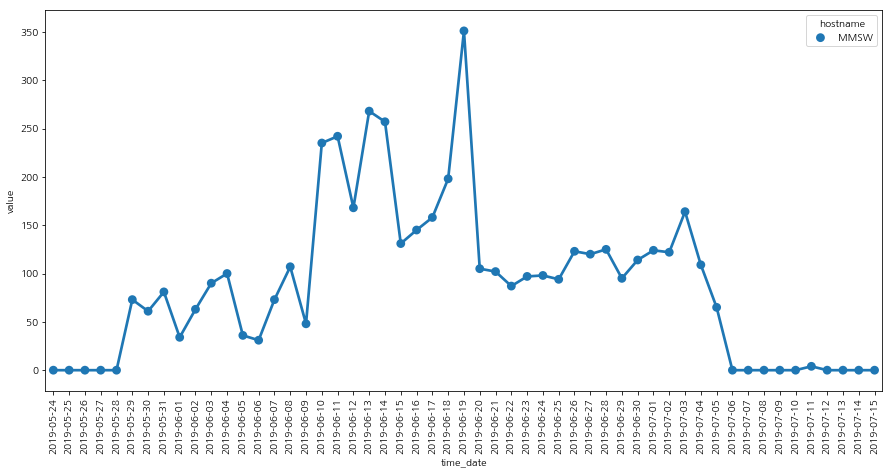

,alarm_name,hostname,time
4,데드락 발생,MMSW,1739
1,Disk I/O 처리율,MMSW,1629
3,Memory 사용률,MMSW,914
0,Data 파일 사용률 과다,MMSW,395


>>>>>>>>>cluster26


<Figure size 432x288 with 0 Axes>

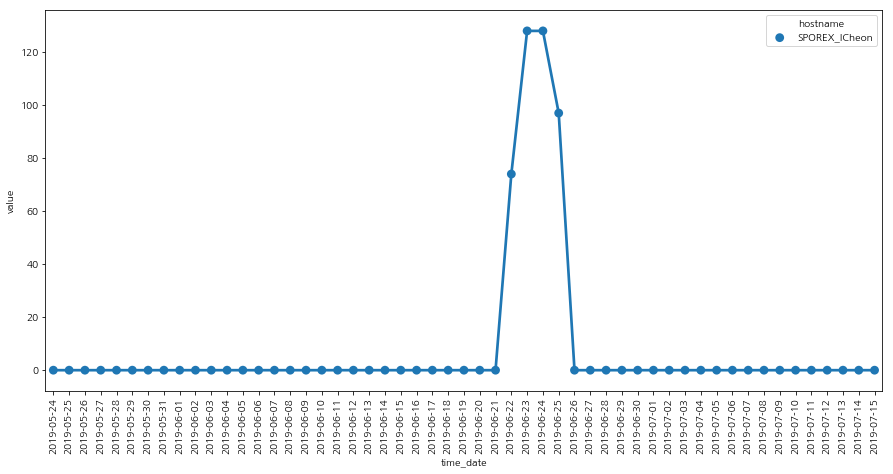

,alarm_name,hostname,time
3,포트 다운,SPOREX_ICheon,420


>>>>>>>>>cluster27


<Figure size 432x288 with 0 Axes>

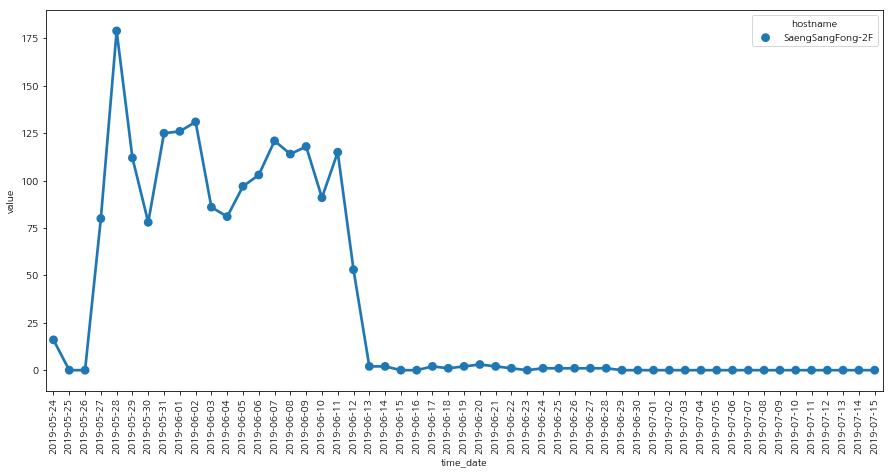

,alarm_name,hostname,time
1,포트 다운,SaengSangFong-2F,1843


>>>>>>>>>cluster28


<Figure size 432x288 with 0 Axes>

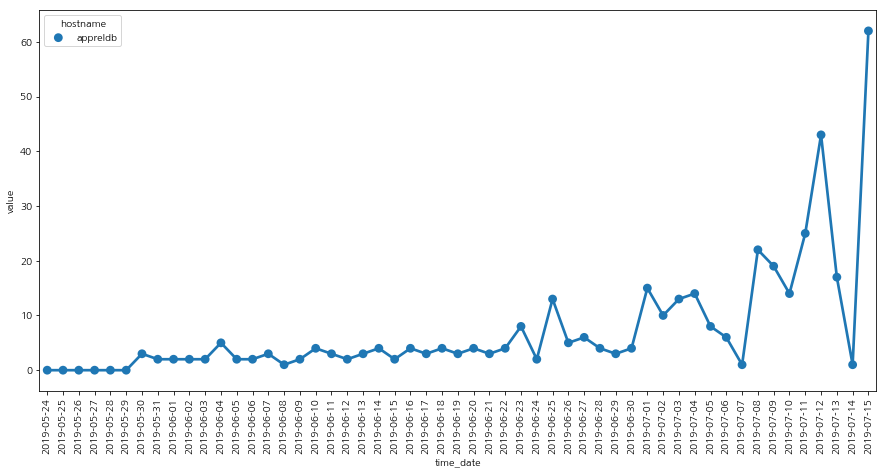

,alarm_name,hostname,time
4,Memory 사용률,appreldb,312
1,Disk I/O 처리율,appreldb,65


>>>>>>>>>cluster29


<Figure size 432x288 with 0 Axes>

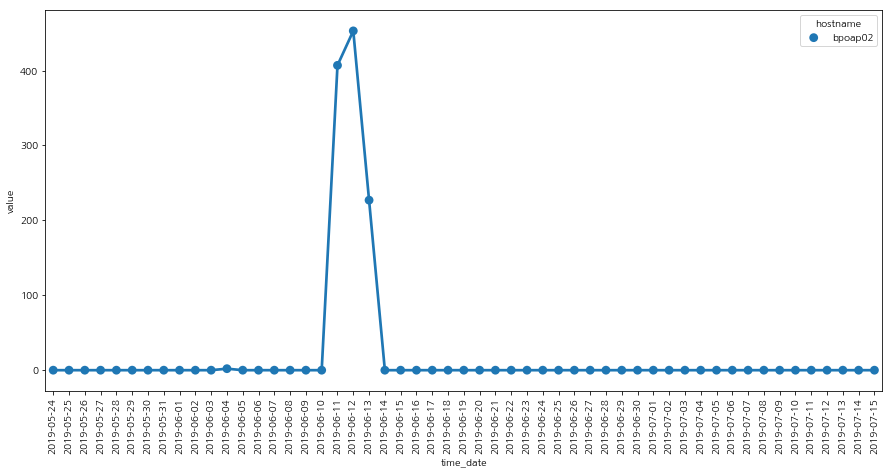

,alarm_name,hostname,time
3,WAS 평균응답시간,bpoap02,603
2,SQL 평균수행시간,bpoap02,474


>>>>>>>>>cluster30


<Figure size 432x288 with 0 Axes>

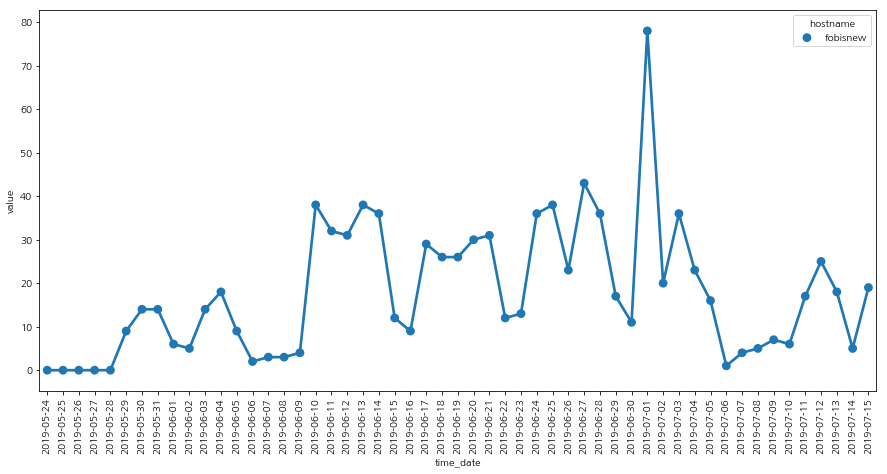

,alarm_name,hostname,time
7,데드락 발생,fobisnew,343
6,Memory 사용률,fobisnew,306
2,Disk I/O 처리율,fobisnew,177
4,Log 파일 사용률 과다,fobisnew,64
1,Data 파일 사용률 과다,fobisnew,32


>>>>>>>>>cluster31


<Figure size 432x288 with 0 Axes>

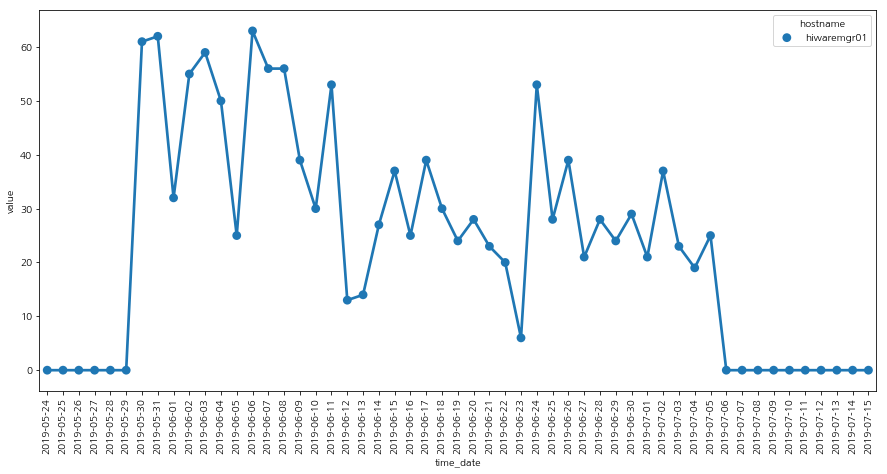

,alarm_name,hostname,time
0,Disk I/O 처리율,hiwaremgr01,1274


>>>>>>>>>cluster32


<Figure size 432x288 with 0 Axes>

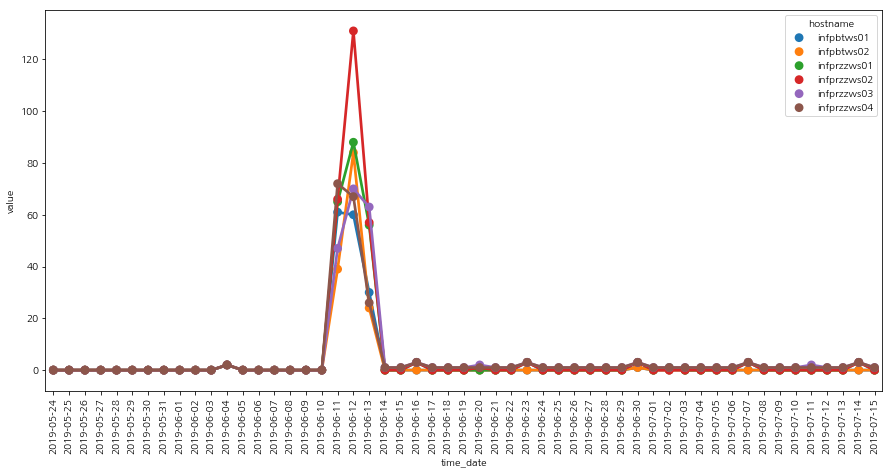

,alarm_name,hostname,time
19,WAS 평균응답시간,infprzzws02,254
18,WAS 평균응답시간,infprzzws01,209
20,WAS 평균응답시간,infprzzws03,178
21,WAS 평균응답시간,infprzzws04,163
8,SQL 평균수행시간,infpbtws01,70
9,SQL 평균수행시간,infpbtws02,64
17,WAS 평균응답시간,infpbtws02,59
16,WAS 평균응답시간,infpbtws01,53
14,WAS 인스턴스 가용성,infprzzws03,45
15,WAS 인스턴스 가용성,infprzzws04,44


>>>>>>>>>cluster33


<Figure size 432x288 with 0 Axes>

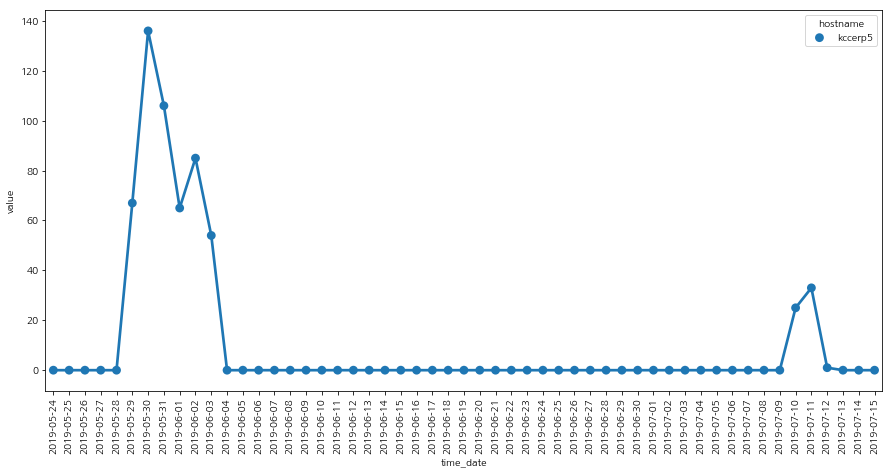

,alarm_name,hostname,time
2,좀비 프로세스,kccerp5,551


>>>>>>>>>cluster34


<Figure size 432x288 with 0 Axes>

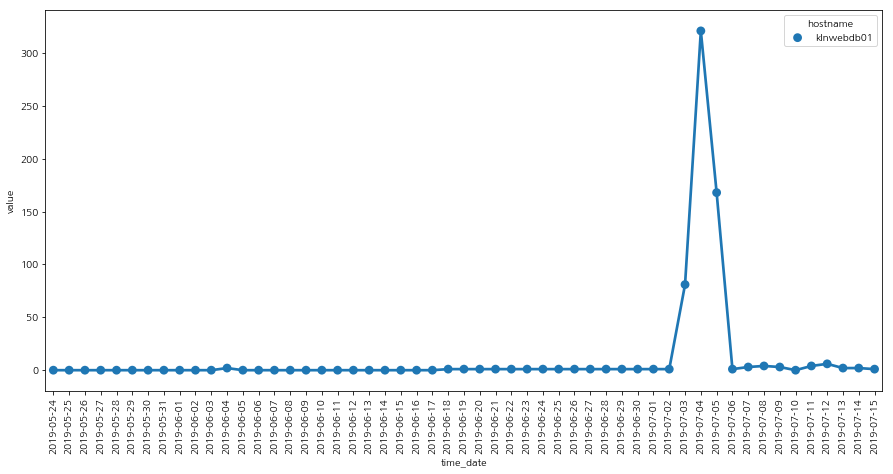

,alarm_name,hostname,time
2,Physical Write 지연,klnwebdb01,556


>>>>>>>>>cluster35


<Figure size 432x288 with 0 Axes>

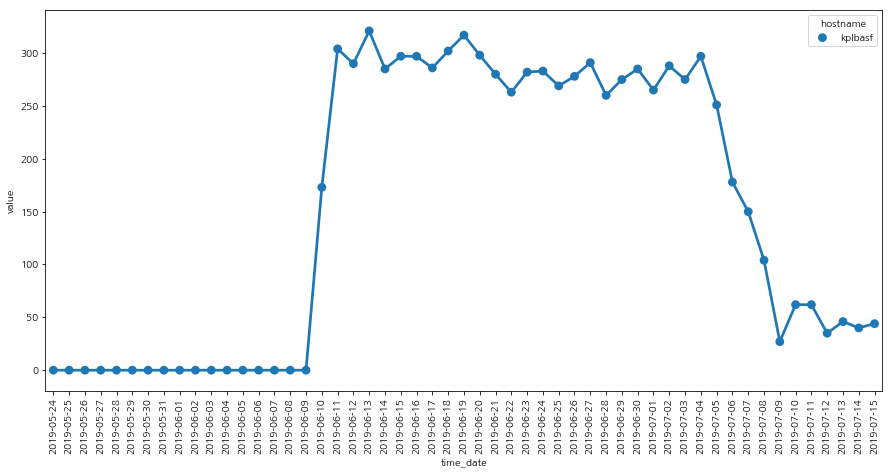

,alarm_name,hostname,time
5,데드락 발생,kplbasf,6519
6,블록된 세션,kplbasf,1415
4,Memory 사용률,kplbasf,113


>>>>>>>>>cluster36


<Figure size 432x288 with 0 Axes>

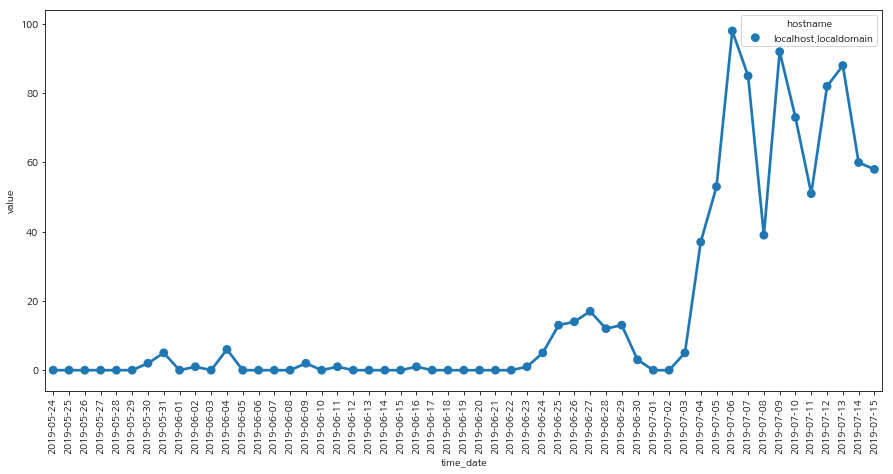

,alarm_name,hostname,time
2,Memory 사용률,localhost.localdomain,799
1,FileSystem 사용률,localhost.localdomain,86


>>>>>>>>>cluster37


<Figure size 432x288 with 0 Axes>

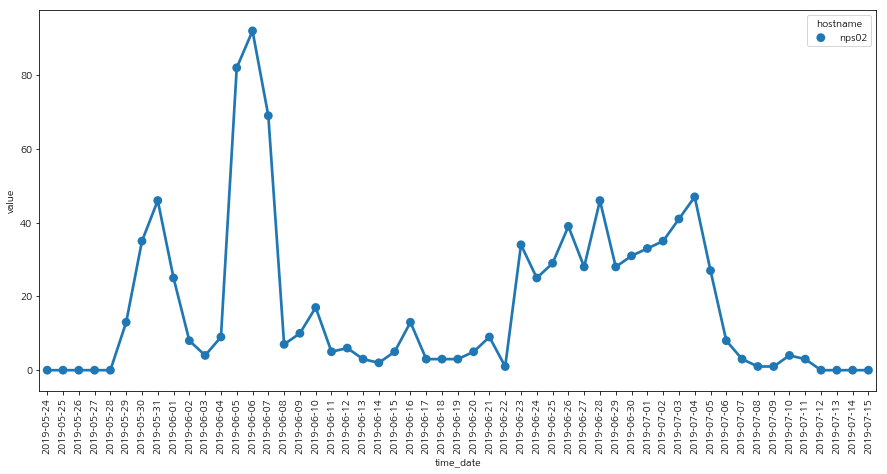

,alarm_name,hostname,time
0,Disk I/O 처리율,nps02,770
2,Memory 사용률,nps02,149


>>>>>>>>>cluster38


<Figure size 432x288 with 0 Axes>

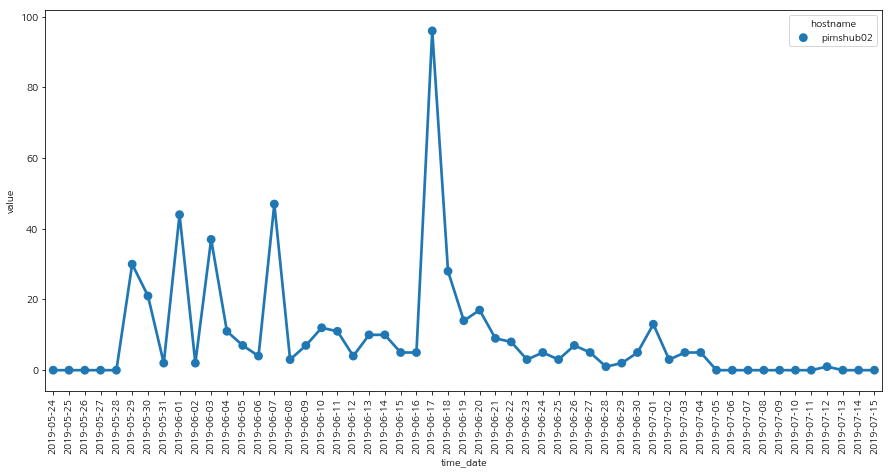

,alarm_name,hostname,time
3,Memory 사용률,pimshub02,363
4,데드락 발생,pimshub02,110


>>>>>>>>>cluster39


<Figure size 432x288 with 0 Axes>

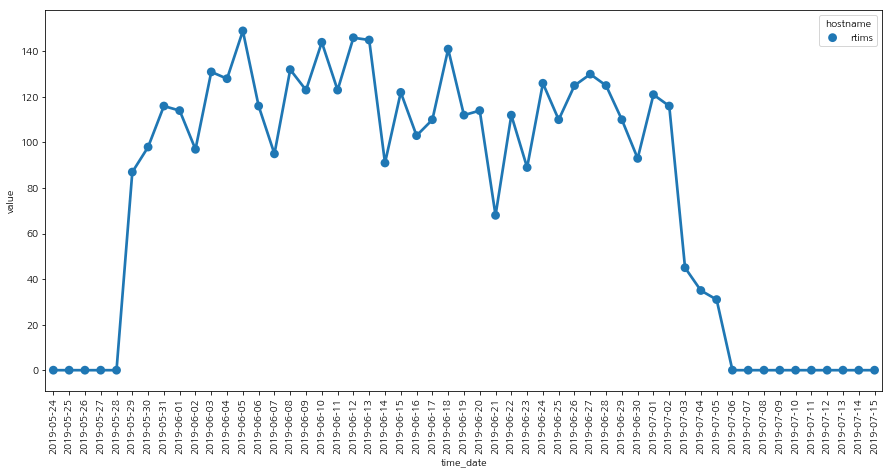

,alarm_name,hostname,time
0,Disk I/O 처리율,rtims,4171


<Figure size 432x288 with 0 Axes>

In [479]:
chart_cluster(clusters,data_alarm_result)

In [480]:
from sklearn.metrics import silhouette_samples
from matplotlib import cm
def plotSilhuette(X, y_km):
    cluster_labels = np.unique(y_km)
    n_clusters = cluster_labels.shape[0]
    silhouette_vals = silhouette_samples(X, y_km, metric='euclidean')
    y_ax_lower, y_ax_upper =0,0
    yticks = []
    
    for i , c in enumerate(cluster_labels):
        c_silhouette_vals = silhouette_vals[y_km == c]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)
        color = cm.jet(i/n_clusters)
        
        plt.barh(range(y_ax_lower,y_ax_upper), c_silhouette_vals,height=1.0,
                 edgecolor='none', color=color)
        yticks.append((y_ax_lower + y_ax_upper)/2)
        y_ax_lower += len(c_silhouette_vals)
        
    silhouette_avg = np.mean(silhouette_vals)
    plt.axvline(silhouette_avg, color='red',linestyle='--')
    plt.yticks(yticks,cluster_labels+1)
    plt.ylabel('cluster')
    plt.xlabel('silhouette')
    plt.show()

In [487]:
km = KMeans(n_clusters=40,init='k-means++', random_state=0)
km.fit(data_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=40, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

In [488]:
predict = km.predict(data_scaled)

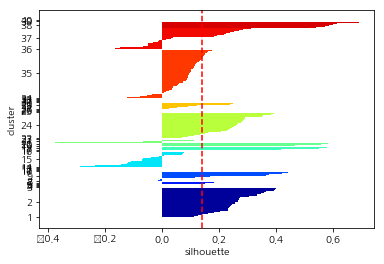

In [489]:
plotSilhuette(data_scaled,predict)